<h1>Neural Network Training Environment</h1>
<p>This notebook is designed to train both the rotation network and recognition network used to extract the seven segment moldcode digits from glass bottles. For a description of the full pipeline and research methodology <a href='https://docs.google.com/document/d/1LVSP-888HSKSlZJJ0qQHxiSSdyhNll-wLGWlapSymoI/edit?usp=sharing'>click here<a><p>
<p><font color='red'><b>After the imports, run only the blocks from the required segments as some blocks may overwrite weight files that have not been saved under different file names. Do not run all cells</b></font></p>

<h2>Imports and Datasets</h2>
<p>For labeling data use tools found in <code>\Moldcode_Network\utils</code> along with <a href="https://github.com/tzutalin/labelImg">this yolo labeler</a>. Use the bottle dataset I've provided as guidance. Most of the labeling can be started automatically to reduce time needed. Simply run <code>\Moldcode_Network\FN_detect.py</code> with save_images and save_text parameters both set to True.</p>

In [1]:
import torch
import torch.nn as nn
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import torch.nn.functional as F
import torch.optim as optim
import imutils
from YOLO_Files import train as yolo_train
from YOLO_Files import detect
from YOLO_Files.utils.datasets import *
from YOLO_Files.models import *
import rotate_net
import time


device = torch.device('cpu')
if torch.cuda.is_available():
    device = torch.device('cuda')
    
#%load_ext autoreload
#%autoreload 2

In [2]:
#Define a weights folder here
weights_folder = r'C:\Users\admin\Desktop\Moldcode_Network\weights'

<hr>
<h2>Rotation Networks</h2>
<hr>
<h3>Teacher Rotation Network</h3>
<p>This network is the most involved to train. For reasons beyond my knowledge the augmentation of the data needs to be increased gradually as starting training the full level of augmentation results in models that never converge. I have laid out a table below of the training schedule I used to in order to achieve the results I got.</p>
<table>
    <tr><th>Epoch</th><th>Augmentation</th></tr>
    <tr><td>1-5</td><td>+/-10 degrees</td></tr>
    <tr><td>6-10</td><td>+/-15 degrees</td></tr>
    <tr><td>11-15</td><td>+/-20 degrees</td></tr>
    <tr><td>16-20</td><td>+/-25 degrees</td></tr>
    <tr><td>21-25</td><td>+/-35 degrees</td></tr>
    <tr><td>...</td><td>...</td></tr>
    <tr><td>81-85</td><td>+/-90 degrees</td></tr>
</table>
<p>The level of degree augmentation can be changed in <code>\YOLO_Files\utils\datasets.py</code> line 303. Every 5 epochs took ~12 minutes to train. This time is with 3885 training images.</p>
<p>You will notice in training that there are hard accuracies and soft accuracies. Hard accuracies are outputs that are directly in line with the rotation label. Those labels however are estimated by human eye and always within 5 degree increments. For this reason soft accuracies were added in to give a more realistic sense of how well the network is doing. Soft accuracies give a leniency of 15 degrees to the network. The recognition network these images will be fed into afterwards have been trained with 20 degrees of rotational freedom. Therefore an error of up 15 degrees by the rotation network is completely acceptable.</p>

In [3]:
train_path = r'C:\Users\admin\Desktop\Moldcode_Network\Bottle_Dataset\bottles_train_rotation.txt'
TRot_set_train = LoadImagesAndLabels(train_path, img_size=416, rect=False, rotation_training=True)
TRot_loader_train = DataLoader(TRot_set_train, batch_size=8, num_workers=4, shuffle=True, pin_memory=True, collate_fn=TRot_set_train.collate_fn)

test_path = r'C:\Users\admin\Desktop\Moldcode_Network\Bottle_Dataset\bottles_test_rotation.txt'
TRot_set_test = LoadImagesAndLabels(test_path, img_size=416, rect=False, rotation_training=True, augment=False)
TRot_loader_test = DataLoader(TRot_set_test, batch_size=1, num_workers=4, shuffle=True, pin_memory=True, collate_fn=TRot_set_test.collate_fn)


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\admin\\Desktop\\Moldcode_Network\\Bottle_Dataset\\bottles_train_rotation.txt'

In [9]:
TRot_net = rotate_net.Teacher()
#print(TRot_net)
TRot_net = TRot_net.to(device)
optimizer = optim.Adam(TRot_net.parameters())
criterion = nn.CrossEntropyLoss()
epoch_count = 0
best_acc = 0

In [17]:
#This is the block you will need to run, then adjust the augmentation settings as outlined above, before running again.
t = time.time()
for epoch in range(5):
    epoch_count += 1
    running_loss = 0.0
    for i, data in enumerate(TRot_loader_train, 0):
        
        inputs, labels, img_path, _, _ = data
        inputs = inputs.to(device)
        labels = labels.long()
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = TRot_net(inputs)
        loss = criterion(outputs, labels[:, 1])
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 200 == 199:    # print every 200 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 199))
            running_loss = 0.0
            
    print("Testing after {} epochs".format(epoch_count))
    #If soft accuracies go above 90% then miscategorized (prediction, label) pairs will print.
    #A prediction of 360 means the network believes there are no digits and therefore no orientation.
    test_acc = rotate_net.test_net(TRot_net, TRot_loader_test, device)
    
    if test_acc > best_acc:
        best_acc = test_acc
        torch.save(TRot_net.state_dict(), "{}\TRot_net_{}_{}.pt".format(weights_folder, epoch_count,int(best_acc)))
        print("New best weights saved. {}\TRot_net_{}_{}.pt".format(weights_folder, epoch_count,int(best_acc)))
        
print('Finished Training in {0:2.2f} minutes'.format((time.time()-t)/60))

[1,   200] loss: 1.069
[1,   400] loss: 0.979
Testing after 26 epochs
Average time per inference: 0.0245
Hard accuracy of predictions on the test images: 86%
Soft accuracy of predictions within 15 degrees of correct label = 0.884
[2,   200] loss: 1.113
[2,   400] loss: 1.018
Testing after 27 epochs
Average time per inference: 0.0246
Hard accuracy of predictions on the test images: 84%
Soft accuracy of predictions within 15 degrees of correct label = 0.899
[3,   200] loss: 1.067
[3,   400] loss: 1.058
Testing after 28 epochs
Average time per inference: 0.0244
Hard accuracy of predictions on the test images: 86%
Soft accuracy of predictions within 15 degrees of correct label = 0.895
[4,   200] loss: 1.138
[4,   400] loss: 2.386
Testing after 29 epochs
Average time per inference: 0.0248
Hard accuracy of predictions on the test images: 61%
Soft accuracy of predictions within 15 degrees of correct label = 0.835
[5,   200] loss: 1.565
[5,   400] loss: 1.398
Testing after 30 epochs
Average ti

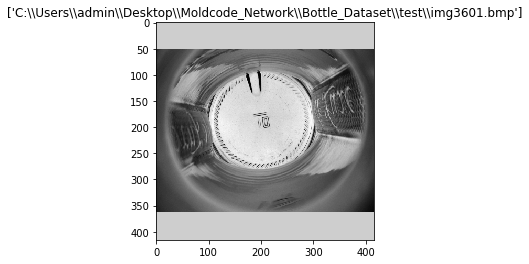

Prediction: 360
Label: 175


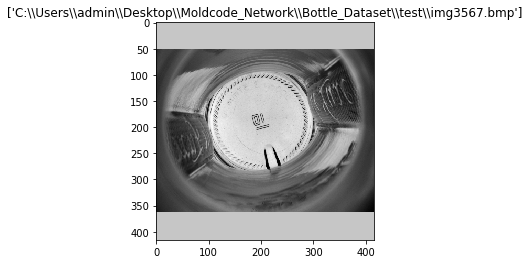

Prediction: 130
Label: 340


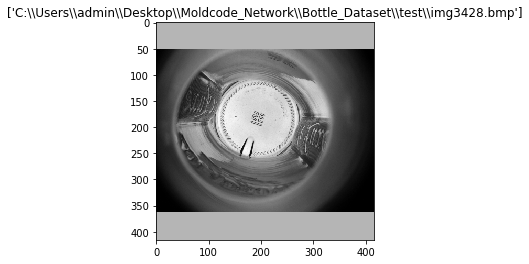

Prediction: 330
Label: 20


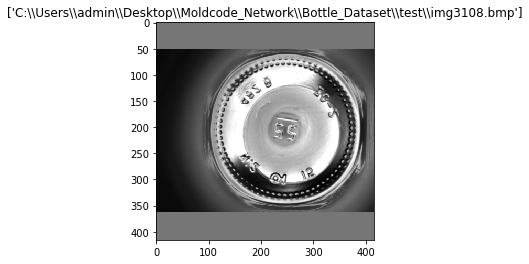

Prediction: 215
Label: 190


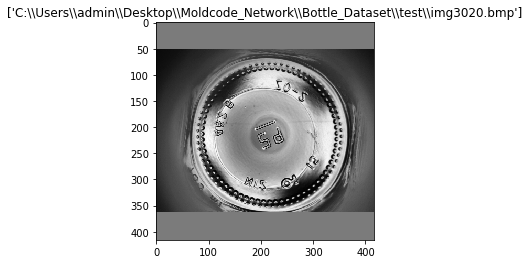

Prediction: 50
Label: 155


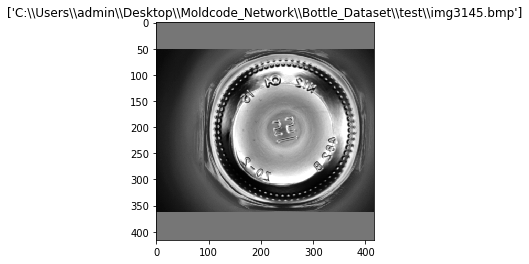

Prediction: 80
Label: 345


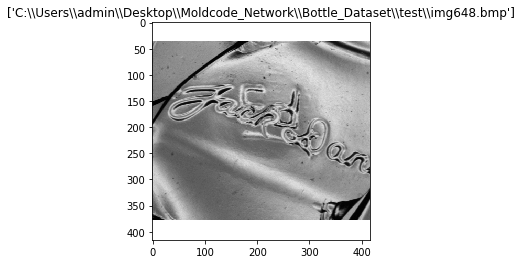

Prediction: 270
Label: 0


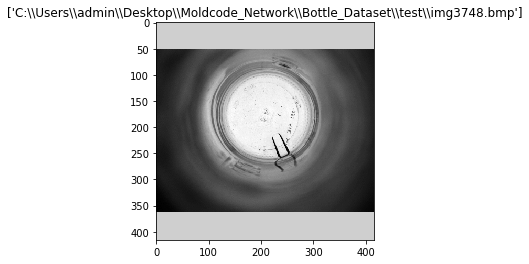

Prediction: 125
Label: 290


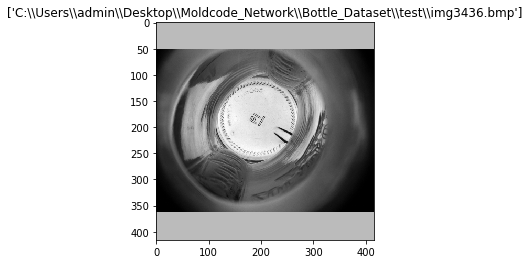

Prediction: 110
Label: 300


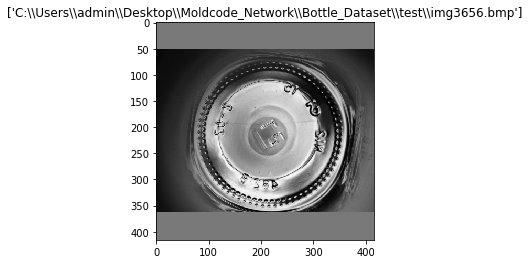

Prediction: 360
Label: 60


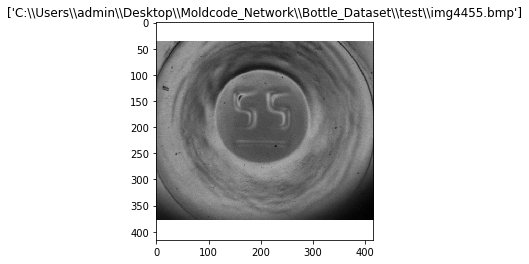

Prediction: 180
Label: 0


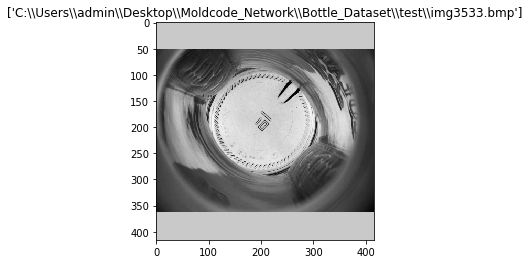

Prediction: 360
Label: 225


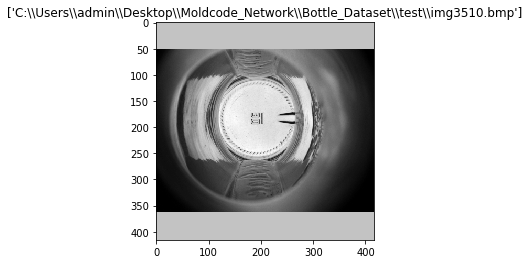

Prediction: 95
Label: 270


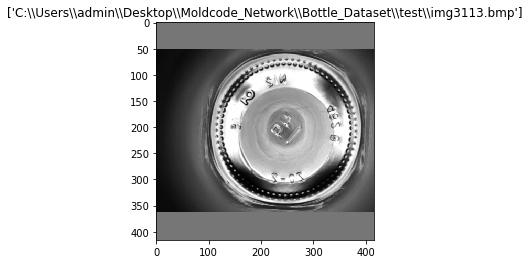

Prediction: 50
Label: 310


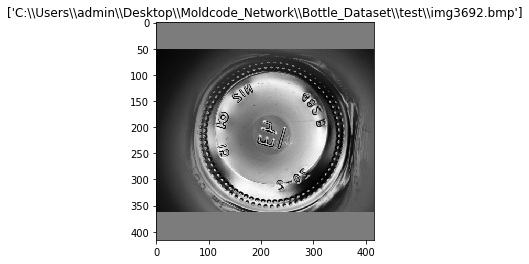

Prediction: 110
Label: 285


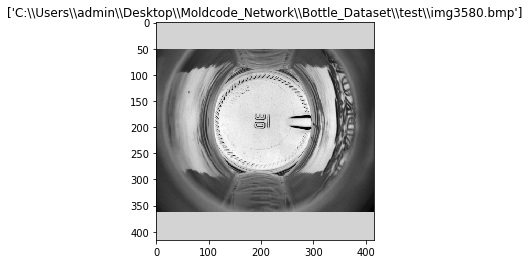

Prediction: 100
Label: 270


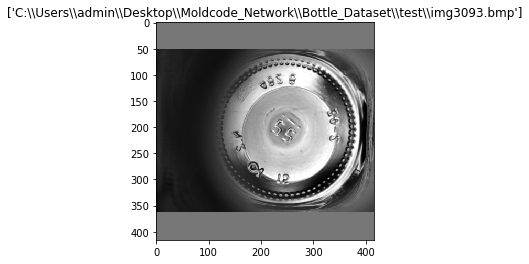

Prediction: 340
Label: 220


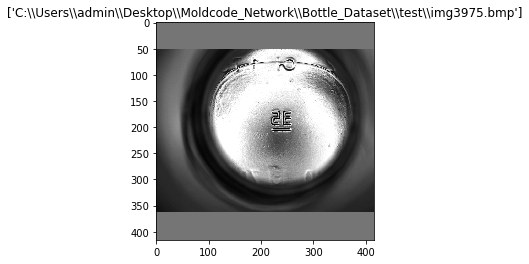

Prediction: 95
Label: 0


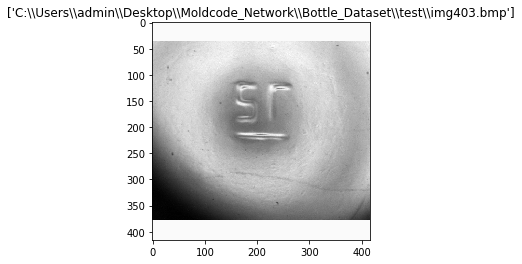

Prediction: 90
Label: 0


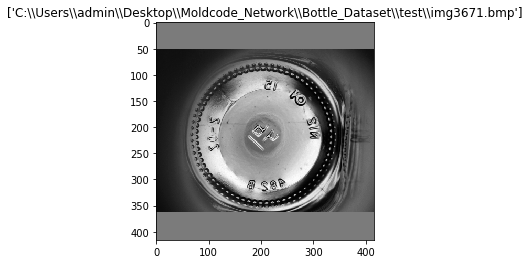

Prediction: 360
Label: 40


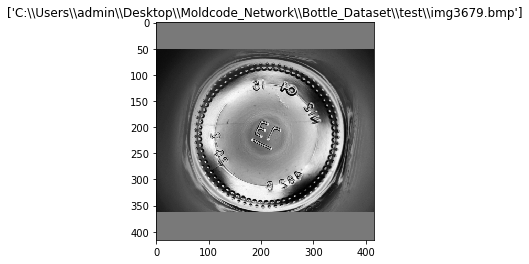

Prediction: 285
Label: 25


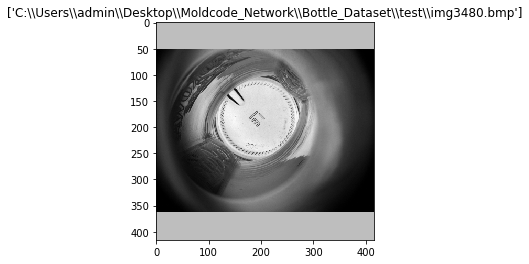

Prediction: 310
Label: 140


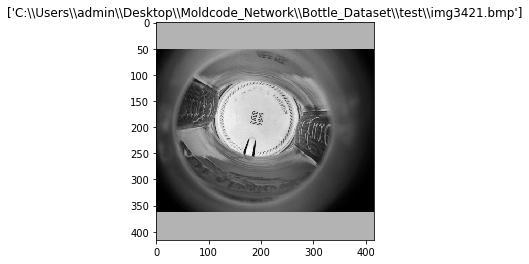

Prediction: 340
Label: 15


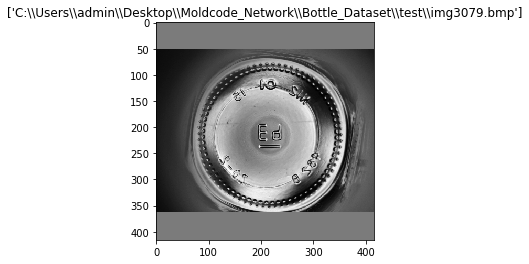

Prediction: 95
Label: 0


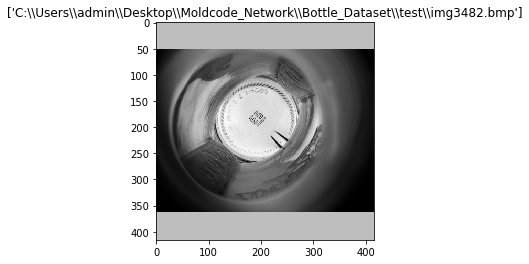

Prediction: 110
Label: 310


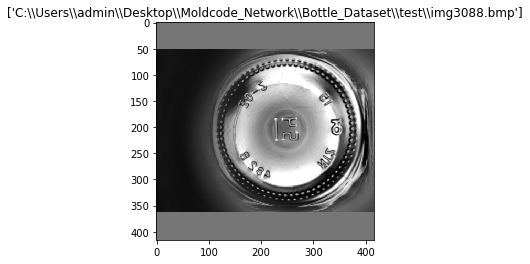

Prediction: 245
Label: 85


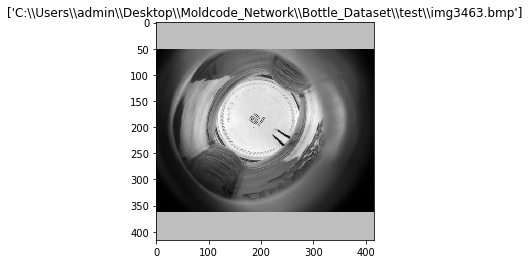

Prediction: 110
Label: 310


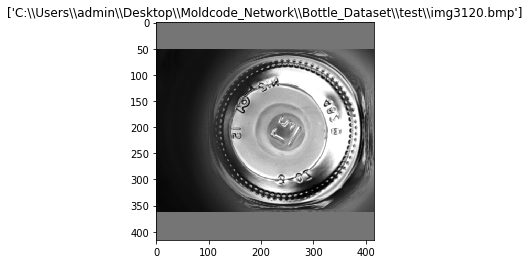

Prediction: 125
Label: 300


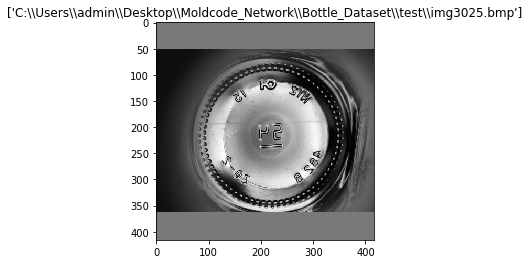

Prediction: 75
Label: 355


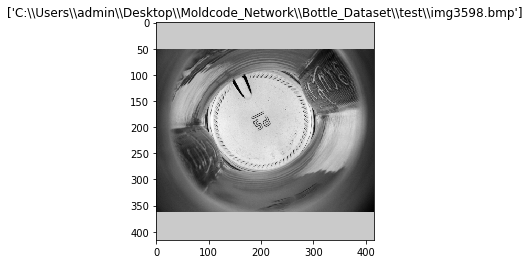

Prediction: 360
Label: 150


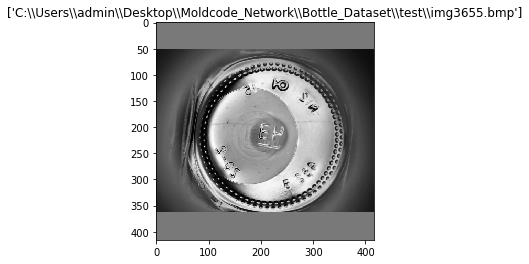

Prediction: 110
Label: 10


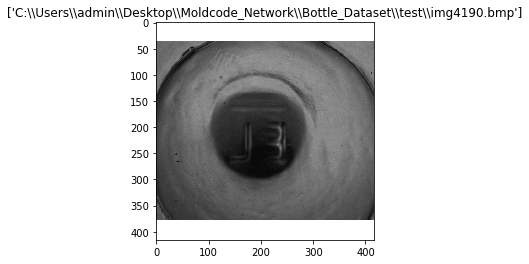

Prediction: 275
Label: 180


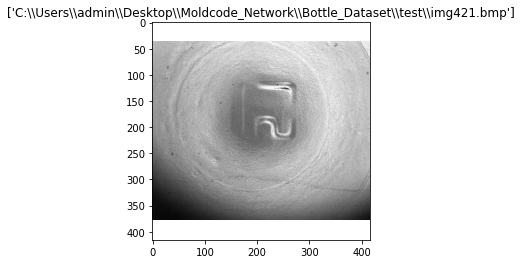

Prediction: 185
Label: 90


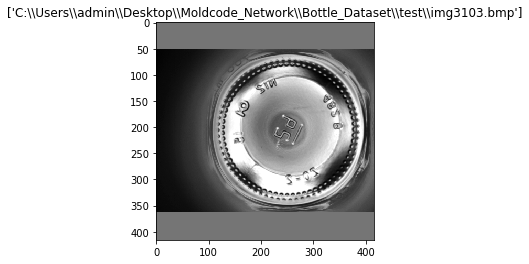

Prediction: 155
Label: 295


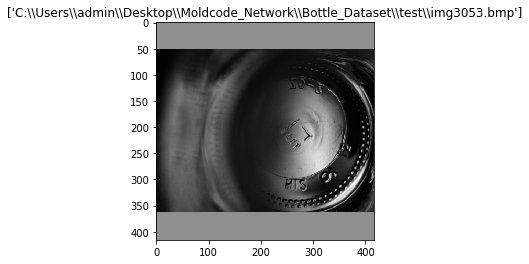

Prediction: 360
Label: 140


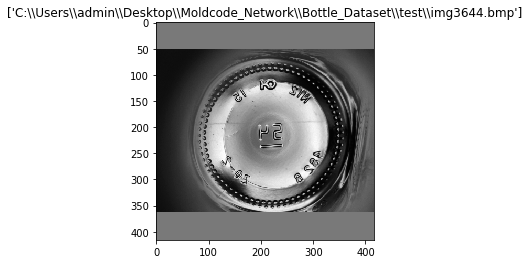

Prediction: 75
Label: 355


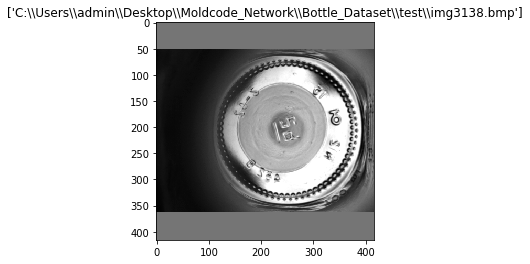

Prediction: 330
Label: 75


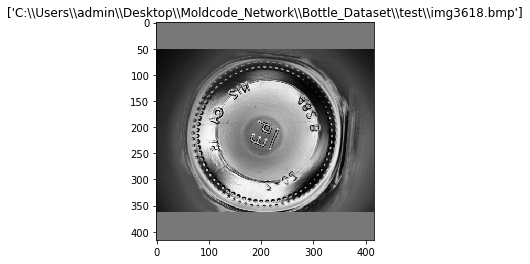

Prediction: 110
Label: 290


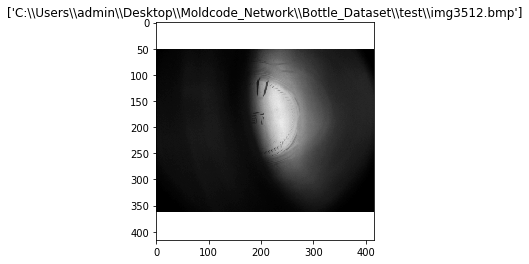

Prediction: 5
Label: 185


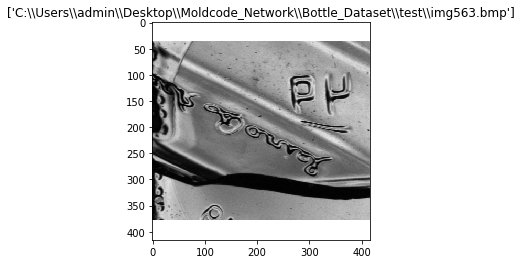

Prediction: 185
Label: 0


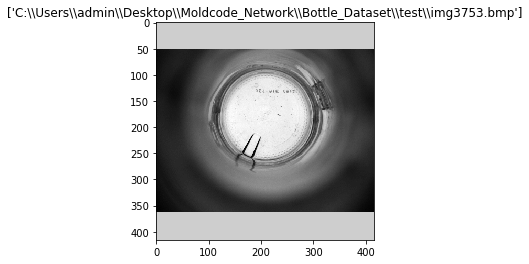

Prediction: 25
Label: 360


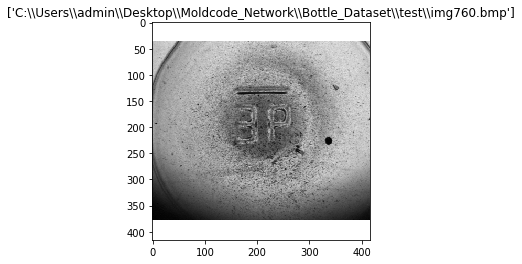

Prediction: 5
Label: 180


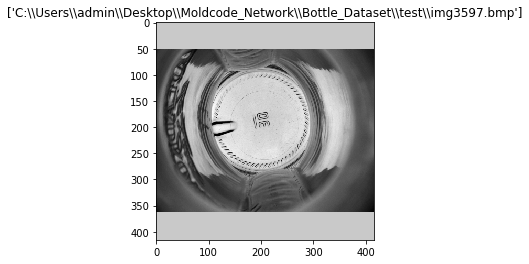

Prediction: 110
Label: 80


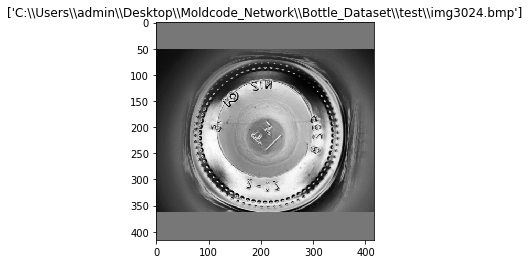

Prediction: 360
Label: 315


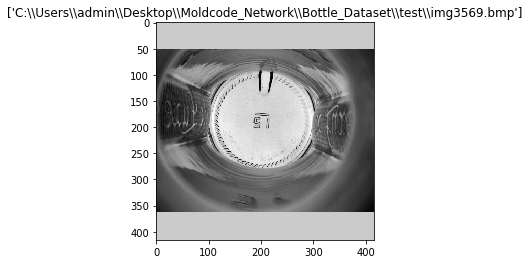

Prediction: 110
Label: 185


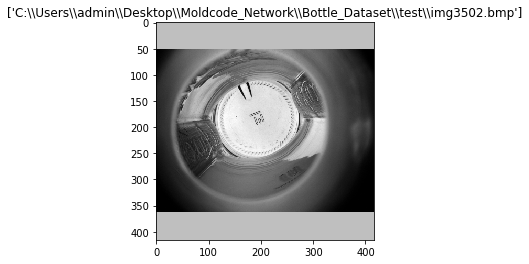

Prediction: 360
Label: 160


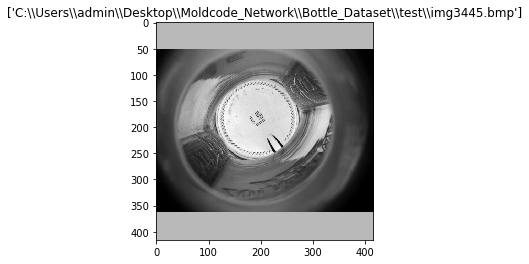

Prediction: 130
Label: 325


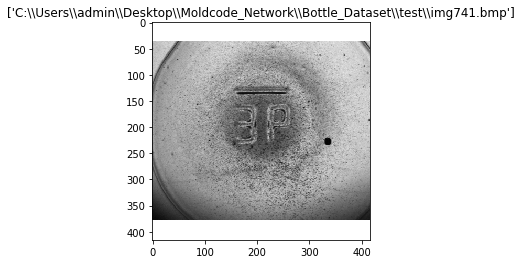

Prediction: 5
Label: 180


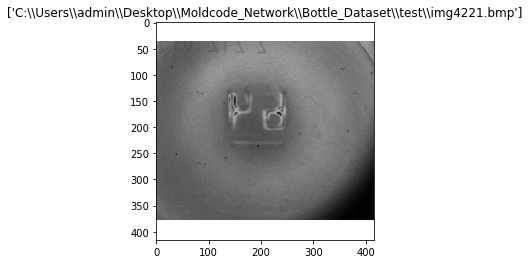

Prediction: 270
Label: 0


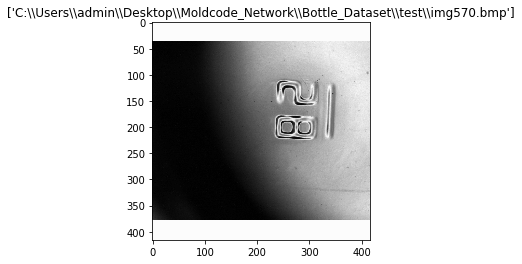

Prediction: 100
Label: 270


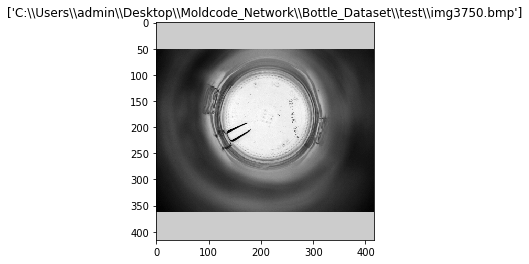

Prediction: 360
Label: 15


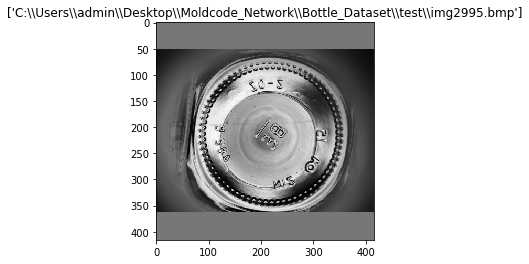

Prediction: 20
Label: 125


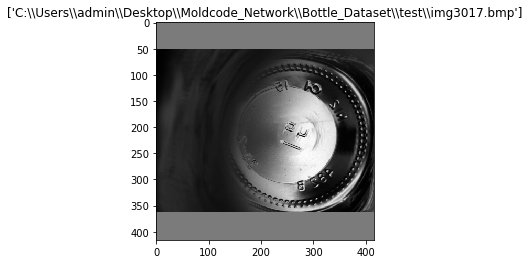

Prediction: 360
Label: 20


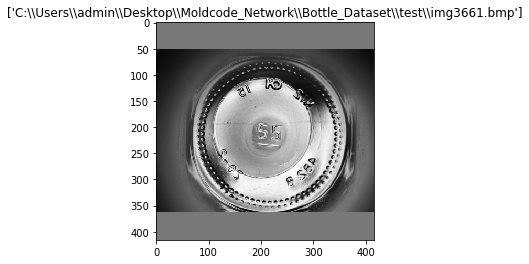

Prediction: 110
Label: 5


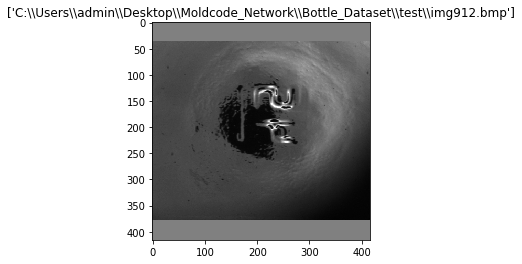

Prediction: 5
Label: 90


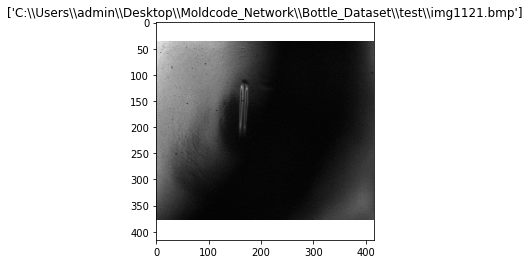

Prediction: 360
Label: 90


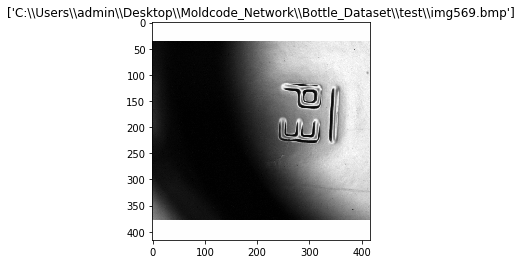

Prediction: 360
Label: 270


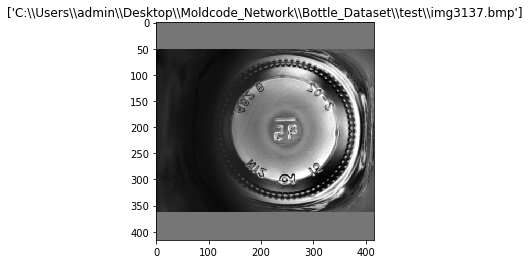

Prediction: 215
Label: 180


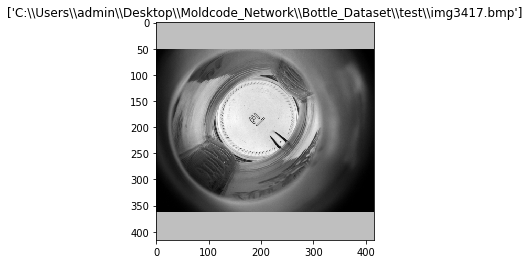

Prediction: 125
Label: 315
Average time per inference: 0.0405
Hard accuracy of predictions on the test images: 78%
Predictions off by more than 15 degrees
[(360, 175), (130, 340), (330, 20), (215, 190), (50, 155), (80, 345), (270, 0), (125, 290), (110, 300), (360, 60), (180, 0), (360, 225), (95, 270), (50, 310), (110, 285), (100, 270), (340, 220), (95, 0), (90, 0), (360, 40), (285, 25), (310, 140), (340, 15), (95, 0), (110, 310), (245, 85), (110, 310), (125, 300), (75, 355), (360, 150), (110, 10), (275, 180), (185, 90), (155, 295), (360, 140), (75, 355), (330, 75), (110, 290), (5, 185), (185, 0), (25, 360), (5, 180), (110, 80), (360, 315), (110, 185), (360, 160), (130, 325), (5, 180), (270, 0), (100, 270), (360, 15), (20, 125), (360, 20), (110, 5), (5, 90), (360, 90), (360, 270), (215, 180), (125, 315)]
Soft accuracy of predictions within 15 degrees of correct label = 0.915


78.03468208092485

In [28]:
#Run this if you'd like to see what the error images are.
rotate_net.test_net(TRot_net, TRot_loader_test, device, show_errors=True)

<h4>Load/Save Weights</h4>
<p>The reason for saving the epoch count as a part of the name is to show the flexibility of the network as it has trained on higher levels of rotational augmentation. High accuracies from low epoch counts should be considered fragile to rotations that don't fit the majority of the data's 0, 90, 180, and 270 rotations.</p>

In [22]:
weight_file = 'SRot_net_19_91.pt'

In [23]:
torch.save(SRot_net.state_dict(), weights_folder + os.sep + weight_file)

In [11]:
TRot_net.load_state_dict(torch.load(weights_folder + os.sep + weight_file))

IncompatibleKeys(missing_keys=[], unexpected_keys=[])

<h3>Student Rotation Network</h3>
<p>Student networks will be working with smaller images to help improve speed and need their own loaders as we will be using different loaders to feed the networks. <font color='red'>shuffle must be turned off</font> so that both networks are identifying the same images</p>

In [3]:
train_path = r'C:\Users\admin\Desktop\Moldcode_Network\Bottle_Dataset\bottles_train_rotation.txt'
SRot_set_train = LoadImagesAndLabels(train_path, img_size=256, rect=False, rotation_training=True, student=True, augment=False)
SRot_loader_train = DataLoader(SRot_set_train, batch_size=8, num_workers=4, shuffle=False, pin_memory=True, collate_fn=SRot_set_train.collate_fn)

TRot_set_train = LoadImagesAndLabels(train_path, img_size=416, rect=False, rotation_training=True)
TRot_loader_train = DataLoader(TRot_set_train, batch_size=1, num_workers=4, shuffle=False, pin_memory=True, collate_fn=TRot_set_train.collate_fn)

test_path = r'C:\Users\admin\Desktop\Moldcode_Network\Bottle_Dataset\bottles_test_rotation.txt'
SRot_set_test = LoadImagesAndLabels(test_path, img_size=256, rect=False, rotation_training=True, augment=False)
SRot_loader_test = DataLoader(SRot_set_test, batch_size=1, num_workers=4, shuffle=True, pin_memory=True, collate_fn=SRot_set_test.collate_fn)


Reading labels: 100%|████████████████████████████████████████████████████████████| 3885/3885 [00:00<00:00, 7736.03it/s]


<p>This next cell will take the geometric mean of the outputs of every set of teacher weights and save those as the targets for the student network. <font color='red'>Please make sure the weights folder only includes quality sets of weights.</font> The student network will be trained with these averaged outputs.</p>
<p>As we are essentially evaluating many models at once, this cell takes quite some time to run. It's good practice to review your weights folder. However it is important to note that this cell need only be run when new teacher networks have been trained.</p>

In [5]:
teacher_nets = []

with os.scandir(weights_folder) as folder:
    for file in folder:
        if "TRot" in file.name:
            teacher = rotate_net.Teacher()
            teacher.load_state_dict(torch.load(weights_folder + os.sep + file.name))
            teacher.eval()
            teacher_nets.append(teacher)
print("{} teacher models were found and created.".format(len(teacher_nets))) 

with torch.no_grad():            
    for i, data in enumerate(TRot_loader_train, 0):
        inputs, labels, img_path, _, teacher_outputs = data
        inputs = inputs.to(device)
        labels = labels.long()
        labels = labels.to(device)
        outputs = torch.zeros((1,73)).to(device)
        
        #To avoid crashing the gpu memory it is important to only keep one network in gpu memory at a time
        for net in teacher_nets:
            net.to(device)
            outputs = outputs + net(inputs)
            net.to('cpu')
            
        outputs =  outputs / len(teacher_nets)
        outputs = outputs.cpu().numpy()
        np.save(img_path[0][:-4] + ".teacher", outputs)

In [4]:
#Computes knowledge distillation or dark knowledge loss for the student training.
#Based on the Geoff Hinton's work https://arxiv.org/pdf/1503.02531.pdf
#The alpha and temperature parameters are hyperparameters and can be changed. The values I chose are based on Hinton's paper.
def kd_loss(outputs, labels, teacher_outputs, alpha, temperature):
    a = alpha
    T = temperature
    KD_loss = nn.KLDivLoss()(F.log_softmax(outputs/T, dim=1),
                             F.softmax(teacher_outputs/T, dim=1)) * (a * T * T) + F.cross_entropy(outputs, labels) * (1. - a)

    return KD_loss

In [5]:
SRot_net = rotate_net.Student()
#print(SRot_net)
SRot_net = SRot_net.to(device)
optimizer = optim.Adam(SRot_net.parameters())
epoch_count = 0
best_acc = 0
alpha = 0.7
temp = 20

<p>Student networks learn incredibly fast and there should be no need to go beyond 30 epochs.</p>

In [6]:
t = time.time()
for epoch in range(30):
    epoch_count += 1
    running_loss = 0.0
    for i, data in enumerate(SRot_loader_train, 0):
        
        inputs, labels, img_path, _, teacher_outputs = data
        inputs = inputs.to(device)
        labels = labels.long()
        labels = labels.to(device)
        teacher_outputs = teacher_outputs.to(device)
        

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = SRot_net(inputs)
        loss = kd_loss(outputs, labels[:, 1], teacher_outputs, alpha, temp)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 200 == 199:    # print every 200 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 199))
            running_loss = 0.0
            
    print("Testing after {} epochs".format(epoch_count))
    #If soft accuracies go above 90% then miscategorized (prediction, label) pairs will print.
    #A prediction of 360 means the network believes there are no digits and therefore no orientation.
    test_acc = rotate_net.test_net(SRot_net, SRot_loader_test, device)
    
    if test_acc > best_acc:
        best_acc = test_acc
        torch.save(SRot_net.state_dict(), "{}\SRot_net_{}_{}.pt".format(weights_folder, epoch_count,int(best_acc)))
        print("New best weights saved. {}\SRot_net_{}_{}.pt".format(weights_folder, epoch_count,int(best_acc)))
        
print('Finished Training in {0:2.2f} minutes'.format((time.time()-t)/60))

D:\toolkits.win\anaconda3-5.2.0\envs\dlwin10\lib\site-packages\torch\nn\functional.py:1992: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."


[1,   200] loss: 1209.433
[1,   400] loss: 1209.048
Testing after 1 epochs
Average time per inference: 0.0038
Hard accuracy of predictions on the test images: 74%
Soft accuracy of predictions within 15 degrees of correct label = 0.763
New best weights saved. C:\Users\admin\Desktop\Moldcode_Network\weights\SRot_net_1_74.pt
[2,   200] loss: 1215.659
[2,   400] loss: 1211.994
Testing after 2 epochs
Average time per inference: 0.0041
Hard accuracy of predictions on the test images: 59%
Soft accuracy of predictions within 15 degrees of correct label = 0.610
[3,   200] loss: 1217.031
[3,   400] loss: 1213.012
Testing after 3 epochs
Average time per inference: 0.0039
Hard accuracy of predictions on the test images: 81%
Soft accuracy of predictions within 15 degrees of correct label = 0.828
New best weights saved. C:\Users\admin\Desktop\Moldcode_Network\weights\SRot_net_3_81.pt
[4,   200] loss: 1224.616
[4,   400] loss: 1213.847
Testing after 4 epochs
Average time per inference: 0.0037
Hard ac

[27,   200] loss: 1425.818
[27,   400] loss: 1327.893
Testing after 27 epochs
Average time per inference: 0.0036
Hard accuracy of predictions on the test images: 92%
Predictions off by more than 15 degrees
[(100, 0), (90, 140), (240, 210), (100, 10), (100, 300), (285, 185), (170, 345), (180, 0), (310, 75), (125, 220), (90, 270), (180, 325), (170, 190), (360, 90), (180, 270), (15, 270), (170, 295), (180, 270), (155, 360), (100, 200), (180, 270), (180, 325), (95, 270), (310, 335), (160, 85), (100, 15)]
Soft accuracy of predictions within 15 degrees of correct label = 0.962
New best weights saved. C:\Users\admin\Desktop\Moldcode_Network\weights\SRot_net_27_92.pt
[28,   200] loss: 1596.986
[28,   400] loss: 1372.695
Testing after 28 epochs
Average time per inference: 0.0037
Hard accuracy of predictions on the test images: 90%
Predictions off by more than 15 degrees
[(180, 270), (165, 295), (165, 190), (180, 270), (155, 360), (180, 0), (90, 220), (180, 270), (20, 270), (360, 90), (180, 325)

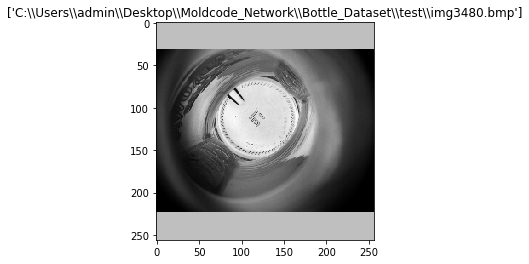

Prediction: 270
Label: 140


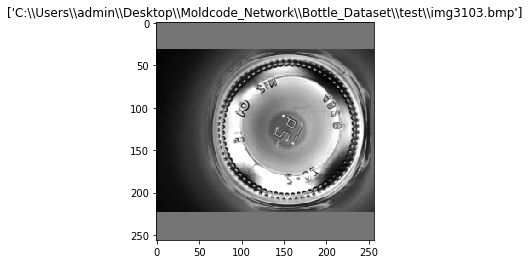

Prediction: 360
Label: 295


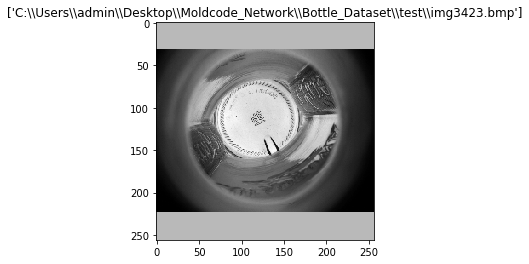

Prediction: 360
Label: 335


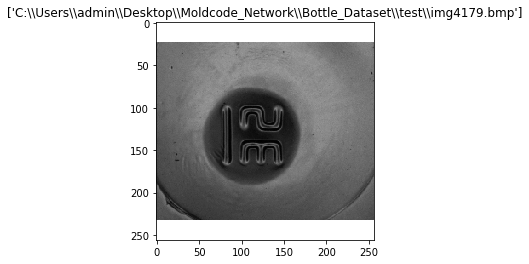

Prediction: 0
Label: 90


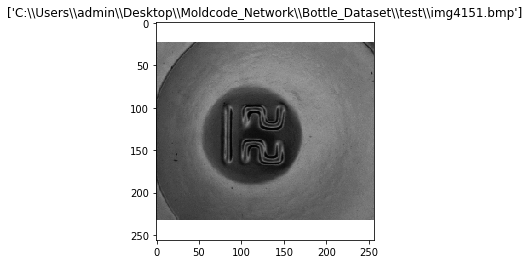

Prediction: 270
Label: 90


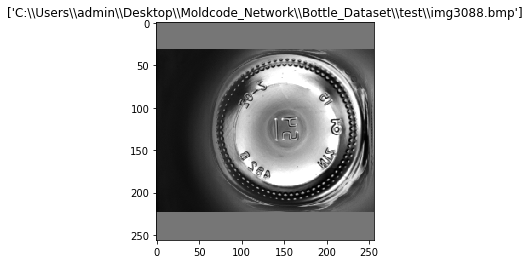

Prediction: 180
Label: 85


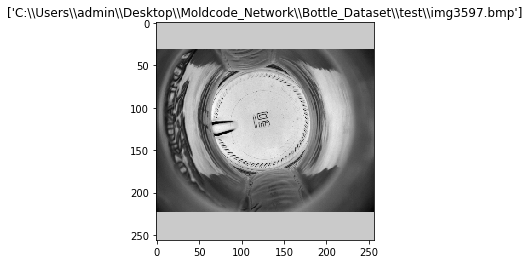

Prediction: 360
Label: 80


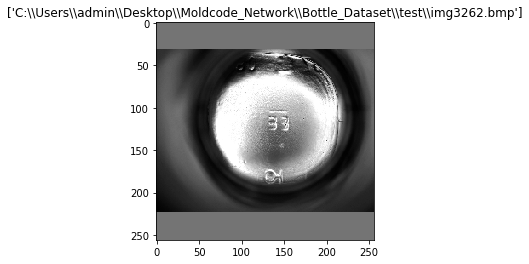

Prediction: 90
Label: 180


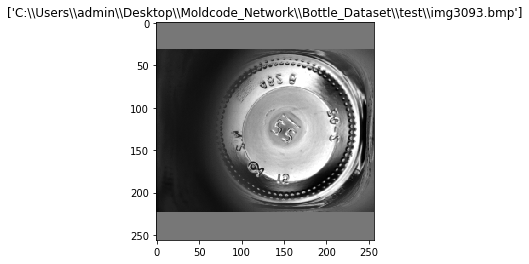

Prediction: 180
Label: 220


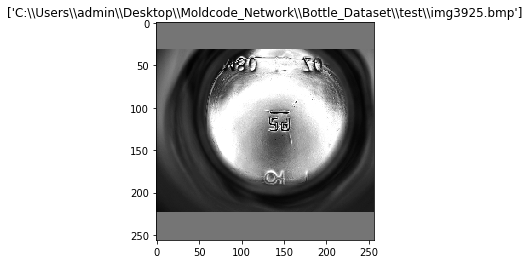

Prediction: 90
Label: 180


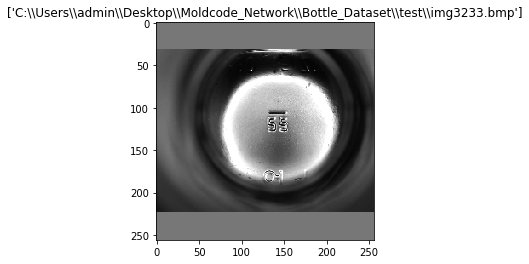

Prediction: 90
Label: 180


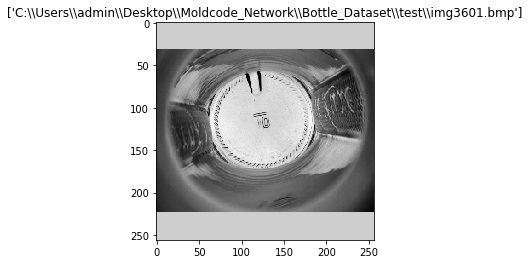

Prediction: 90
Label: 175


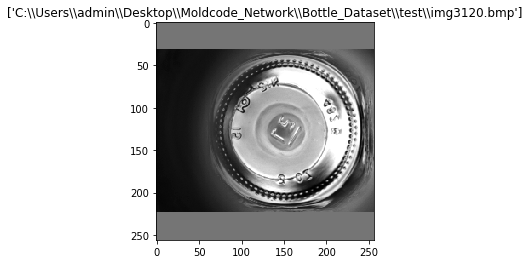

Prediction: 180
Label: 300


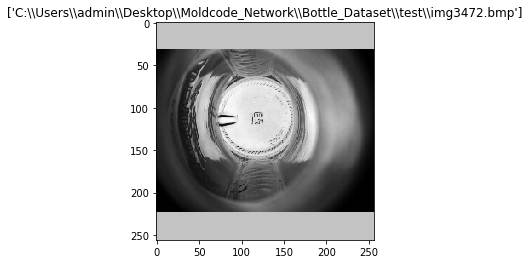

Prediction: 0
Label: 85


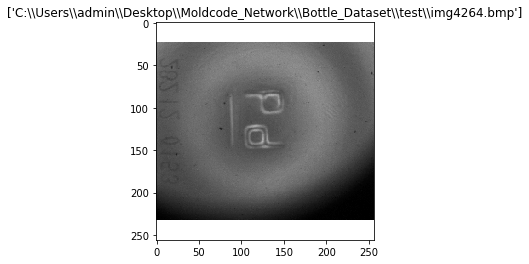

Prediction: 270
Label: 90


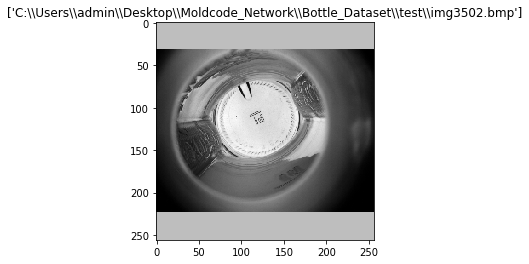

Prediction: 360
Label: 160


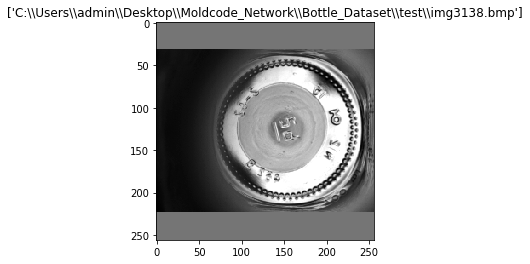

Prediction: 180
Label: 75


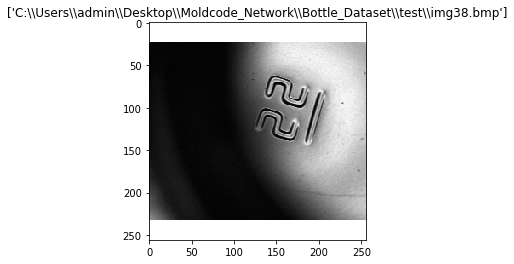

Prediction: 90
Label: 285


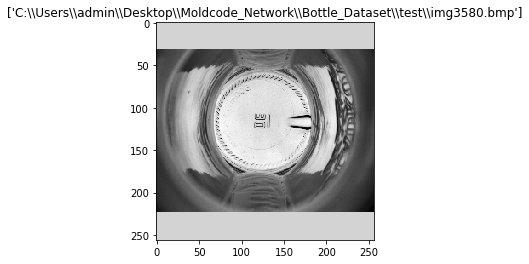

Prediction: 180
Label: 270


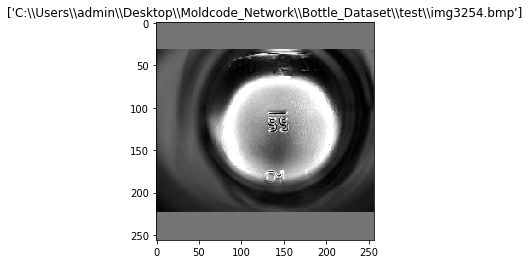

Prediction: 90
Label: 180


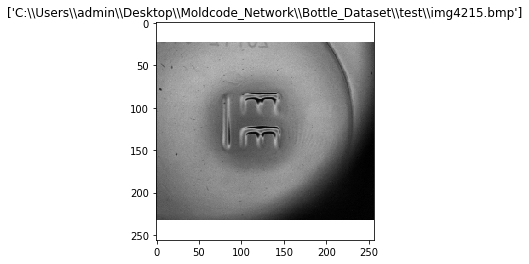

Prediction: 270
Label: 90


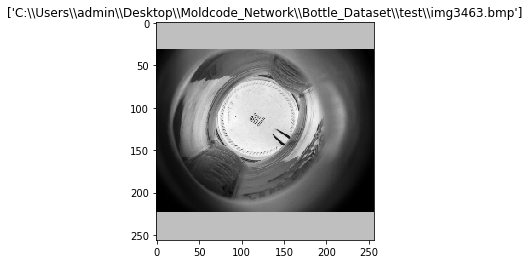

Prediction: 360
Label: 310


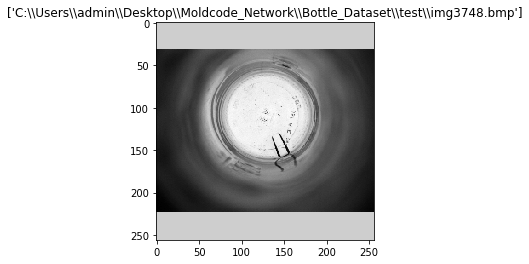

Prediction: 360
Label: 290


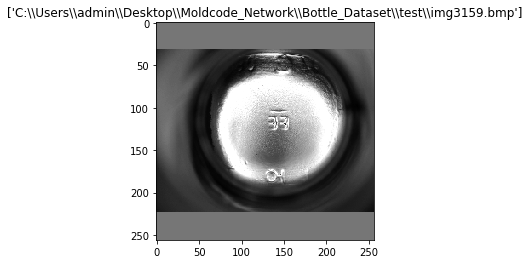

Prediction: 90
Label: 180


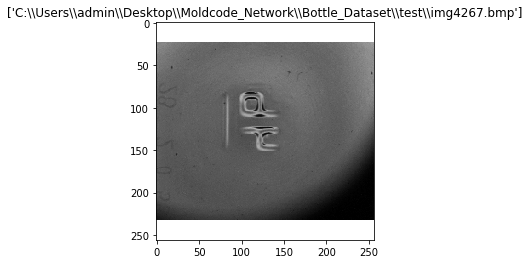

Prediction: 270
Label: 90


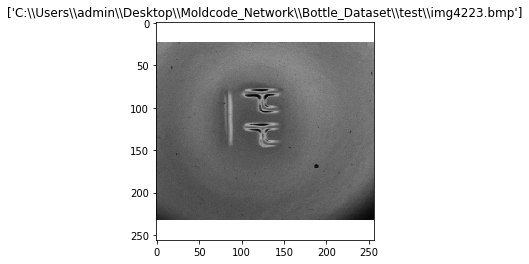

Prediction: 270
Label: 90


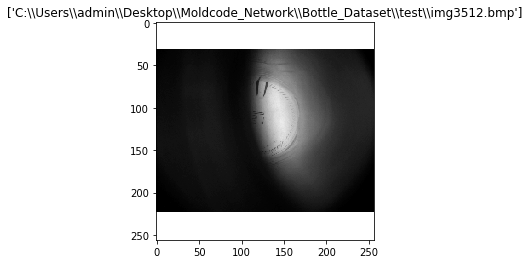

Prediction: 360
Label: 185


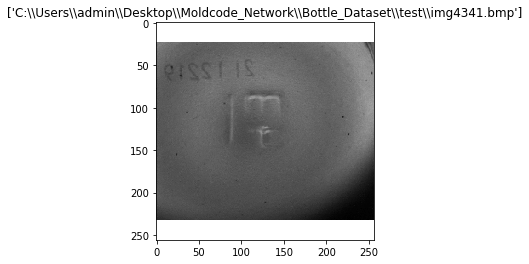

Prediction: 270
Label: 90


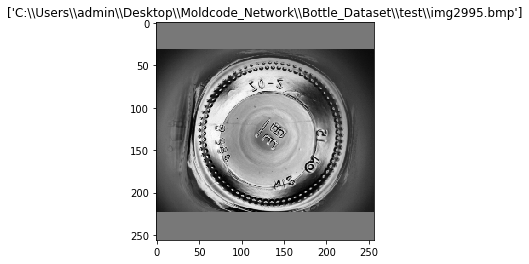

Prediction: 180
Label: 125


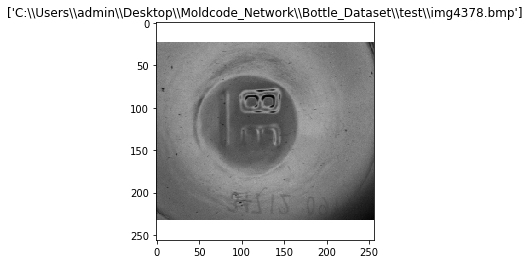

Prediction: 270
Label: 90


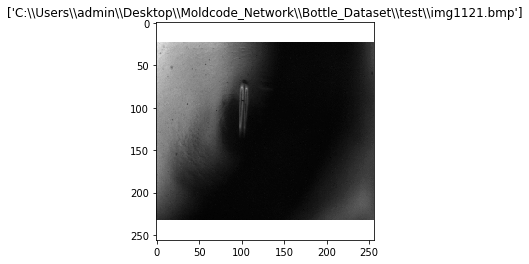

Prediction: 360
Label: 90


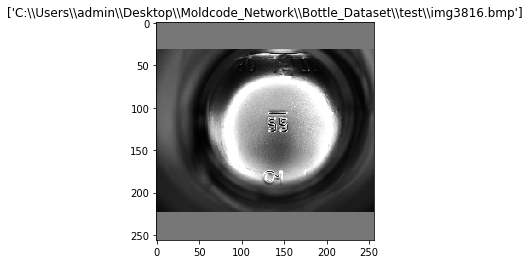

Prediction: 90
Label: 180


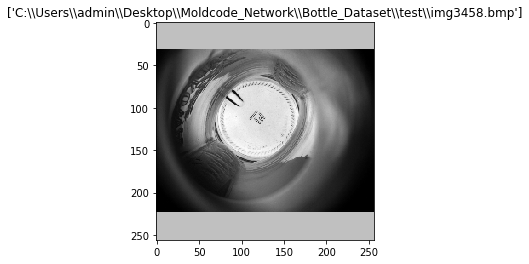

Prediction: 360
Label: 135


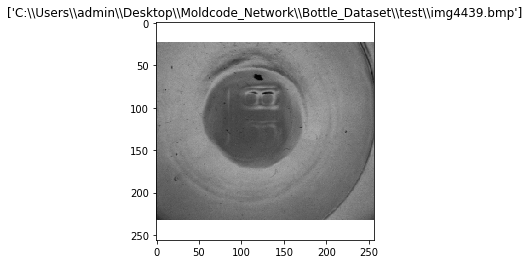

Prediction: 270
Label: 90


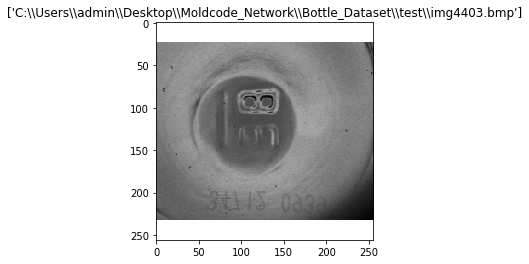

Prediction: 270
Label: 90


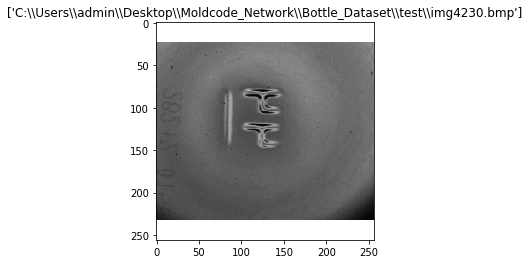

Prediction: 270
Label: 90


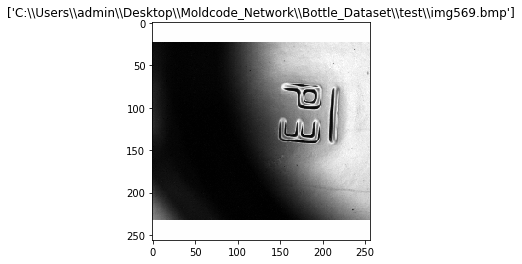

Prediction: 360
Label: 270


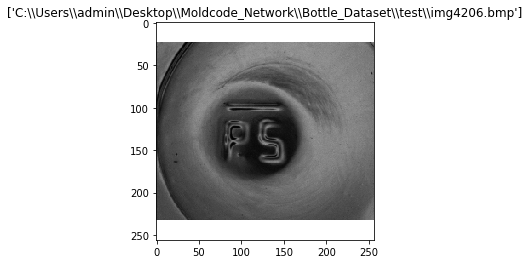

Prediction: 270
Label: 180


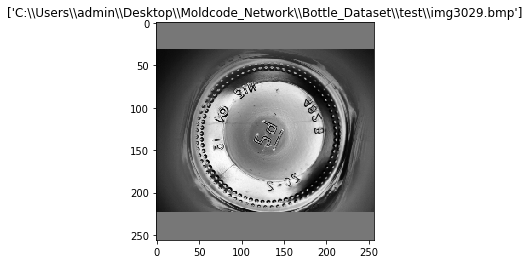

Prediction: 180
Label: 295


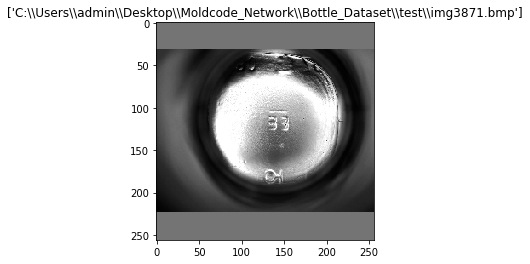

Prediction: 90
Label: 180


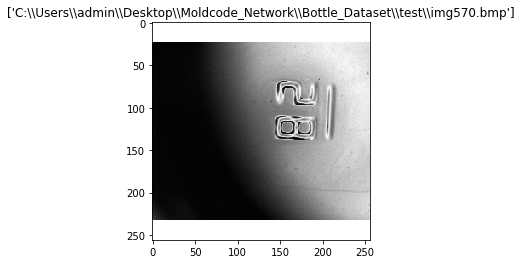

Prediction: 360
Label: 270


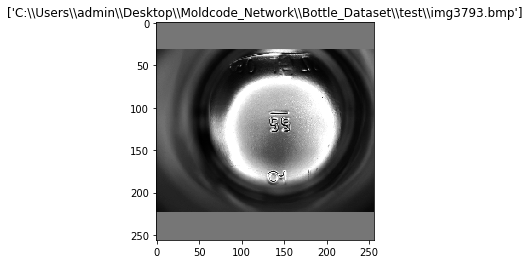

Prediction: 90
Label: 180


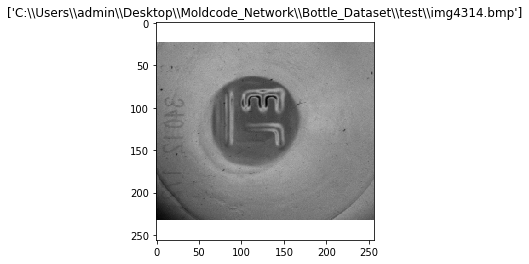

Prediction: 270
Label: 90


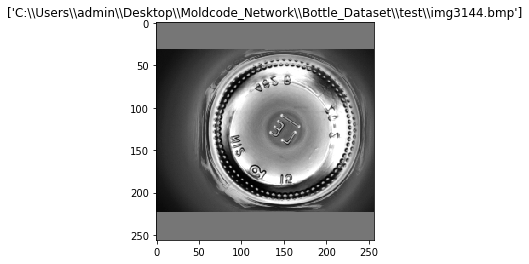

Prediction: 130
Label: 210


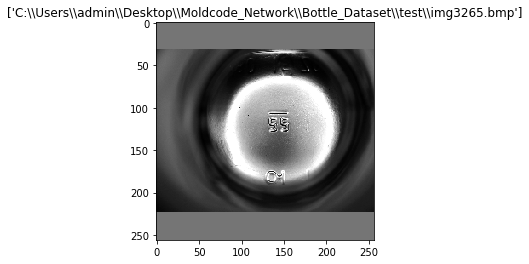

Prediction: 90
Label: 180


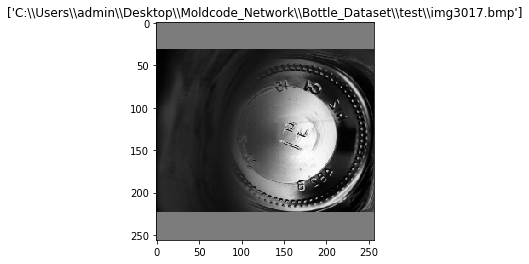

Prediction: 360
Label: 20


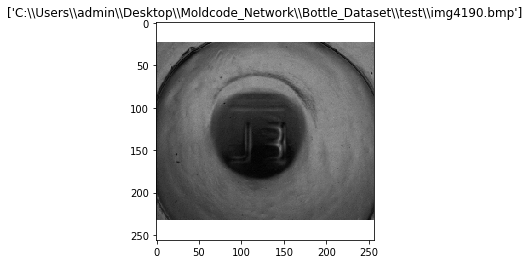

Prediction: 360
Label: 180


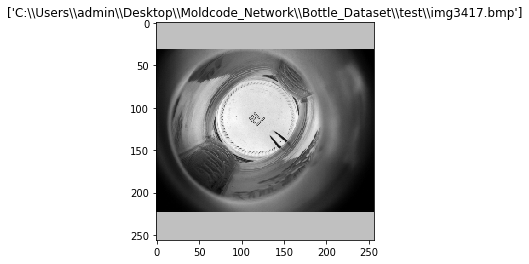

Prediction: 360
Label: 315


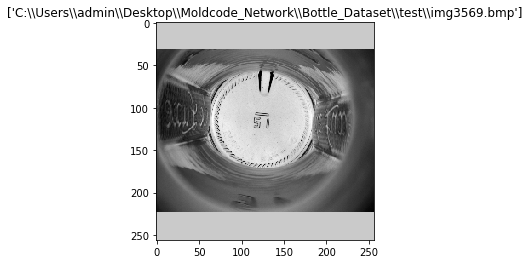

Prediction: 90
Label: 185


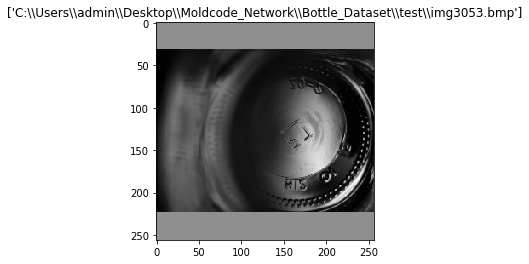

Prediction: 360
Label: 140


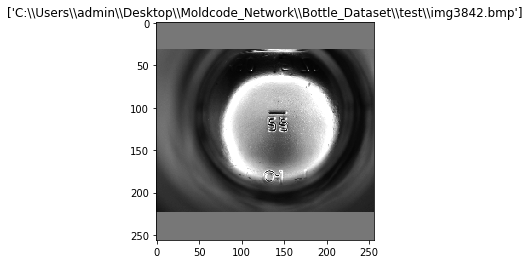

Prediction: 90
Label: 180


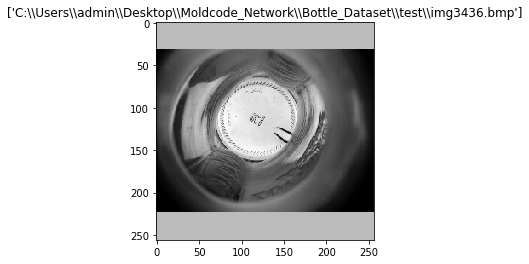

Prediction: 180
Label: 300


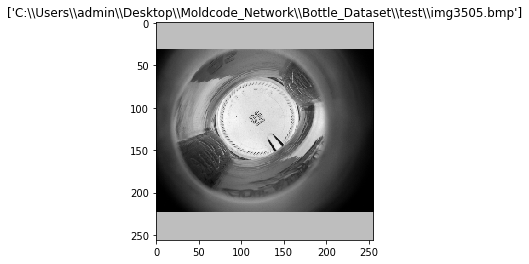

Prediction: 360
Label: 325


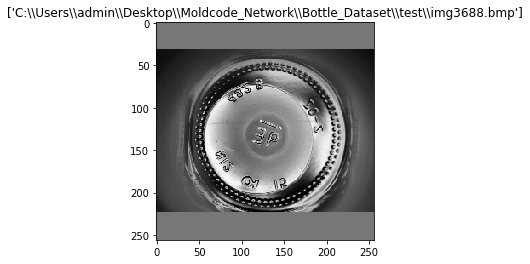

Prediction: 270
Label: 200


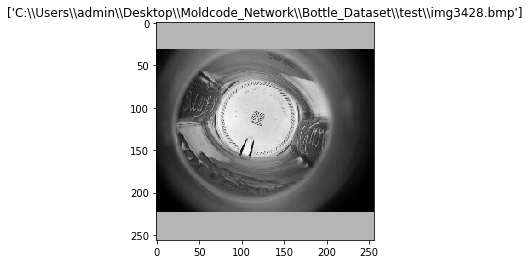

Prediction: 360
Label: 20


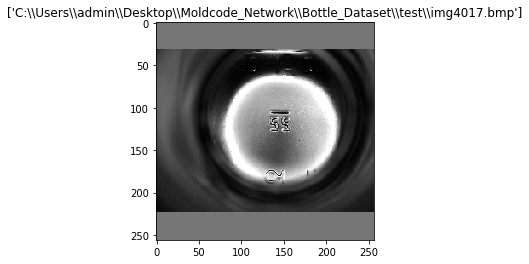

Prediction: 90
Label: 180


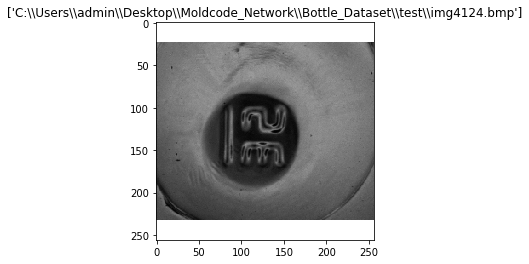

Prediction: 270
Label: 90


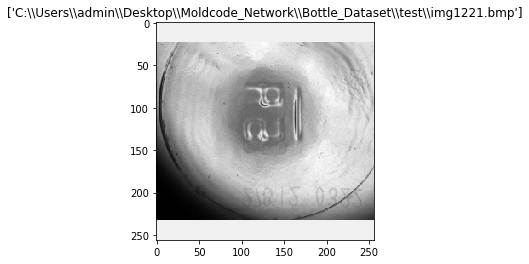

Prediction: 90
Label: 270


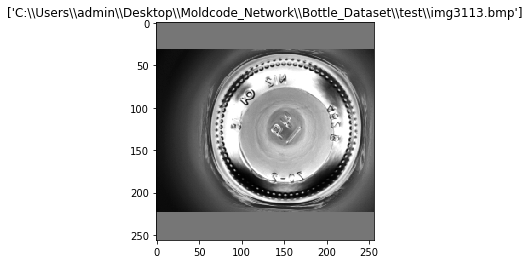

Prediction: 180
Label: 310


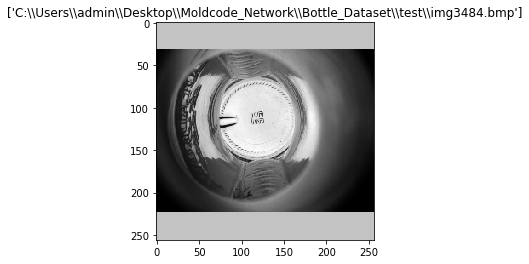

Prediction: 0
Label: 85


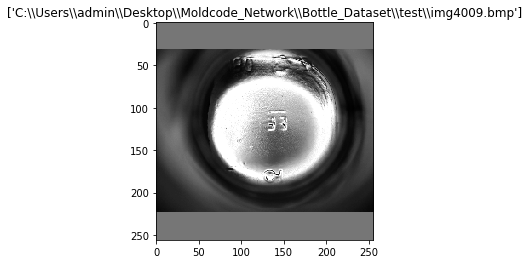

Prediction: 90
Label: 180


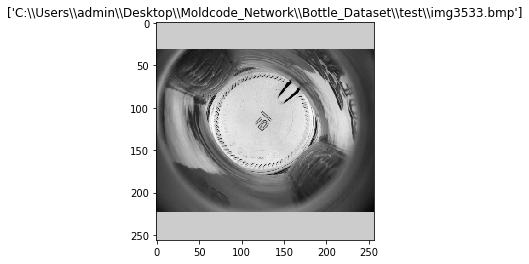

Prediction: 360
Label: 225


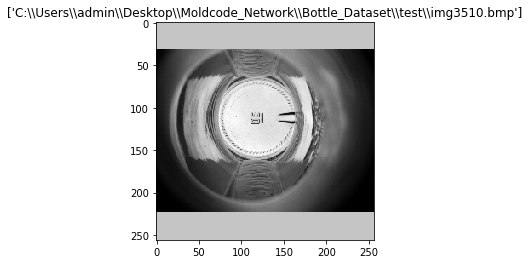

Prediction: 0
Label: 270


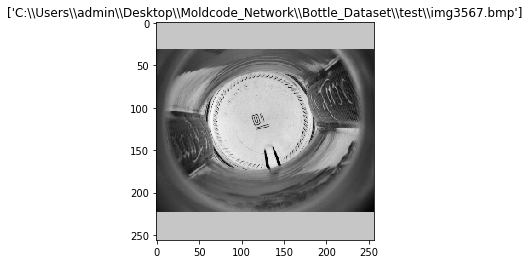

Prediction: 360
Label: 340


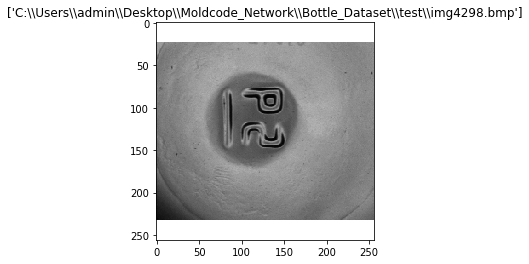

Prediction: 270
Label: 90


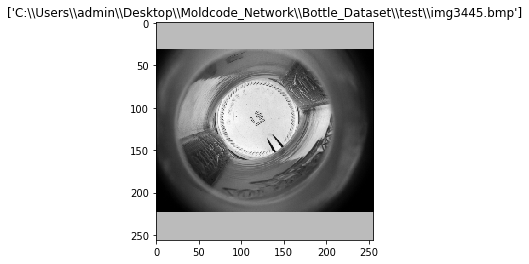

Prediction: 180
Label: 325


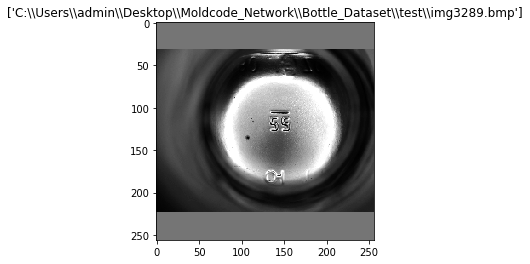

Prediction: 90
Label: 180


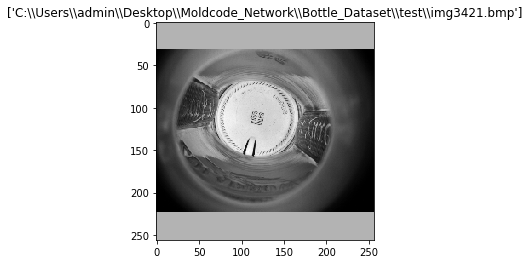

Prediction: 360
Label: 15


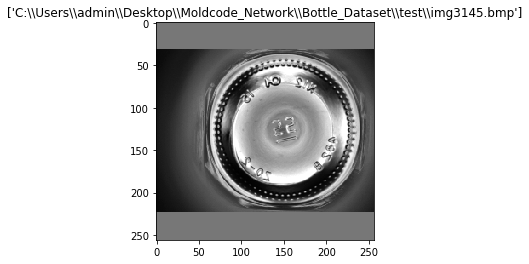

Prediction: 180
Label: 345


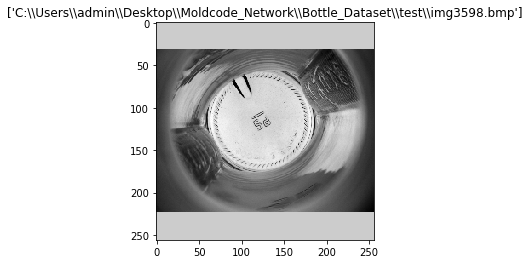

Prediction: 360
Label: 150


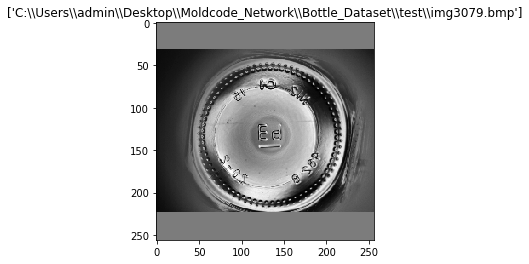

Prediction: 90
Label: 0


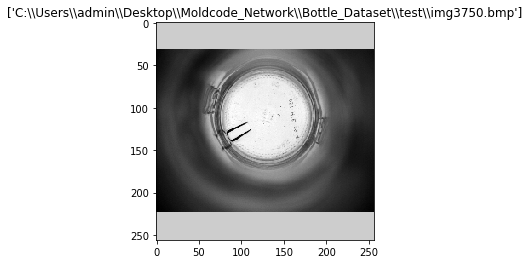

Prediction: 360
Label: 15


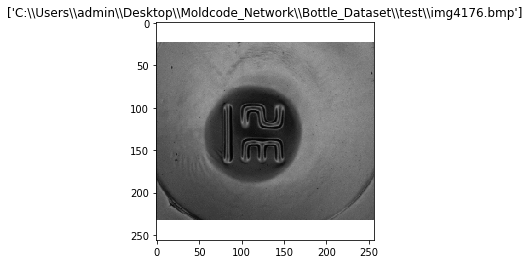

Prediction: 270
Label: 90


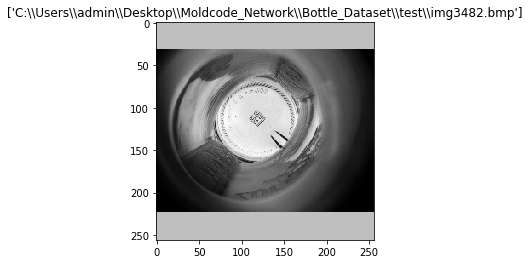

Prediction: 180
Label: 310


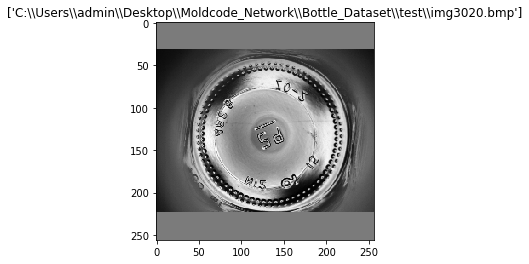

Prediction: 360
Label: 155


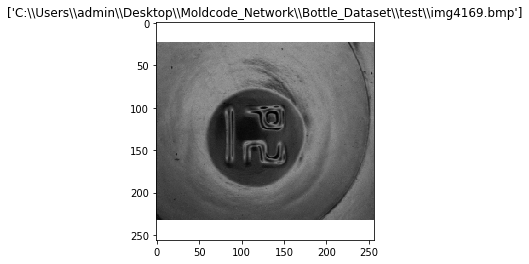

Prediction: 270
Label: 90


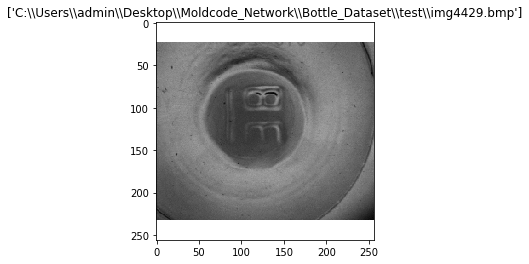

Prediction: 270
Label: 90
Average time per inference: 0.0241
Hard accuracy of predictions on the test images: 86%
Soft accuracy of predictions within 15 degrees of correct label = 0.889


86.70520231213872

In [7]:
rotate_net.test_net(SRot_net, SRot_loader_test, device, show_errors=True)

<hr>
<h2>Teacher Recognition Networks</h2>
<hr>

<h3>Teacher Recognition Network</h3>
<p>For this network I recommend training for 200 epochs. Though some great results came out around 90 I found I was able to squeeze an extra percentage of accuracy around the end of 200 epochs. I believe this is due to the high level of augmentation I've got on the dataset. Depending on your GPU this will take some time. Basically a day. No funny business with the augmentation for this network. Just let it run, this means you can definitely just get your computer to train these networks overnight after mild supervision at the beginning to make sure it's training properly. Not entirely sure why but it tends to start with 0% accuracy after 1 epoch, don't be alarmed by that.<p>

In [3]:
yolo_train.train(
        r'C:\Users\admin\Desktop\Moldcode_Network\YOLO_Files\bottles_yolov3.cfg',
        r'C:\Users\admin\Desktop\Moldcode_Network\YOLO_Files\bottles.data',
        img_size=416,
        resume=False,
        transfer=False,
        epochs=200,
        batch_size=8,
        accumulate=4,
        multi_scale=False,
        notest=False
    )

Using CUDA device0 _CudaDeviceProperties(name='GeForce GTX 1080', total_memory=8192MB)

C:\Users\admin\Desktop\Moldcode_Network\YOLO_Files\bottles_train_recogn.txt


Reading labels: 100%|████████████████████████████████████████████████████████████| 3885/3885 [00:00<00:00, 4765.15it/s]


Model Summary: 222 layers, 6.15716e+07 parameters, 6.15716e+07 gradients

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   0/199      99/485      0.35     0.323      45.7      1.89      48.2        16      49.1
   0/199     298/485     0.348     0.217      15.5       1.8      17.9        16      73.7
               Class    Images   Targets         P         R       mAP        F1


Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:23<00:00,  2.14it/s]


                 all       692  1.36e+03         0         0         0         0
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292         0         0         0         0
                   3       692       224         0         0         0         0
                   4       692       205         0         0         0         0
                   5       692       157         0         0         0         0
                   6       692       137         0         0         0         0
                   7       692       148         0         0         0         0
                   8       692        82         0         0         0         0
                   9       692        93         0         0         0         0

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   1/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:22<00:00,  3.85it/s]


                 all       692  1.36e+03         0         0         0         0
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292         0         0         0         0
                   3       692       224         0         0         0         0
                   4       692       205         0         0         0         0
                   5       692       157         0         0         0         0
                   6       692       137         0         0         0         0
                   7       692       148         0         0         0         0
                   8       692        82         0         0         0         0
                   9       692        93         0         0         0         0

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   2/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:22<00:00,  3.82it/s]


                 all       692  1.36e+03         0         0         0         0
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292         0         0         0         0
                   3       692       224         0         0         0         0
                   4       692       205         0         0         0         0
                   5       692       157         0         0         0         0
                   6       692       137         0         0         0         0
                   7       692       148         0         0         0         0
                   8       692        82         0         0         0         0
                   9       692        93         0         0         0         0

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   3/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:22<00:00,  3.93it/s]


                 all       692  1.36e+03         0         0         0         0
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292         0         0         0         0
                   3       692       224         0         0         0         0
                   4       692       205         0         0         0         0
                   5       692       157         0         0         0         0
                   6       692       137         0         0         0         0
                   7       692       148         0         0         0         0
                   8       692        82         0         0         0         0
                   9       692        93         0         0         0         0

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   4/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:22<00:00,  3.91it/s]


                 all       692  1.36e+03         0         0         0         0
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292         0         0         0         0
                   3       692       224         0         0         0         0
                   4       692       205         0         0         0         0
                   5       692       157         0         0         0         0
                   6       692       137         0         0         0         0
                   7       692       148         0         0         0         0
                   8       692        82         0         0         0         0
                   9       692        93         0         0         0         0

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   5/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:22<00:00,  3.90it/s]


                 all       692  1.36e+03         0         0         0         0
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292         0         0         0         0
                   3       692       224         0         0         0         0
                   4       692       205         0         0         0         0
                   5       692       157         0         0         0         0
                   6       692       137         0         0         0         0
                   7       692       148         0         0         0         0
                   8       692        82         0         0         0         0
                   9       692        93         0         0         0         0

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   6/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:22<00:00,  3.85it/s]


                 all       692  1.36e+03         0         0         0         0
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292         0         0         0         0
                   3       692       224         0         0         0         0
                   4       692       205         0         0         0         0
                   5       692       157         0         0         0         0
                   6       692       137         0         0         0         0
                   7       692       148         0         0         0         0
                   8       692        82         0         0         0         0
                   9       692        93         0         0         0         0

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   7/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:23<00:00,  3.76it/s]


                 all       692  1.36e+03     0.229    0.0117   0.00582    0.0181
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292    0.0563    0.0137  0.000913     0.022
                   3       692       224         0         0         0         0
                   4       692       205         1   0.00488   0.00488   0.00971
                   5       692       157         0         0         0         0
                   6       692       137         0         0         0         0
                   7       692       148     0.236    0.0878    0.0416     0.128
                   8       692        82         0         0         0         0
                   9       692        93         1    0.0108    0.0108    0.0213

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   8/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:22<00:00,  3.79it/s]


                 all       692  1.36e+03     0.265    0.0128   0.00634    0.0237
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292         0         0         0         0
                   3       692       224         1   0.00446   0.00446   0.00889
                   4       692       205       0.2   0.00488  0.000976   0.00952
                   5       692       157     0.308    0.0255   0.00926    0.0471
                   6       692       137         0         0         0         0
                   7       692       148     0.412    0.0473    0.0282    0.0848
                   8       692        82       0.4    0.0244   0.00976     0.046
                   9       692        93     0.333    0.0215    0.0108    0.0404

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   9/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:22<00:00,  3.86it/s]


                 all       692  1.36e+03         0         0         0         0
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292         0         0         0         0
                   3       692       224         0         0         0         0
                   4       692       205         0         0         0         0
                   5       692       157         0         0         0         0
                   6       692       137         0         0         0         0
                   7       692       148         0         0         0         0
                   8       692        82         0         0         0         0
                   9       692        93         0         0         0         0

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  10/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:23<00:00,  3.77it/s]


                 all       692  1.36e+03     0.152    0.0192   0.00851    0.0321
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292    0.0357   0.00342  0.000214   0.00625
                   3       692       224       0.4   0.00893    0.0067    0.0175
                   4       692       205     0.231    0.0146   0.00926    0.0275
                   5       692       157     0.143   0.00637   0.00159    0.0122
                   6       692       137         0         0         0         0
                   7       692       148     0.105    0.0135   0.00142     0.024
                   8       692        82     0.154    0.0488    0.0176    0.0741
                   9       692        93      0.45    0.0968    0.0484     0.159

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  11/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:23<00:00,  3.66it/s]


                 all       692  1.36e+03     0.185    0.0288    0.0145    0.0488
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.164    0.0342   0.00637    0.0567
                   3       692       224     0.286    0.0625     0.026     0.103
                   4       692       205     0.118   0.00976   0.00553     0.018
                   5       692       157      0.24    0.0382    0.0146    0.0659
                   6       692       137    0.0909    0.0073  0.000811    0.0135
                   7       692       148     0.333     0.027    0.0119      0.05
                   8       692        82    0.0169    0.0122  0.000581    0.0142
                   9       692        93       0.6    0.0968    0.0788     0.167

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  12/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:23<00:00,  3.67it/s]


                 all       692  1.36e+03     0.194    0.0618      0.03    0.0822
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.207    0.0205   0.00702    0.0374
                   3       692       224     0.143   0.00893   0.00198    0.0168
                   4       692       205      0.25    0.0195    0.0065    0.0362
                   5       692       157      0.25   0.00637   0.00212    0.0124
                   6       692       137         0         0         0         0
                   7       692       148     0.342    0.0878    0.0309      0.14
                   8       692        82     0.348     0.195     0.115      0.25
                   9       692        93       0.4      0.28     0.137     0.329

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  13/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:26<00:00,  3.33it/s]


                 all       692  1.36e+03     0.307     0.144    0.0754     0.182
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.487     0.134     0.078      0.21
                   3       692       224     0.382     0.129    0.0517     0.193
                   4       692       205     0.341     0.137    0.0681     0.195
                   5       692       157     0.323     0.204     0.112      0.25
                   6       692       137     0.421    0.0584    0.0263     0.103
                   7       692       148     0.382     0.426     0.202     0.403
                   8       692        82     0.414     0.146    0.0882     0.216
                   9       692        93     0.317     0.204     0.129     0.248

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  14/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:24<00:00,  6.67it/s]


                 all       692  1.36e+03     0.278    0.0856    0.0407     0.125
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.404    0.0651    0.0302     0.112
                   3       692       224     0.605     0.116    0.0871     0.195
                   4       692       205     0.432    0.0927    0.0472     0.153
                   5       692       157     0.324    0.0701    0.0272     0.115
                   6       692       137         0         0         0         0
                   7       692       148     0.345     0.203    0.0847     0.255
                   8       692        82     0.325     0.159    0.0625     0.213
                   9       692        93      0.35     0.151    0.0685     0.211

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  15/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:24<00:00,  7.35it/s]


                 all       692  1.36e+03     0.331     0.103    0.0592     0.151
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.411     0.103    0.0691     0.164
                   3       692       224       0.6     0.107    0.0691     0.182
                   4       692       205     0.423     0.107    0.0676     0.171
                   5       692       157      0.56    0.0892    0.0546     0.154
                   6       692       137    0.0909    0.0073  0.000664    0.0135
                   7       692       148     0.457     0.216     0.109     0.294
                   8       692        82      0.25     0.134    0.0589     0.175
                   9       692        93     0.521     0.269     0.163     0.355

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  16/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:26<00:00,  6.86it/s]


                 all       692  1.36e+03     0.351     0.178    0.0995     0.231
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.545      0.25     0.152     0.343
                   3       692       224     0.483     0.188     0.112      0.27
                   4       692       205      0.33      0.18    0.0714     0.233
                   5       692       157     0.367     0.299      0.14      0.33
                   6       692       137     0.176    0.0438   0.00849    0.0702
                   7       692       148     0.472     0.345     0.189     0.398
                   8       692        82     0.535      0.28     0.182     0.368
                   9       692        93       0.6     0.194     0.139     0.293

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  17/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:25<00:00,  6.64it/s]


                 all       692  1.36e+03     0.364     0.141    0.0829     0.197
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.662     0.168     0.134     0.268
                   3       692       224      0.46     0.103    0.0704     0.168
                   4       692       205     0.323     0.156    0.0667     0.211
                   5       692       157     0.607     0.236     0.178     0.339
                   6       692       137     0.333    0.0876    0.0441     0.139
                   7       692       148     0.506     0.277     0.165     0.358
                   8       692        82      0.36      0.11    0.0481     0.168
                   9       692        93     0.391     0.269     0.123     0.318

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  18/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  6.02it/s]


                 all       692  1.36e+03     0.387     0.238     0.144     0.285
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.519     0.277     0.195     0.362
                   3       692       224     0.633     0.223     0.161      0.33
                   4       692       205     0.537     0.283     0.196     0.371
                   5       692       157     0.413     0.318      0.18      0.36
                   6       692       137     0.353    0.0876    0.0319      0.14
                   7       692       148     0.497       0.5      0.28     0.498
                   8       692        82     0.441     0.317     0.177     0.369
                   9       692        93     0.479     0.376     0.223     0.422

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  19/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:26<00:00,  6.13it/s]


                 all       692  1.36e+03     0.448     0.224     0.155     0.293
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.698     0.277     0.235     0.397
                   3       692       224     0.515     0.156     0.089      0.24
                   4       692       205     0.532     0.205     0.143     0.296
                   5       692       157     0.537      0.28     0.227     0.368
                   6       692       137     0.383     0.168    0.0719     0.234
                   7       692       148     0.596     0.378     0.261     0.463
                   8       692        82     0.634     0.317     0.234     0.423
                   9       692        93     0.581     0.462     0.287     0.515

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  20/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:26<00:00,  6.84it/s]


                 all       692  1.36e+03      0.43     0.231     0.154     0.292
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.685     0.298      0.25     0.415
                   3       692       224     0.506     0.201     0.124     0.288
                   4       692       205     0.475     0.234     0.148     0.314
                   5       692       157     0.632     0.274     0.194     0.382
                   6       692       137     0.425     0.124    0.0577     0.192
                   7       692       148     0.478     0.439     0.268     0.458
                   8       692        82     0.512     0.256     0.147     0.341
                   9       692        93     0.584     0.484     0.349     0.529

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  21/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.42it/s]


                 all       692  1.36e+03     0.423     0.284     0.197     0.332
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.529     0.411     0.276     0.462
                   3       692       224     0.492      0.29     0.185     0.365
                   4       692       205      0.49     0.366     0.228     0.419
                   5       692       157     0.537     0.465     0.356     0.498
                   6       692       137     0.462     0.175     0.108     0.254
                   7       692       148     0.527      0.52     0.376     0.524
                   8       692        82     0.613     0.232     0.168     0.336
                   9       692        93     0.583     0.376     0.274     0.458

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  22/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.87it/s]


                 all       692  1.36e+03     0.509      0.29     0.228     0.359
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.756     0.318     0.275     0.448
                   3       692       224       0.6     0.254      0.18     0.357
                   4       692       205      0.55     0.298     0.213     0.386
                   5       692       157     0.592     0.369     0.291     0.455
                   6       692       137     0.613     0.139     0.103     0.226
                   7       692       148     0.711     0.581     0.462     0.639
                   8       692        82     0.582      0.39     0.297     0.467
                   9       692        93     0.689     0.548     0.456     0.611

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  23/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.60it/s]


                 all       692  1.36e+03     0.474     0.316     0.243     0.376
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.537     0.377      0.25     0.443
                   3       692       224     0.478     0.241     0.174      0.32
                   4       692       205     0.522     0.288     0.222     0.371
                   5       692       157     0.678     0.389     0.318     0.494
                   6       692       137     0.521      0.27      0.17     0.356
                   7       692       148     0.684     0.628     0.529     0.655
                   8       692        82     0.615     0.488     0.377     0.544
                   9       692        93     0.703     0.484     0.388     0.573

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  24/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.68it/s]


                 all       692  1.36e+03     0.483     0.315     0.232     0.368
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292     0.685     0.387     0.324     0.495
                   3       692       224     0.643     0.281     0.208     0.391
                   4       692       205     0.636     0.307      0.24     0.414
                   5       692       157      0.59     0.459     0.329     0.516
                   6       692       137     0.636     0.204     0.173     0.309
                   7       692       148     0.531     0.527     0.374     0.529
                   8       692        82     0.586     0.415     0.338     0.486
                   9       692        93      0.52      0.57     0.337     0.544

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  25/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.81it/s]


                 all       692  1.36e+03     0.526     0.338     0.276     0.399
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.722     0.418     0.362     0.529
                   3       692       224     0.653     0.362     0.291     0.466
                   4       692       205     0.736     0.395     0.343     0.514
                   5       692       157     0.552      0.51     0.403      0.53
                   6       692       137     0.788      0.19     0.173     0.306
                   7       692       148     0.696     0.588      0.48     0.637
                   8       692        82     0.532     0.402     0.313     0.458
                   9       692        93     0.578     0.516     0.399     0.545

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  26/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.93it/s]


                 all       692  1.36e+03     0.507     0.324     0.257     0.391
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.763     0.353     0.316     0.482
                   3       692       224     0.741     0.357     0.321     0.482
                   4       692       205     0.565     0.361     0.274      0.44
                   5       692       157     0.664      0.49     0.409     0.564
                   6       692       137     0.451     0.234     0.119     0.308
                   7       692       148     0.694     0.568     0.453     0.625
                   8       692        82     0.579     0.402     0.287     0.475
                   9       692        93     0.611     0.473      0.39     0.533

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  27/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  6.11it/s]


                 all       692  1.36e+03     0.526     0.329     0.253     0.396
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.773     0.397      0.36     0.525
                   3       692       224     0.648     0.254     0.211     0.365
                   4       692       205     0.627     0.312     0.246     0.417
                   5       692       157     0.721     0.478       0.4     0.575
                   6       692       137     0.639     0.285     0.209     0.394
                   7       692       148     0.752     0.615      0.51     0.677
                   8       692        82     0.571      0.39     0.282     0.464
                   9       692        93     0.525     0.559     0.313     0.542

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  28/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.91it/s]


                 all       692  1.36e+03     0.585      0.35     0.293      0.43
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.806     0.469     0.421     0.593
                   3       692       224     0.728     0.335     0.276     0.459
                   4       692       205     0.631       0.4     0.286      0.49
                   5       692       157     0.794     0.318     0.271     0.455
                   6       692       137     0.717     0.277      0.23       0.4
                   7       692       148     0.852     0.662     0.612     0.745
                   8       692        82     0.591     0.476       0.4     0.527
                   9       692        93     0.732     0.559     0.434     0.634

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  29/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.63it/s]


                 all       692  1.36e+03     0.522     0.349     0.281     0.414
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292      0.75     0.483     0.445     0.587
                   3       692       224     0.575     0.308     0.231     0.401
                   4       692       205     0.691     0.371      0.31     0.483
                   5       692       157     0.689     0.465      0.39     0.555
                   6       692       137     0.559     0.277     0.177     0.371
                   7       692       148     0.599     0.574      0.41     0.586
                   8       692        82     0.597     0.451     0.361     0.514
                   9       692        93     0.765     0.559     0.483     0.646

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  30/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.74it/s]


                 all       692  1.36e+03      0.51      0.32     0.262     0.386
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.749     0.459      0.41     0.569
                   3       692       224      0.67     0.281     0.214     0.396
                   4       692       205     0.585     0.385     0.331     0.465
                   5       692       157     0.797     0.401      0.37     0.534
                   6       692       137     0.519     0.204     0.121     0.293
                   7       692       148     0.747       0.5     0.444     0.599
                   8       692        82     0.486     0.439     0.302     0.462
                   9       692        93     0.551     0.527     0.425     0.538

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  31/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.68it/s]


                 all       692  1.36e+03     0.563     0.371     0.315     0.445
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.759     0.486     0.434     0.593
                   3       692       224     0.689     0.415      0.38     0.518
                   4       692       205     0.735      0.42     0.353     0.534
                   5       692       157       0.7      0.49     0.415     0.577
                   6       692       137     0.657     0.321     0.244     0.431
                   7       692       148     0.758     0.655     0.571     0.703
                   8       692        82     0.545     0.366     0.277     0.438
                   9       692        93     0.788     0.559     0.478     0.654

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  32/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  6.10it/s]


                 all       692  1.36e+03     0.533      0.33     0.258       0.4
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.858     0.497     0.466     0.629
                   3       692       224      0.73     0.241     0.203     0.362
                   4       692       205     0.446     0.444      0.22     0.445
                   5       692       157     0.823     0.503     0.468     0.625
                   6       692       137     0.548     0.372     0.244     0.443
                   7       692       148     0.756     0.459     0.386     0.571
                   8       692        82     0.485     0.402      0.27      0.44
                   9       692        93     0.686     0.376     0.323     0.486

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  33/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.29it/s]


                 all       692  1.36e+03     0.598      0.42     0.363     0.486
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292       0.8     0.507     0.457     0.621
                   3       692       224     0.752     0.393     0.361     0.516
                   4       692       205     0.778     0.444     0.414     0.565
                   5       692       157     0.811     0.573     0.533     0.672
                   6       692       137     0.742     0.358     0.302     0.483
                   7       692       148     0.812     0.703     0.601     0.754
                   8       692        82       0.6     0.585     0.457     0.593
                   9       692        93     0.686     0.634       0.5     0.659

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  34/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.92it/s]


                 all       692  1.36e+03     0.622     0.405     0.366     0.488
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.917     0.531     0.518     0.672
                   3       692       224     0.609     0.424     0.347       0.5
                   4       692       205     0.738     0.439     0.389      0.55
                   5       692       157     0.833     0.605     0.588     0.701
                   6       692       137      0.75     0.394     0.343     0.517
                   7       692       148      0.91     0.682     0.675      0.78
                   8       692        82     0.629     0.476      0.36     0.542
                   9       692        93     0.836     0.495     0.442     0.622

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  35/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.63it/s]


                 all       692  1.36e+03     0.595     0.443     0.394     0.506
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.606     0.517     0.442     0.558
                   3       692       224     0.664     0.451     0.407     0.537
                   4       692       205     0.774     0.502     0.453     0.609
                   5       692       157     0.804     0.573     0.564     0.669
                   6       692       137     0.724     0.518     0.415     0.604
                   7       692       148     0.779     0.736      0.63     0.757
                   8       692        82     0.719     0.561     0.477      0.63
                   9       692        93     0.883      0.57     0.554     0.693

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  36/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.60it/s]


                 all       692  1.36e+03     0.568      0.43     0.378      0.48
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.794     0.555     0.533     0.653
                   3       692       224     0.583     0.375     0.299     0.457
                   4       692       205     0.845     0.424     0.403     0.565
                   5       692       157     0.731     0.554     0.503      0.63
                   6       692       137     0.694     0.365     0.319     0.478
                   7       692       148      0.72      0.73     0.604     0.725
                   8       692        82     0.581     0.659     0.562     0.617
                   9       692        93     0.728     0.634     0.555     0.678

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  37/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.65it/s]


                 all       692  1.36e+03     0.651     0.437     0.404     0.517
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.906     0.527     0.518     0.667
                   3       692       224     0.829     0.455     0.405     0.588
                   4       692       205      0.88     0.502     0.478      0.64
                   5       692       157     0.842     0.611     0.567     0.708
                   6       692       137     0.703     0.328     0.281     0.448
                   7       692       148     0.806     0.757     0.717      0.78
                   8       692        82     0.648     0.561     0.461     0.601
                   9       692        93     0.892     0.624     0.608     0.734

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  38/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.56it/s]


                 all       692  1.36e+03     0.634     0.442     0.408     0.519
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.847     0.551     0.539     0.668
                   3       692       224     0.803     0.473     0.445     0.596
                   4       692       205      0.81     0.478     0.447     0.601
                   5       692       157     0.761     0.529     0.509     0.624
                   6       692       137     0.659     0.438     0.325     0.526
                   7       692       148     0.852     0.736     0.685      0.79
                   8       692        82      0.77     0.573     0.537     0.657
                   9       692        93     0.833     0.645     0.592     0.727

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  39/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.51it/s]


                 all       692  1.36e+03     0.627     0.479     0.447     0.541
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.807     0.572      0.55     0.669
                   3       692       224     0.701     0.482     0.411     0.571
                   4       692       205     0.759     0.537      0.49     0.629
                   5       692       157     0.879      0.65     0.629     0.747
                   6       692       137      0.83     0.569     0.556     0.675
                   7       692       148     0.859     0.743     0.716     0.797
                   8       692        82      0.61      0.61     0.504      0.61
                   9       692        93     0.829     0.624     0.611     0.712

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  40/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.76it/s]


                 all       692  1.36e+03     0.646     0.478     0.444     0.545
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.869     0.545     0.524     0.669
                   3       692       224     0.756     0.455     0.425     0.568
                   4       692       205     0.851     0.556     0.539     0.673
                   5       692       157     0.786     0.656     0.593     0.715
                   6       692       137     0.787      0.46     0.396     0.581
                   7       692       148      0.88     0.791     0.774     0.833
                   8       692        82     0.727     0.585     0.533     0.649
                   9       692        93       0.8     0.731     0.653     0.764

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  41/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.39it/s]


                 all       692  1.36e+03     0.624     0.472     0.443     0.534
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.814     0.568     0.542     0.669
                   3       692       224     0.785     0.455     0.432     0.576
                   4       692       205     0.756      0.59     0.553     0.663
                   5       692       157     0.808     0.618     0.589       0.7
                   6       692       137     0.777     0.635     0.606     0.699
                   7       692       148     0.931      0.73     0.712     0.818
                   8       692        82     0.541     0.561     0.479     0.551
                   9       692        93     0.825     0.559     0.522     0.667

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  42/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.39it/s]


                 all       692  1.36e+03     0.646     0.459     0.423      0.53
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.867     0.582      0.56     0.697
                   3       692       224     0.789     0.402     0.372     0.533
                   4       692       205     0.952     0.488     0.478     0.645
                   5       692       157     0.807     0.694     0.656     0.747
                   6       692       137     0.765     0.453     0.402     0.569
                   7       692       148     0.931      0.73     0.711     0.818
                   8       692        82     0.547     0.573      0.45      0.56
                   9       692        93     0.805     0.667     0.601     0.729

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  43/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.52it/s]


                 all       692  1.36e+03     0.639     0.487      0.46      0.55
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.872     0.586     0.572     0.701
                   3       692       224     0.648     0.478     0.449      0.55
                   4       692       205     0.851     0.502     0.489     0.632
                   5       692       157     0.877     0.637     0.627     0.738
                   6       692       137     0.755     0.584     0.529     0.658
                   7       692       148     0.887     0.743     0.708     0.809
                   8       692        82     0.716     0.585     0.555     0.644
                   9       692        93     0.787     0.753     0.668     0.769

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  44/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.30it/s]


                 all       692  1.36e+03     0.672     0.492     0.459      0.56
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.909     0.613     0.605     0.732
                   3       692       224     0.844     0.411     0.396     0.553
                   4       692       205     0.942     0.551     0.539     0.695
                   5       692       157     0.868     0.631     0.608     0.731
                   6       692       137     0.942     0.591     0.576     0.726
                   7       692       148     0.882     0.757     0.722     0.815
                   8       692        82     0.611     0.671     0.583      0.64
                   9       692        93     0.722     0.699     0.564      0.71

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  45/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.46it/s]


                 all       692  1.36e+03     0.699     0.493     0.467     0.573
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.936     0.548     0.538     0.691
                   3       692       224     0.857     0.455     0.438     0.595
                   4       692       205      0.92      0.62     0.609     0.741
                   5       692       157     0.938     0.675     0.668     0.785
                   6       692       137     0.887     0.518     0.481     0.654
                   7       692       148     0.839     0.777     0.708     0.807
                   8       692        82     0.841     0.646     0.611     0.731
                   9       692        93     0.771     0.688     0.621     0.727

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  46/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.42it/s]


                 all       692  1.36e+03     0.666     0.496     0.453     0.563
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.905      0.62     0.609     0.736
                   3       692       224     0.792     0.424     0.395     0.552
                   4       692       205     0.919     0.556     0.538     0.693
                   5       692       157     0.891     0.675      0.66     0.768
                   6       692       137     0.835     0.701     0.646     0.762
                   7       692       148     0.957     0.743     0.736     0.837
                   8       692        82     0.574     0.659     0.455     0.614
                   9       692        93     0.783     0.581     0.494     0.667

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  47/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.50it/s]


                 all       692  1.36e+03     0.676     0.525      0.49     0.588
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.914     0.582     0.574     0.711
                   3       692       224     0.856     0.478     0.454     0.613
                   4       692       205     0.881     0.722     0.684     0.794
                   5       692       157     0.873     0.701     0.679     0.777
                   6       692       137     0.821     0.672     0.631     0.739
                   7       692       148     0.829     0.723     0.638     0.773
                   8       692        82      0.72     0.659     0.572     0.688
                   9       692        93     0.868      0.71     0.663     0.781

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  48/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.55it/s]


                 all       692  1.36e+03     0.691     0.543      0.52     0.605
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.884     0.603     0.595     0.717
                   3       692       224     0.824     0.562     0.536     0.668
                   4       692       205     0.942     0.639     0.629     0.762
                   5       692       157       0.9     0.688     0.668      0.78
                   6       692       137     0.942     0.708     0.705     0.808
                   7       692       148     0.892     0.838     0.795     0.864
                   8       692        82     0.682     0.707     0.629     0.695
                   9       692        93     0.842     0.688     0.639     0.757

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  49/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.78it/s]


                 all       692  1.36e+03     0.657     0.481     0.451     0.552
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.879      0.62     0.603     0.727
                   3       692       224      0.77     0.509     0.478     0.613
                   4       692       205     0.936     0.498     0.485      0.65
                   5       692       157      0.82     0.694     0.672     0.752
                   6       692       137     0.885      0.62     0.606      0.73
                   7       692       148      0.92     0.696     0.678     0.792
                   8       692        82     0.633      0.61     0.535     0.621
                   9       692        93     0.732     0.559     0.452     0.634

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  50/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.64it/s]


                 all       692  1.36e+03     0.678     0.482     0.457     0.563
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.853     0.654      0.64      0.74
                   3       692       224     0.775     0.478     0.421     0.591
                   4       692       205     0.784     0.566     0.514     0.657
                   5       692       157     0.929     0.662     0.654     0.773
                   6       692       137     0.907     0.642     0.629     0.752
                   7       692       148     0.948     0.622     0.618     0.751
                   8       692        82     0.708     0.561     0.477     0.626
                   9       692        93     0.881     0.634      0.62     0.738

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  51/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.52it/s]


                 all       692  1.36e+03     0.688     0.534     0.517       0.6
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.863     0.623     0.611     0.724
                   3       692       224     0.823     0.518     0.499     0.636
                   4       692       205     0.856     0.639     0.628     0.732
                   5       692       157     0.905     0.726     0.711     0.806
                   6       692       137     0.857     0.701     0.672     0.771
                   7       692       148     0.936     0.791     0.764     0.857
                   8       692        82     0.797     0.622     0.596     0.699
                   9       692        93     0.848      0.72     0.691     0.779

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  52/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.48it/s]


                 all       692  1.36e+03     0.665     0.527     0.498     0.585
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.861     0.637     0.623     0.732
                   3       692       224     0.805     0.571     0.538     0.668
                   4       692       205     0.924     0.595     0.584     0.724
                   5       692       157     0.791     0.745      0.72     0.767
                   6       692       137     0.887     0.628     0.617     0.735
                   7       692       148     0.893     0.736     0.721     0.807
                   8       692        82     0.675     0.659     0.554     0.667
                   9       692        93     0.812     0.699     0.624     0.751

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  53/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.49it/s]


                 all       692  1.36e+03     0.709     0.544     0.527     0.614
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.939     0.682     0.678      0.79
                   3       692       224     0.795     0.518     0.496     0.627
                   4       692       205     0.907     0.668     0.639      0.77
                   5       692       157     0.904      0.72     0.714     0.801
                   6       692       137     0.913     0.693     0.682     0.788
                   7       692       148     0.952     0.797     0.777     0.868
                   8       692        82     0.727     0.683      0.61     0.704
                   9       692        93     0.955     0.677     0.667     0.792

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  54/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.38it/s]


                 all       692  1.36e+03     0.688     0.533     0.517     0.599
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.879     0.647     0.643     0.746
                   3       692       224     0.779     0.518     0.484     0.622
                   4       692       205      0.83      0.62     0.591     0.709
                   5       692       157     0.893     0.745     0.737     0.812
                   6       692       137     0.881      0.65     0.641     0.748
                   7       692       148     0.962     0.851     0.835     0.903
                   8       692        82     0.737     0.683     0.634     0.709
                   9       692        93     0.919     0.613     0.609     0.735

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  55/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.34it/s]


                 all       692  1.36e+03       0.7     0.556     0.542     0.618
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.902     0.664     0.654     0.765
                   3       692       224     0.797     0.545     0.529     0.647
                   4       692       205     0.907     0.712     0.702     0.798
                   5       692       157     0.933     0.803     0.799     0.863
                   6       692       137      0.93     0.679     0.666     0.785
                   7       692       148     0.959     0.784      0.77     0.862
                   8       692        82     0.714     0.671      0.64     0.692
                   9       692        93     0.855     0.699     0.655     0.769

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  56/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.50it/s]


                 all       692  1.36e+03     0.712     0.543     0.523     0.615
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.879     0.623     0.615     0.729
                   3       692       224     0.854     0.576     0.536     0.688
                   4       692       205     0.918     0.707     0.698     0.799
                   5       692       157     0.894     0.752     0.737     0.817
                   6       692       137     0.926      0.73     0.718     0.816
                   7       692       148     0.973      0.73     0.729     0.834
                   8       692        82     0.746      0.61     0.509     0.671
                   9       692        93     0.929     0.699     0.684     0.798

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  57/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.48it/s]


                 all       692  1.36e+03     0.698     0.502     0.471     0.582
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292      0.92     0.589     0.582     0.718
                   3       692       224     0.658     0.473     0.359     0.551
                   4       692       205     0.944      0.58     0.574     0.719
                   5       692       157     0.924     0.701     0.683     0.797
                   6       692       137     0.935     0.635     0.623     0.757
                   7       692       148     0.961     0.662     0.662     0.784
                   8       692        82      0.76     0.695     0.597     0.726
                   9       692        93     0.877     0.688     0.626     0.771

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  58/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.50it/s]


                 all       692  1.36e+03     0.688     0.536      0.52       0.6
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.896     0.651     0.646     0.754
                   3       692       224     0.879     0.585     0.561     0.702
                   4       692       205     0.818     0.634     0.626     0.714
                   5       692       157     0.783     0.803     0.793     0.792
                   6       692       137     0.897     0.635     0.625     0.744
                   7       692       148     0.972     0.696     0.684     0.811
                   8       692        82      0.77     0.695      0.66     0.731
                   9       692        93     0.861     0.667      0.61     0.752

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  59/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.18it/s]


                 all       692  1.36e+03     0.724     0.541     0.527     0.618
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.917     0.644     0.639     0.757
                   3       692       224     0.847     0.545     0.528     0.663
                   4       692       205     0.952     0.683     0.673     0.795
                   5       692       157     0.968     0.764     0.763     0.854
                   6       692       137     0.949     0.686     0.671     0.797
                   7       692       148     0.944     0.791     0.768      0.86
                   8       692        82     0.758      0.61     0.578     0.676
                   9       692        93     0.901     0.688     0.654      0.78

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  60/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:27<00:00,  5.41it/s]


                 all       692  1.36e+03      0.71      0.53     0.515     0.606
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.905     0.651     0.641     0.757
                   3       692       224     0.818      0.54     0.499     0.651
                   4       692       205     0.931     0.654     0.643     0.768
                   5       692       157      0.91     0.777     0.766     0.838
                   6       692       137     0.904      0.62     0.614     0.736
                   7       692       148     0.983     0.791      0.79     0.876
                   8       692        82     0.735      0.61     0.563     0.667
                   9       692        93      0.91     0.656     0.638     0.762

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  61/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.37it/s]


                 all       692  1.36e+03     0.716     0.563     0.552     0.629
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.926      0.64     0.635     0.757
                   3       692       224     0.831     0.571     0.531     0.677
                   4       692       205     0.887     0.727     0.703     0.799
                   5       692       157     0.915     0.752     0.737     0.825
                   6       692       137     0.898     0.774     0.764     0.831
                   7       692       148     0.991     0.757     0.756     0.858
                   8       692        82     0.764     0.671     0.655     0.714
                   9       692        93     0.945     0.742     0.739     0.831

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  62/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.20it/s]


                 all       692  1.36e+03     0.715     0.552     0.541     0.622
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.878     0.616     0.605     0.724
                   3       692       224     0.869     0.621     0.601     0.724
                   4       692       205     0.873     0.707     0.681     0.782
                   5       692       157     0.845     0.796     0.779      0.82
                   6       692       137     0.948     0.664     0.661     0.781
                   7       692       148     0.968     0.824     0.811     0.891
                   8       692        82     0.787     0.585      0.57     0.671
                   9       692        93     0.985      0.71     0.707     0.825

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  63/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.49it/s]


                 all       692  1.36e+03     0.698     0.567     0.553     0.624
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.885     0.661     0.657     0.757
                   3       692       224     0.844      0.58     0.553     0.688
                   4       692       205     0.837     0.702     0.666     0.764
                   5       692       157     0.901     0.815      0.81     0.856
                   6       692       137     0.914     0.774     0.766     0.838
                   7       692       148     0.972     0.709     0.702      0.82
                   8       692        82     0.725     0.707     0.673     0.716
                   9       692        93     0.905      0.72     0.707     0.802

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  64/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.48it/s]


                 all       692  1.36e+03     0.688     0.585     0.567     0.629
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.899     0.637      0.63     0.745
                   3       692       224     0.855      0.71     0.675     0.776
                   4       692       205     0.917     0.644     0.628     0.756
                   5       692       157     0.881     0.752     0.745     0.811
                   6       692       137     0.882     0.766     0.747      0.82
                   7       692       148     0.992     0.811      0.81     0.892
                   8       692        82     0.674     0.732     0.694     0.702
                   9       692        93     0.779     0.796     0.736     0.787

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  65/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.36it/s]


                 all       692  1.36e+03     0.801     0.586     0.573     0.654
                   0       692         7         1     0.143     0.143      0.25
                   1       692        13         0         0         0         0
                   2       692       292     0.853     0.658     0.649     0.743
                   3       692       224     0.826     0.679     0.658     0.745
                   4       692       205      0.86     0.688     0.672     0.764
                   5       692       157     0.869     0.803     0.792     0.834
                   6       692       137     0.932     0.701     0.695       0.8
                   7       692       148     0.983     0.804       0.8     0.885
                   8       692        82      0.77     0.695      0.65     0.731
                   9       692        93     0.914     0.688     0.669     0.785

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  66/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.36it/s]


                 all       692  1.36e+03      0.69     0.587     0.573     0.633
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.814     0.658     0.646     0.727
                   3       692       224     0.763     0.705     0.674     0.733
                   4       692       205     0.906     0.707     0.687     0.795
                   5       692       157     0.862     0.796     0.789     0.828
                   6       692       137     0.951     0.708       0.7     0.812
                   7       692       148      0.96     0.818     0.807     0.883
                   8       692        82     0.723     0.732     0.688     0.727
                   9       692        93      0.92     0.742     0.736     0.821

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  67/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.34it/s]


                 all       692  1.36e+03     0.748     0.575     0.562     0.648
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.946     0.658     0.652     0.776
                   3       692       224     0.895     0.571     0.558     0.698
                   4       692       205      0.96     0.702     0.693     0.811
                   5       692       157     0.929     0.752     0.743     0.831
                   6       692       137     0.961     0.715     0.712      0.82
                   7       692       148     0.963     0.878     0.864     0.919
                   8       692        82     0.921     0.707     0.699       0.8
                   9       692        93      0.91     0.763     0.698      0.83

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  68/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.44it/s]


                 all       692  1.36e+03     0.716     0.566     0.552      0.63
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292     0.874     0.668     0.658     0.757
                   3       692       224     0.917     0.545     0.526     0.683
                   4       692       205     0.898     0.727       0.7     0.803
                   5       692       157     0.947     0.796     0.795     0.865
                   6       692       137      0.92     0.759     0.743     0.832
                   7       692       148     0.975     0.784     0.775     0.869
                   8       692        82      0.72     0.659     0.614     0.688
                   9       692        93     0.905      0.72     0.705     0.802

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  69/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.56it/s]


                 all       692  1.36e+03     0.703     0.593     0.572     0.642
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.828      0.74     0.724     0.781
                   3       692       224     0.802      0.58     0.566     0.674
                   4       692       205     0.935     0.698      0.69     0.799
                   5       692       157     0.872     0.822     0.803     0.846
                   6       692       137     0.964     0.774     0.773     0.858
                   7       692       148     0.974      0.77     0.764      0.86
                   8       692        82     0.756      0.72     0.655     0.738
                   9       692        93     0.895     0.828     0.747      0.86

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  70/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.45it/s]


                 all       692  1.36e+03     0.703     0.602     0.587     0.647
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.843     0.699     0.685     0.764
                   3       692       224     0.899     0.719     0.709     0.799
                   4       692       205     0.891     0.717     0.698     0.795
                   5       692       157     0.928     0.822     0.819     0.872
                   6       692       137     0.963     0.766     0.759     0.854
                   7       692       148     0.975     0.791     0.789     0.873
                   8       692        82     0.652     0.732     0.655      0.69
                   9       692        93     0.878     0.774     0.752     0.823

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  71/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.37it/s]


                 all       692  1.36e+03     0.686     0.599     0.582     0.638
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292      0.81     0.688     0.656     0.744
                   3       692       224     0.848     0.674     0.649     0.751
                   4       692       205     0.857      0.79     0.762     0.822
                   5       692       157      0.86     0.822      0.81      0.84
                   6       692       137     0.937     0.759     0.757     0.839
                   7       692       148     0.983      0.77      0.77     0.864
                   8       692        82     0.706     0.732     0.674     0.719
                   9       692        93     0.854     0.753     0.743       0.8

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  72/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.43it/s]


                 all       692  1.36e+03     0.731     0.595     0.572     0.643
                   0       692         7         0         0         0         0
                   1       692        13       0.5    0.0769    0.0769     0.133
                   2       692       292     0.847     0.719     0.705     0.778
                   3       692       224     0.839     0.652     0.625     0.734
                   4       692       205     0.828     0.727     0.691     0.774
                   5       692       157     0.873      0.79     0.784     0.829
                   6       692       137     0.897     0.701      0.69     0.787
                   7       692       148      0.94     0.851     0.822     0.894
                   8       692        82     0.783     0.659     0.586     0.715
                   9       692        93       0.8     0.774     0.739     0.787

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  73/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.39it/s]


                 all       692  1.36e+03     0.694     0.585     0.568     0.634
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.828     0.661     0.648     0.735
                   3       692       224     0.871     0.634     0.598     0.734
                   4       692       205     0.907     0.761     0.736     0.828
                   5       692       157     0.873      0.79     0.778     0.829
                   6       692       137     0.872     0.693     0.681     0.772
                   7       692       148     0.967     0.791     0.778      0.87
                   8       692        82     0.744     0.707     0.671     0.725
                   9       692        93     0.874     0.817     0.788     0.844

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  74/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.34it/s]


                 all       692  1.36e+03     0.705     0.608     0.595     0.652
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.808     0.719     0.697     0.761
                   3       692       224     0.791     0.746     0.704     0.768
                   4       692       205     0.902     0.766     0.748     0.828
                   5       692       157     0.934     0.809     0.804     0.867
                   6       692       137     0.932     0.701     0.697       0.8
                   7       692       148     0.945     0.811     0.799     0.873
                   8       692        82     0.787      0.72     0.704     0.752
                   9       692        93     0.949     0.806     0.793     0.872

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  75/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.36it/s]


                 all       692  1.36e+03     0.731     0.593     0.583     0.655
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.915     0.702     0.697     0.795
                   3       692       224     0.804     0.696     0.651     0.746
                   4       692       205     0.898     0.732      0.71     0.806
                   5       692       157     0.969     0.809     0.807     0.882
                   6       692       137     0.924     0.796     0.791     0.855
                   7       692       148     0.983     0.764     0.762     0.859
                   8       692        82     0.885     0.659     0.641     0.755
                   9       692        93     0.935     0.774     0.767     0.847

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  76/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.37it/s]


                 all       692  1.36e+03     0.832     0.624     0.614     0.684
                   0       692         7         0         0         0         0
                   1       692        12         1    0.0833    0.0833     0.154
                   2       692       292     0.948     0.747     0.739     0.835
                   3       692       224     0.915     0.719     0.708     0.805
                   4       692       205     0.915      0.79     0.774     0.848
                   5       692       157     0.914     0.809     0.802     0.858
                   6       692       137     0.938     0.766     0.762     0.843
                   7       692       148     0.946     0.824     0.795     0.881
                   8       692        82     0.841     0.707       0.7     0.768
                   9       692        93     0.902     0.796     0.777     0.846

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  77/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.42it/s]


                 all       692  1.36e+03      0.75     0.609     0.603     0.672
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.938     0.723      0.72     0.816
                   3       692       224     0.908     0.705     0.688     0.794
                   4       692       205     0.963     0.756     0.754     0.847
                   5       692       157     0.976     0.777     0.777     0.865
                   6       692       137     0.955     0.781      0.78     0.859
                   7       692       148     0.961     0.838     0.823     0.895
                   8       692        82     0.892     0.707     0.693     0.789
                   9       692        93     0.904     0.806     0.797     0.852

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  78/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.34it/s]


                 all       692  1.36e+03     0.722     0.606     0.595     0.659
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292      0.92     0.709     0.701     0.801
                   3       692       224     0.857     0.723     0.708     0.785
                   4       692       205     0.902     0.761     0.749     0.825
                   5       692       157     0.932      0.79     0.786     0.855
                   6       692       137     0.932     0.803     0.794     0.863
                   7       692       148     0.953     0.824     0.807     0.884
                   8       692        82     0.851     0.695     0.688     0.765
                   9       692        93     0.875     0.753      0.72     0.809

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  79/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.33it/s]


                 all       692  1.36e+03     0.779     0.649     0.633     0.701
                   0       692         7     0.667     0.286     0.286       0.4
                   1       692        13         0         0         0         0
                   2       692       292     0.834      0.74     0.725     0.784
                   3       692       224     0.893     0.674     0.657     0.768
                   4       692       205      0.87     0.815     0.789     0.841
                   5       692       157     0.942     0.822     0.807     0.878
                   6       692       137     0.953     0.745     0.741     0.836
                   7       692       148      0.96     0.804     0.789     0.875
                   8       692        82     0.782     0.829     0.769     0.805
                   9       692        93     0.889     0.774      0.77     0.828

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  80/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.42it/s]


                 all       692  1.36e+03     0.811     0.622     0.608     0.677
                   0       692         7         1     0.143     0.143      0.25
                   1       692        13         0         0         0         0
                   2       692       292     0.857     0.719     0.704     0.782
                   3       692       224     0.974      0.67     0.666     0.794
                   4       692       205     0.824     0.776     0.714     0.799
                   5       692       157     0.823      0.86     0.848     0.841
                   6       692       137     0.961     0.723     0.722     0.825
                   7       692       148     0.984     0.845     0.844     0.909
                   8       692        82     0.729     0.756     0.722     0.743
                   9       692        93     0.958     0.731     0.719     0.829

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  81/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.21it/s]


                 all       692  1.36e+03     0.707     0.637     0.622     0.669
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.828      0.74      0.72     0.781
                   3       692       224     0.806     0.777     0.728     0.791
                   4       692       205      0.93      0.78      0.77     0.849
                   5       692       157     0.912      0.86     0.852     0.885
                   6       692       137     0.939     0.788     0.785     0.857
                   7       692       148         1     0.865     0.865     0.928
                   8       692        82      0.69     0.732     0.679      0.71
                   9       692        93     0.963     0.828     0.822      0.89

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  82/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.50it/s]


                 all       692  1.36e+03     0.695     0.595     0.581      0.64
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.872     0.723      0.71      0.79
                   3       692       224     0.824     0.692     0.651     0.752
                   4       692       205     0.879     0.746     0.727     0.807
                   5       692       157     0.881     0.758     0.756     0.815
                   6       692       137     0.962      0.73     0.713      0.83
                   7       692       148     0.951     0.791     0.786     0.863
                   8       692        82      0.69     0.707     0.674     0.699
                   9       692        93     0.893     0.806     0.793     0.847

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  83/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.12it/s]


                 all       692  1.36e+03     0.719     0.607     0.598     0.658
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292      0.89     0.719     0.715     0.795
                   3       692       224      0.84     0.679     0.648     0.751
                   4       692       205     0.935     0.766     0.759     0.842
                   5       692       157     0.942     0.834     0.831     0.885
                   6       692       137     0.945     0.759     0.748     0.842
                   7       692       148     0.976     0.831     0.829     0.898
                   8       692        82      0.77     0.695     0.672     0.731
                   9       692        93      0.89     0.785     0.775     0.834

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  84/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.44it/s]


                 all       692  1.36e+03     0.741     0.617     0.605      0.67
                   0       692         7     0.333     0.143     0.143       0.2
                   1       692        12         0         0         0         0
                   2       692       292     0.818     0.692     0.676      0.75
                   3       692       224     0.868     0.705     0.691     0.778
                   4       692       205     0.906     0.707     0.698     0.795
                   5       692       157     0.922     0.828     0.828     0.872
                   6       692       137     0.904     0.759     0.755     0.825
                   7       692       148     0.992     0.804     0.804     0.888
                   8       692        82     0.762     0.744     0.709     0.753
                   9       692        93     0.901     0.785     0.749     0.839

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  85/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.43it/s]


                 all       692  1.36e+03     0.736     0.637     0.626     0.682
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292      0.93     0.771     0.769     0.843
                   3       692       224      0.88      0.75     0.729      0.81
                   4       692       205     0.941     0.776     0.766      0.85
                   5       692       157     0.951      0.86     0.857     0.903
                   6       692       137     0.954     0.759     0.751     0.846
                   7       692       148     0.967     0.804     0.802     0.878
                   8       692        82     0.821     0.841      0.81     0.831
                   9       692        93     0.915     0.806     0.772     0.857

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  86/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.42it/s]


                 all       692  1.36e+03     0.763     0.668     0.647      0.71
                   0       692         7       0.5     0.286     0.214     0.364
                   1       692        13         0         0         0         0
                   2       692       292     0.887     0.781     0.773     0.831
                   3       692       224     0.819     0.728     0.701     0.771
                   4       692       205      0.91      0.79     0.785     0.846
                   5       692       157     0.958     0.866     0.864      0.91
                   6       692       137     0.957      0.81     0.809     0.877
                   7       692       148     0.941     0.865     0.839     0.901
                   8       692        82      0.76     0.695     0.677     0.726
                   9       692        93     0.899      0.86     0.807     0.879

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  87/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.51it/s]


                 all       692  1.36e+03     0.705       0.6     0.581     0.647
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292      0.91     0.726     0.719     0.808
                   3       692       224     0.907     0.696     0.679     0.788
                   4       692       205     0.901     0.756     0.732     0.822
                   5       692       157     0.808     0.803     0.795     0.805
                   6       692       137     0.952     0.723     0.721     0.822
                   7       692       148     0.959     0.791     0.783     0.867
                   8       692        82     0.756     0.756     0.703     0.756
                   9       692        93     0.854     0.753     0.676       0.8

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  88/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.42it/s]


                 all       692  1.36e+03     0.827      0.64     0.627     0.697
                   0       692         7         1     0.143     0.143      0.25
                   1       692        13         0         0         0         0
                   2       692       292     0.851     0.723     0.704     0.781
                   3       692       224     0.863     0.732     0.708     0.792
                   4       692       205      0.88     0.785     0.769      0.83
                   5       692       157     0.941     0.815     0.814     0.874
                   6       692       137     0.962     0.745     0.742      0.84
                   7       692       148     0.992     0.811     0.809     0.892
                   8       692        82     0.861     0.829     0.782     0.845
                   9       692        93     0.916     0.817     0.802     0.864

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  89/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.41it/s]


                 all       692  1.36e+03     0.737     0.618     0.609     0.672
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.899     0.733     0.728     0.808
                   3       692       224     0.844     0.701     0.667     0.766
                   4       692       205     0.963     0.761     0.754      0.85
                   5       692       157     0.956     0.828     0.826     0.887
                   6       692       137     0.963     0.766      0.75     0.854
                   7       692       148         1     0.872     0.872     0.931
                   8       692        82     0.809     0.671     0.659     0.733
                   9       692        93      0.94     0.849     0.831     0.893

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  90/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.44it/s]


                 all       692  1.36e+03     0.789     0.628     0.619     0.687
                   0       692         7         0         0         0         0
                   1       692        13       0.5    0.0769    0.0769     0.133
                   2       692       292     0.875     0.771      0.76      0.82
                   3       692       224      0.92     0.714     0.696     0.804
                   4       692       205     0.911     0.795     0.765     0.849
                   5       692       157     0.955     0.815     0.812      0.88
                   6       692       137     0.974      0.81     0.808     0.884
                   7       692       148     0.992     0.804     0.804     0.888
                   8       692        82     0.803     0.744     0.722     0.772
                   9       692        93     0.959     0.753     0.749     0.843

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  91/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.33it/s]


                 all       692  1.36e+03     0.841     0.689     0.645      0.72
                   0       692         7       0.3     0.429     0.129     0.353
                   1       692        13         1    0.0769    0.0769     0.143
                   2       692       292     0.864     0.764     0.748     0.811
                   3       692       224     0.863     0.759     0.741     0.808
                   4       692       205     0.926     0.795     0.792     0.856
                   5       692       157     0.935     0.822      0.82     0.875
                   6       692       137     0.982      0.81      0.81     0.888
                   7       692       148     0.983      0.77     0.768     0.864
                   8       692        82     0.695     0.805     0.747     0.746
                   9       692        93      0.86      0.86     0.821      0.86

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  92/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.29it/s]


                 all       692  1.36e+03     0.737     0.626     0.612     0.676
                   0       692         7         0         0         0         0
                   1       692        13     0.167    0.0769    0.0128     0.105
                   2       692       292     0.867      0.74     0.732     0.799
                   3       692       224     0.801     0.737     0.729     0.767
                   4       692       205     0.903     0.727     0.709     0.805
                   5       692       157     0.942     0.828     0.823     0.881
                   6       692       137     0.931     0.788     0.782     0.854
                   7       692       148     0.975     0.797     0.794     0.877
                   8       692        82     0.833     0.732     0.715     0.779
                   9       692        93     0.951     0.839     0.822     0.891

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  93/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.34it/s]


                 all       692  1.36e+03     0.739     0.628     0.618     0.679
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.833     0.736     0.718     0.782
                   3       692       224      0.94     0.763     0.747     0.842
                   4       692       205     0.935     0.776     0.759     0.848
                   5       692       157     0.947     0.796     0.788     0.865
                   6       692       137     0.964     0.781      0.78     0.863
                   7       692       148     0.992     0.851     0.851     0.916
                   8       692        82     0.831      0.78     0.752     0.805
                   9       692        93     0.949     0.796     0.784     0.865

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  94/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.44it/s]


                 all       692  1.36e+03     0.776     0.635     0.612     0.689
                   0       692         7       0.5     0.143     0.143     0.222
                   1       692        13     0.167    0.0769    0.0192     0.105
                   2       692       292     0.886     0.719     0.704     0.794
                   3       692       224     0.849     0.629     0.593     0.723
                   4       692       205      0.92     0.732     0.726     0.815
                   5       692       157     0.835     0.841      0.82     0.838
                   6       692       137     0.893     0.788     0.774     0.837
                   7       692       148     0.968     0.811       0.8     0.882
                   8       692        82     0.797     0.768      0.72     0.783
                   9       692        93      0.94     0.839     0.818     0.886

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  95/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.30it/s]


                 all       692  1.36e+03     0.736     0.631     0.622      0.68
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.853     0.774     0.759     0.811
                   3       692       224     0.883     0.741     0.727     0.806
                   4       692       205     0.898     0.727     0.705     0.803
                   5       692       157     0.978     0.866     0.865     0.919
                   6       692       137     0.915     0.781     0.768     0.843
                   7       692       148     0.961     0.824     0.814     0.887
                   8       692        82     0.917     0.805     0.792     0.857
                   9       692        93     0.961     0.796     0.785     0.871

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  96/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.33it/s]


                 all       692  1.36e+03     0.748     0.629     0.621     0.683
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.883     0.726     0.717     0.797
                   3       692       224     0.927     0.732     0.721     0.818
                   4       692       205      0.94     0.771     0.756     0.847
                   5       692       157     0.985     0.815     0.815     0.892
                   6       692       137     0.973     0.796     0.793     0.876
                   7       692       148         1     0.885     0.885     0.939
                   8       692        82     0.838     0.756     0.733     0.795
                   9       692        93     0.938     0.806     0.795     0.867

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  97/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.34it/s]


                 all       692  1.36e+03     0.831     0.644     0.634       0.7
                   0       692         7         1     0.143     0.143      0.25
                   1       692        13         0         0         0         0
                   2       692       292     0.877     0.808     0.799     0.841
                   3       692       224     0.836     0.683     0.658     0.752
                   4       692       205     0.953       0.8     0.789      0.87
                   5       692       157     0.931     0.854     0.844      0.89
                   6       692       137      0.99     0.701     0.701     0.821
                   7       692       148     0.978     0.912     0.895     0.944
                   8       692        82     0.843      0.72     0.703     0.776
                   9       692        93     0.905     0.817      0.81     0.859

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  98/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.45it/s]


                 all       692  1.36e+03     0.789     0.632     0.611     0.698
                   0       692         7     0.333     0.143    0.0714       0.2
                   1       692        13       0.2    0.0769    0.0769     0.111
                   2       692       292     0.912     0.781      0.77     0.841
                   3       692       224     0.874     0.714     0.701     0.786
                   4       692       205     0.894     0.702     0.678     0.787
                   5       692       157     0.955     0.815      0.81      0.88
                   6       692       137     0.927     0.737     0.729     0.821
                   7       692       148     0.944     0.797     0.771     0.864
                   8       692        82     0.939     0.756     0.742     0.838
                   9       692        93     0.914     0.796     0.762     0.851

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  99/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.36it/s]


                 all       692  1.36e+03     0.851     0.641     0.633     0.708
                   0       692         7         1     0.143     0.143      0.25
                   1       692        13         0         0         0         0
                   2       692       292     0.946     0.774     0.771     0.851
                   3       692       224     0.934     0.763     0.757      0.84
                   4       692       205       0.9      0.79     0.757     0.842
                   5       692       157     0.963     0.828     0.828      0.89
                   6       692       137     0.962      0.73     0.729      0.83
                   7       692       148     0.969     0.858     0.847      0.91
                   8       692        82     0.867     0.793      0.77     0.828
                   9       692        93     0.971     0.731     0.731     0.834

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 100/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.42it/s]


                 all       692  1.36e+03     0.745      0.64     0.632     0.687
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.953     0.764      0.76     0.848
                   3       692       224     0.963     0.696     0.692     0.808
                   4       692       205     0.942     0.795     0.782     0.862
                   5       692       157     0.963     0.828     0.826      0.89
                   6       692       137     0.933     0.818     0.813     0.872
                   7       692       148     0.984     0.851     0.851     0.913
                   8       692        82     0.843     0.854     0.827     0.848
                   9       692        93     0.871     0.796     0.769     0.831

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 101/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.38it/s]


                 all       692  1.36e+03     0.785     0.647      0.64     0.703
                   0       692         7         0         0         0         0
                   1       692        13     0.333    0.0769    0.0769     0.125
                   2       692       292     0.917     0.723     0.715     0.808
                   3       692       224     0.889      0.75     0.716     0.814
                   4       692       205     0.954      0.81     0.806     0.876
                   5       692       157      0.92     0.879     0.873     0.899
                   6       692       137     0.963     0.759     0.758     0.849
                   7       692       148         1     0.818     0.818       0.9
                   8       692        82     0.895     0.829     0.816     0.861
                   9       692        93     0.975     0.828     0.818     0.895

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 102/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.19it/s]


                 all       692  1.36e+03     0.822     0.647     0.637     0.692
                   0       692         7         0         0         0         0
                   1       692        13         1    0.0769    0.0769     0.143
                   2       692       292     0.892     0.791     0.779     0.838
                   3       692       224     0.872      0.79     0.778     0.829
                   4       692       205     0.952     0.776     0.771     0.855
                   5       692       157     0.897     0.834     0.828     0.865
                   6       692       137     0.945     0.752     0.749     0.837
                   7       692       148      0.97     0.872     0.868     0.918
                   8       692        82     0.787      0.72     0.685     0.752
                   9       692        93     0.909      0.86     0.838     0.884

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 103/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.00it/s]


                 all       692  1.36e+03     0.759     0.666     0.641     0.706
                   0       692         7         0         0         0         0
                   1       692        13     0.429     0.231     0.138       0.3
                   2       692       292     0.899     0.795      0.78     0.844
                   3       692       224     0.894      0.75     0.737     0.816
                   4       692       205     0.947     0.785     0.778     0.859
                   5       692       157       0.9     0.803     0.791     0.848
                   6       692       137     0.924     0.803     0.799     0.859
                   7       692       148     0.954     0.838     0.816     0.892
                   8       692        82     0.762      0.78     0.719     0.771
                   9       692        93      0.88     0.871     0.847     0.876

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 104/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.31it/s]


                 all       692  1.36e+03      0.76     0.648     0.629     0.696
                   0       692         7     0.333     0.143    0.0714       0.2
                   1       692        12         0         0         0         0
                   2       692       292     0.859     0.791     0.774     0.824
                   3       692       224     0.902     0.737     0.723     0.811
                   4       692       205     0.958     0.771     0.767     0.854
                   5       692       157     0.944     0.854     0.849     0.896
                   6       692       137     0.962     0.745      0.74      0.84
                   7       692       148     0.977     0.845     0.841     0.906
                   8       692        82     0.767     0.805     0.751     0.786
                   9       692        93     0.902     0.796     0.771     0.846

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 105/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.09it/s]


                 all       692  1.36e+03      0.74     0.633     0.627     0.682
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.921     0.757     0.753     0.831
                   3       692       224      0.89     0.723     0.703     0.798
                   4       692       205     0.932     0.805     0.795     0.864
                   5       692       157     0.972     0.879     0.878     0.923
                   6       692       137      0.94     0.803     0.798     0.866
                   7       692       148         1     0.838     0.838     0.912
                   8       692        82     0.845     0.732     0.713     0.784
                   9       692        93     0.902     0.796     0.787     0.846

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 106/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.34it/s]


                 all       692  1.36e+03     0.757      0.66     0.641     0.702
                   0       692         7     0.333     0.143    0.0714       0.2
                   1       692        12         0         0         0         0
                   2       692       292     0.831      0.76     0.745     0.794
                   3       692       224     0.854     0.732     0.692     0.788
                   4       692       205     0.915     0.785     0.782     0.845
                   5       692       157     0.949     0.822     0.819     0.881
                   6       692       137     0.904     0.759     0.753     0.825
                   7       692       148     0.977     0.845     0.842     0.906
                   8       692        82     0.882     0.817     0.794     0.848
                   9       692        93     0.926     0.935     0.917      0.93

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 107/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.42it/s]


                 all       692  1.36e+03     0.824     0.672     0.653     0.725
                   0       692         7     0.333     0.143     0.143       0.2
                   1       692        12     0.667     0.167     0.139     0.267
                   2       692       292     0.931     0.784     0.773     0.851
                   3       692       224     0.897     0.737     0.709     0.809
                   4       692       205     0.901     0.751     0.744     0.819
                   5       692       157      0.87     0.809      0.79     0.838
                   6       692       137     0.949      0.81     0.805     0.874
                   7       692       148     0.967     0.784     0.781     0.866
                   8       692        82     0.793      0.89     0.824     0.839
                   9       692        93     0.929     0.849     0.824     0.888

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 108/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.33it/s]


                 all       692  1.36e+03     0.868     0.682     0.649      0.73
                   0       692         7     0.375     0.429     0.204       0.4
                   1       692        13         1    0.0769    0.0769     0.143
                   2       692       292     0.903     0.767     0.757      0.83
                   3       692       224     0.869     0.679     0.653     0.762
                   4       692       205     0.945     0.751     0.747     0.837
                   5       692       157      0.86     0.822     0.812      0.84
                   6       692       137     0.954     0.759     0.754     0.846
                   7       692       148     0.976     0.831     0.831     0.898
                   8       692        82     0.821     0.841     0.816     0.831
                   9       692        93     0.976      0.86     0.842     0.914

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 109/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.37it/s]


                 all       692  1.36e+03     0.869     0.684     0.669     0.736
                   0       692         7         1     0.143     0.143      0.25
                   1       692        13       0.4     0.154     0.128     0.222
                   2       692       292     0.836     0.767     0.741       0.8
                   3       692       224     0.879     0.746     0.732     0.807
                   4       692       205     0.928      0.82     0.813      0.87
                   5       692       157     0.971     0.847     0.845     0.905
                   6       692       137     0.947     0.788     0.786     0.861
                   7       692       148     0.984     0.831     0.831     0.901
                   8       692        82     0.812     0.841     0.789     0.826
                   9       692        93     0.933     0.903     0.884     0.918

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 110/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.14it/s]


                 all       692  1.36e+03     0.738     0.634     0.623     0.681
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.877     0.808     0.798     0.841
                   3       692       224     0.833     0.759     0.735     0.794
                   4       692       205     0.925     0.785     0.755      0.85
                   5       692       157     0.957     0.841      0.84     0.895
                   6       692       137     0.951     0.715     0.713     0.817
                   7       692       148     0.969     0.858      0.85      0.91
                   8       692        82     0.944     0.829     0.826     0.883
                   9       692        93      0.92     0.742     0.714     0.821

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 111/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.39it/s]


                 all       692  1.36e+03     0.845     0.662     0.656     0.718
                   0       692         7         1     0.143     0.143      0.25
                   1       692        13         0         0         0         0
                   2       692       292      0.88     0.777     0.768     0.825
                   3       692       224     0.917     0.741     0.729      0.82
                   4       692       205     0.933      0.82       0.8     0.873
                   5       692       157     0.957     0.847     0.845     0.899
                   6       692       137     0.949      0.81     0.808     0.874
                   7       692       148     0.985     0.872      0.87     0.925
                   8       692        82     0.855     0.793     0.774     0.823
                   9       692        93     0.974     0.817     0.817     0.889

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 112/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.38it/s]


                 all       692  1.36e+03     0.717     0.638     0.626     0.675
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.853     0.798     0.781     0.825
                   3       692       224     0.841     0.777     0.763     0.807
                   4       692       205     0.958     0.776     0.765     0.857
                   5       692       157      0.95     0.841     0.834     0.892
                   6       692       137     0.914     0.774     0.753     0.838
                   7       692       148     0.938     0.818     0.805     0.874
                   8       692        82     0.795     0.805     0.785       0.8
                   9       692        93     0.925     0.796     0.773     0.855

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 113/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.44it/s]


                 all       692  1.36e+03     0.779     0.687     0.657      0.73
                   0       692         7     0.286     0.286    0.0952     0.286
                   1       692        13         0         0         0         0
                   2       692       292     0.952     0.812     0.809     0.876
                   3       692       224     0.906     0.777     0.751     0.837
                   4       692       205     0.938     0.805     0.803     0.866
                   5       692       157     0.923     0.841     0.833      0.88
                   6       692       137         1      0.81      0.81     0.895
                   7       692       148         1     0.885     0.885     0.939
                   8       692        82     0.844     0.793     0.752     0.818
                   9       692        93     0.941      0.86     0.833     0.899

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 114/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.33it/s]


                 all       692  1.36e+03     0.745     0.653     0.648     0.695
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.932     0.753     0.749     0.833
                   3       692       224      0.92     0.719     0.711     0.807
                   4       692       205      0.95     0.829     0.821     0.885
                   5       692       157     0.944     0.866     0.865     0.904
                   6       692       137     0.959     0.847     0.846     0.899
                   7       692       148     0.984     0.851     0.846     0.913
                   8       692        82      0.87     0.817     0.808     0.843
                   9       692        93     0.888     0.849     0.831     0.868

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 115/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.42it/s]


                 all       692  1.36e+03      0.82     0.663     0.649     0.718
                   0       692         7         1     0.286     0.286     0.444
                   1       692        13         0         0         0         0
                   2       692       292     0.933     0.808     0.803     0.866
                   3       692       224     0.889     0.679     0.649      0.77
                   4       692       205     0.932       0.8     0.786     0.861
                   5       692       157     0.931     0.854     0.847      0.89
                   6       692       137     0.942     0.825     0.819     0.879
                   7       692       148     0.976     0.824     0.815     0.894
                   8       692        82     0.729     0.756     0.709     0.743
                   9       692        93     0.871     0.796     0.774     0.831

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 116/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.44it/s]


                 all       692  1.36e+03     0.779     0.656     0.643     0.711
                   0       692         7      0.25     0.143    0.0714     0.182
                   1       692        13         0         0         0         0
                   2       692       292     0.886     0.798     0.787      0.84
                   3       692       224     0.933      0.75      0.74     0.832
                   4       692       205      0.97     0.795     0.786     0.874
                   5       692       157     0.956     0.828     0.822     0.887
                   6       692       137     0.974     0.818     0.818     0.889
                   7       692       148     0.992     0.858     0.856      0.92
                   8       692        82     0.867     0.793     0.782     0.828
                   9       692        93      0.96     0.774     0.765     0.857

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 117/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.40it/s]


                 all       692  1.36e+03     0.753     0.677      0.64     0.711
                   0       692         7     0.333     0.286    0.0952     0.308
                   1       692        12         0         0         0         0
                   2       692       292     0.891     0.784     0.764     0.834
                   3       692       224     0.868     0.732     0.706     0.794
                   4       692       205     0.966      0.82     0.812     0.887
                   5       692       157     0.912      0.86     0.847     0.885
                   6       692       137     0.908     0.788     0.779     0.844
                   7       692       148     0.992     0.818     0.817     0.896
                   8       692        82     0.734     0.841     0.749     0.784
                   9       692        93     0.929     0.839     0.828     0.881

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 118/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.32it/s]


                 all       692  1.36e+03     0.833     0.705     0.679     0.748
                   0       692         7       0.5     0.286      0.19     0.364
                   1       692        13       0.5    0.0769    0.0769     0.133
                   2       692       292     0.827     0.805     0.774     0.816
                   3       692       224     0.902     0.777     0.769     0.835
                   4       692       205     0.983     0.829     0.829     0.899
                   5       692       157     0.945     0.873     0.863     0.907
                   6       692       137     0.965     0.803     0.802     0.876
                   7       692       148     0.984     0.831     0.828     0.901
                   8       692        82     0.791     0.878     0.797     0.832
                   9       692        93     0.933     0.892     0.857     0.912

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 119/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.35it/s]


                 all       692  1.36e+03     0.763     0.664     0.646     0.709
                   0       692         7       0.2     0.143    0.0714     0.167
                   1       692        13         0         0         0         0
                   2       692       292     0.945     0.818      0.81     0.877
                   3       692       224     0.912     0.737     0.709     0.815
                   4       692       205      0.96      0.82     0.816     0.884
                   5       692       157     0.923     0.841     0.826      0.88
                   6       692       137     0.972     0.774     0.773     0.862
                   7       692       148     0.992     0.831      0.83     0.904
                   8       692        82     0.807     0.817     0.773     0.812
                   9       692        93      0.92      0.86     0.849     0.889

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 120/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.45it/s]


                 all       692  1.36e+03     0.809     0.672     0.641     0.721
                   0       692         7     0.286     0.286    0.0816     0.286
                   1       692        13       0.5    0.0769    0.0385     0.133
                   2       692       292     0.888     0.791     0.777     0.837
                   3       692       224     0.896     0.732     0.719     0.806
                   4       692       205     0.934     0.824     0.818     0.876
                   5       692       157      0.95     0.841      0.84     0.892
                   6       692       137     0.955     0.774     0.773     0.855
                   7       692       148     0.969     0.838     0.824     0.899
                   8       692        82     0.857     0.732     0.719     0.789
                   9       692        93     0.856     0.828      0.82     0.842

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 121/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.38it/s]


                 all       692  1.36e+03     0.737     0.643     0.627     0.685
                   0       692         7         0         0         0         0
                   1       692        12     0.167    0.0833    0.0278     0.111
                   2       692       292     0.897     0.808     0.794      0.85
                   3       692       224     0.817     0.777     0.755     0.796
                   4       692       205     0.897     0.761     0.733     0.823
                   5       692       157     0.971     0.854     0.852     0.908
                   6       692       137     0.915     0.781     0.775     0.843
                   7       692       148      0.94     0.845     0.835      0.89
                   8       692        82     0.816     0.756     0.741     0.785
                   9       692        93     0.947     0.763     0.753     0.845

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 122/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.34it/s]


                 all       692  1.36e+03     0.737     0.662      0.65     0.697
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.865     0.836       0.8      0.85
                   3       692       224     0.931     0.781     0.775      0.85
                   4       692       205     0.946     0.849     0.843     0.895
                   5       692       157     0.952     0.879     0.875     0.914
                   6       692       137     0.991     0.818     0.818     0.896
                   7       692       148     0.977     0.851      0.85      0.91
                   8       692        82      0.79      0.78     0.719     0.785
                   9       692        93     0.917     0.828     0.822      0.87

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 123/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.40it/s]


                 all       692  1.36e+03     0.893     0.685     0.676     0.744
                   0       692         7       0.5     0.143     0.143     0.222
                   1       692        13         1     0.154     0.154     0.267
                   2       692       292      0.94     0.812     0.808     0.871
                   3       692       224     0.893      0.71     0.697     0.791
                   4       692       205     0.932       0.8     0.791     0.861
                   5       692       157     0.927     0.885     0.878     0.906
                   6       692       137     0.949     0.818     0.803     0.878
                   7       692       148     0.984     0.858     0.857     0.917
                   8       692        82     0.826     0.866     0.831     0.845
                   9       692        93     0.974     0.806     0.799     0.882

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 124/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.36it/s]


                 all       692  1.36e+03     0.757     0.633     0.619     0.686
                   0       692         7         0         0         0         0
                   1       692        13      0.25    0.0769    0.0256     0.118
                   2       692       292     0.894     0.812     0.802     0.851
                   3       692       224     0.874     0.746     0.728     0.805
                   4       692       205     0.941      0.78     0.777     0.853
                   5       692       157     0.927     0.809     0.806     0.864
                   6       692       137     0.884     0.781     0.772     0.829
                   7       692       148     0.992     0.838     0.834     0.908
                   8       692        82     0.918     0.683     0.675     0.783
                   9       692        93     0.893     0.806     0.771     0.847

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 125/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:28<00:00,  5.43it/s]


                 all       692  1.36e+03     0.789     0.665     0.654     0.714
                   0       692         7         0         0         0         0
                   1       692        13     0.333    0.0769    0.0769     0.125
                   2       692       292     0.944     0.815     0.808     0.875
                   3       692       224     0.929     0.701     0.675     0.799
                   4       692       205     0.956     0.849     0.827     0.899
                   5       692       157     0.972     0.892     0.888      0.93
                   6       692       137     0.982     0.788     0.788     0.874
                   7       692       148     0.985     0.872     0.867     0.925
                   8       692        82     0.802     0.841     0.797     0.821
                   9       692        93     0.987     0.817     0.816     0.894

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 126/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.10it/s]


                 all       692  1.36e+03     0.839     0.694      0.68     0.746
                   0       692         7     0.333     0.143     0.143       0.2
                   1       692        12     0.667     0.167     0.139     0.267
                   2       692       292     0.896     0.798     0.776     0.844
                   3       692       224     0.841     0.754     0.715     0.795
                   4       692       205     0.926     0.849     0.843     0.885
                   5       692       157     0.925     0.866     0.861     0.895
                   6       692       137     0.926     0.825     0.816     0.873
                   7       692       148     0.977     0.858      0.85     0.914
                   8       692        82     0.946     0.854      0.84     0.897
                   9       692        93     0.951     0.828     0.822     0.885

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 127/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.33it/s]


                 all       692  1.36e+03     0.806     0.677     0.659     0.721
                   0       692         7       0.5     0.143     0.143     0.222
                   1       692        13     0.333    0.0769    0.0769     0.125
                   2       692       292     0.893     0.798     0.771     0.843
                   3       692       224     0.889      0.75     0.738     0.814
                   4       692       205      0.88     0.824     0.799     0.851
                   5       692       157     0.913     0.866     0.859     0.889
                   6       692       137     0.946     0.766     0.763     0.847
                   7       692       148      0.97     0.872     0.859     0.918
                   8       692        82     0.784     0.841     0.769     0.812
                   9       692        93     0.951     0.828     0.815     0.885

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 128/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.37it/s]


                 all       692  1.36e+03     0.792     0.708     0.685     0.743
                   0       692         7         0         0         0         0
                   1       692        13       0.5     0.231     0.141     0.316
                   2       692       292     0.875     0.836     0.798     0.855
                   3       692       224     0.911     0.777     0.765     0.839
                   4       692       205     0.945     0.844     0.838     0.892
                   5       692       157     0.958     0.873     0.865     0.913
                   6       692       137     0.965      0.81     0.802     0.881
                   7       692       148     0.985     0.912     0.903     0.947
                   8       692        82     0.869      0.89     0.842      0.88
                   9       692        93     0.913     0.903     0.897     0.908

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 129/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.42it/s]


                 all       692  1.36e+03     0.805     0.713     0.673      0.75
                   0       692         7       0.4     0.286     0.143     0.333
                   1       692        12       0.4     0.167     0.075     0.235
                   2       692       292     0.913     0.795     0.782      0.85
                   3       692       224     0.881     0.763      0.74     0.818
                   4       692       205     0.923     0.824     0.805     0.871
                   5       692       157     0.944     0.854      0.85     0.896
                   6       692       137     0.933      0.81     0.796     0.867
                   7       692       148         1     0.858     0.858     0.924
                   8       692        82     0.768     0.927     0.853      0.84
                   9       692        93     0.888     0.849     0.825     0.868

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 130/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.40it/s]


                 all       692  1.36e+03     0.834     0.732     0.706     0.772
                   0       692         7     0.429     0.429      0.31     0.429
                   1       692        13       0.5     0.154     0.115     0.235
                   2       692       292     0.941     0.822     0.816     0.878
                   3       692       224     0.868     0.795     0.768      0.83
                   4       692       205     0.951     0.854     0.841       0.9
                   5       692       157     0.938     0.866     0.865     0.901
                   6       692       137     0.948     0.796     0.792     0.865
                   7       692       148     0.993     0.899     0.898     0.943
                   8       692        82     0.864     0.854     0.827     0.859
                   9       692        93     0.908     0.849     0.824     0.878

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 131/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.44it/s]


                 all       692  1.36e+03     0.819     0.698     0.672     0.747
                   0       692         7     0.667     0.286      0.19       0.4
                   1       692        13     0.125    0.0769    0.0128    0.0952
                   2       692       292     0.943     0.795     0.791     0.862
                   3       692       224     0.936     0.781      0.77     0.852
                   4       692       205     0.869     0.844     0.804     0.856
                   5       692       157     0.944     0.854     0.839     0.896
                   6       692       137     0.966     0.818     0.815     0.885
                   7       692       148     0.985     0.872     0.869     0.925
                   8       692        82     0.825     0.805     0.789     0.815
                   9       692        93     0.929     0.849     0.841     0.888

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 132/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.43it/s]


                 all       692  1.36e+03     0.884     0.675     0.663     0.729
                   0       692         7         1     0.143     0.143      0.25
                   1       692        13       0.5    0.0769    0.0385     0.133
                   2       692       292     0.892     0.822     0.812     0.856
                   3       692       224     0.899     0.754     0.741      0.82
                   4       692       205      0.94     0.834     0.831     0.884
                   5       692       157     0.896     0.822      0.82     0.857
                   6       692       137     0.974     0.818     0.816     0.889
                   7       692       148     0.938     0.824     0.815     0.878
                   8       692        82     0.833     0.793     0.751     0.813
                   9       692        93     0.964      0.86     0.859     0.909

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 133/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.29it/s]


                 all       692  1.36e+03     0.743     0.666     0.638     0.701
                   0       692         7     0.143     0.143    0.0204     0.143
                   1       692        13         0         0         0         0
                   2       692       292     0.845     0.839      0.81     0.842
                   3       692       224     0.889     0.754     0.743     0.816
                   4       692       205     0.927       0.8     0.787     0.859
                   5       692       157       0.9      0.86     0.838     0.879
                   6       692       137     0.973     0.803     0.802      0.88
                   7       692       148     0.984     0.831      0.83     0.901
                   8       692        82     0.897     0.854     0.825     0.875
                   9       692        93     0.867     0.774     0.725     0.818

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 134/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.06it/s]


                 all       692  1.36e+03     0.774     0.668     0.652     0.712
                   0       692         7         0         0         0         0
                   1       692        13       0.4     0.154     0.108     0.222
                   2       692       292     0.893     0.829     0.818      0.86
                   3       692       224     0.912      0.79     0.779     0.847
                   4       692       205     0.955     0.824     0.822     0.885
                   5       692       157     0.912      0.86     0.855     0.885
                   6       692       137     0.957     0.803       0.8     0.873
                   7       692       148     0.992     0.811      0.81     0.892
                   8       692        82      0.79      0.78     0.714     0.785
                   9       692        93     0.928     0.828     0.811     0.875

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 135/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.43it/s]


                 all       692  1.36e+03     0.835     0.693     0.677     0.746
                   0       692         7       0.5     0.143     0.143     0.222
                   1       692        12       0.4     0.167     0.075     0.235
                   2       692       292     0.907     0.832     0.823     0.868
                   3       692       224     0.904     0.754     0.748     0.822
                   4       692       205     0.925     0.844     0.841     0.883
                   5       692       157     0.944      0.86     0.859       0.9
                   6       692       137      0.99     0.752     0.752     0.855
                   7       692       148     0.992     0.878     0.876     0.932
                   8       692        82     0.886     0.854     0.817      0.87
                   9       692        93     0.898     0.849     0.833     0.873

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 136/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.50it/s]


                 all       692  1.36e+03     0.832     0.696     0.677      0.75
                   0       692         7     0.667     0.286     0.238       0.4
                   1       692        13       0.2    0.0769    0.0256     0.111
                   2       692       292     0.923     0.781     0.771     0.846
                   3       692       224      0.94     0.768      0.76     0.845
                   4       692       205     0.952     0.863     0.842     0.905
                   5       692       157     0.896     0.879     0.872     0.887
                   6       692       137     0.955     0.781     0.776     0.859
                   7       692       148     0.985     0.865     0.864     0.921
                   8       692        82     0.861     0.829     0.806     0.845
                   9       692        93     0.939     0.828     0.815      0.88

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 137/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.36it/s]


                 all       692  1.36e+03     0.789     0.713     0.674     0.748
                   0       692         7       0.5     0.429     0.257     0.462
                   1       692        13     0.118     0.154    0.0205     0.133
                   2       692       292     0.948     0.815     0.808     0.877
                   3       692       224     0.911     0.732     0.723     0.812
                   4       692       205     0.909     0.824     0.821     0.864
                   5       692       157     0.926     0.873     0.868     0.898
                   6       692       137     0.957     0.818     0.815     0.882
                   7       692       148     0.992     0.865     0.865     0.924
                   8       692        82     0.761     0.817     0.757     0.788
                   9       692        93     0.872     0.806     0.801     0.838

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 138/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.29it/s]


                 all       692  1.36e+03     0.765     0.676     0.667     0.716
                   0       692         7         0         0         0         0
                   1       692        13     0.167    0.0769    0.0769     0.105
                   2       692       292     0.914     0.836     0.827     0.873
                   3       692       224     0.878     0.772     0.761     0.822
                   4       692       205     0.935     0.849     0.819      0.89
                   5       692       157     0.986     0.873      0.87     0.926
                   6       692       137     0.967     0.854      0.85     0.907
                   7       692       148     0.986     0.919     0.913     0.951
                   8       692        82     0.853      0.78     0.755     0.815
                   9       692        93     0.961     0.796     0.793     0.871

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 139/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.39it/s]


                 all       692  1.36e+03     0.828     0.651     0.638     0.705
                   0       692         7         0         0         0         0
                   1       692        13         1     0.154     0.154     0.267
                   2       692       292     0.909     0.791     0.779     0.846
                   3       692       224     0.894      0.75     0.731     0.816
                   4       692       205     0.944     0.824     0.815      0.88
                   5       692       157      0.91     0.834     0.823      0.87
                   6       692       137     0.929     0.766     0.756      0.84
                   7       692       148      0.97     0.885     0.869     0.926
                   8       692        82     0.859     0.744     0.727     0.797
                   9       692        93     0.866     0.763      0.73     0.811

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 140/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.33it/s]


                 all       692  1.36e+03     0.783     0.672     0.656     0.715
                   0       692         7       0.5     0.143    0.0714     0.222
                   1       692        12         0         0         0         0
                   2       692       292     0.909     0.825     0.811     0.865
                   3       692       224     0.912     0.741     0.719     0.818
                   4       692       205     0.949      0.82     0.817      0.88
                   5       692       157     0.882     0.854     0.845     0.867
                   6       692       137     0.933      0.81     0.806     0.867
                   7       692       148     0.992     0.858     0.858      0.92
                   8       692        82     0.829     0.768     0.744     0.797
                   9       692        93     0.923     0.903     0.886     0.913

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 141/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.35it/s]


                 all       692  1.36e+03     0.783     0.694     0.678     0.733
                   0       692         7         0         0         0         0
                   1       692        13     0.333     0.154    0.0513     0.211
                   2       692       292     0.911     0.801     0.789     0.852
                   3       692       224     0.899     0.795     0.786     0.844
                   4       692       205     0.967     0.863     0.862     0.912
                   5       692       157     0.959     0.892     0.889     0.924
                   6       692       137     0.943     0.839     0.838     0.888
                   7       692       148     0.992     0.858     0.858      0.92
                   8       692        82     0.921     0.854     0.842     0.886
                   9       692        93     0.901     0.882      0.86     0.891

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 142/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.30it/s]


                 all       692  1.36e+03     0.773     0.721     0.678     0.744
                   0       692         7     0.429     0.429     0.184     0.429
                   1       692        13         0         0         0         0
                   2       692       292     0.919     0.853      0.83     0.885
                   3       692       224     0.941     0.781     0.771     0.854
                   4       692       205     0.951     0.844     0.841     0.894
                   5       692       157     0.924     0.847     0.832     0.884
                   6       692       137     0.933     0.818     0.814     0.872
                   7       692       148     0.969     0.858     0.849      0.91
                   8       692        82     0.753      0.89     0.784     0.816
                   9       692        93     0.912     0.892     0.878     0.902

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 143/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.36it/s]


                 all       692  1.36e+03     0.846     0.701     0.679     0.756
                   0       692         7       0.5     0.143    0.0714     0.222
                   1       692        13       0.5     0.231     0.149     0.316
                   2       692       292       0.9     0.829      0.82     0.863
                   3       692       224     0.861     0.799     0.786     0.829
                   4       692       205     0.932     0.868     0.859     0.899
                   5       692       157     0.941     0.809     0.808      0.87
                   6       692       137     0.939     0.788     0.782     0.857
                   7       692       148     0.985     0.885     0.881     0.932
                   8       692        82     0.932     0.829     0.815     0.877
                   9       692        93     0.975     0.828     0.819     0.895

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 144/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.37it/s]


                 all       692  1.36e+03     0.778     0.677     0.654     0.722
                   0       692         7      0.25     0.143    0.0476     0.182
                   1       692        13     0.167    0.0769    0.0192     0.105
                   2       692       292     0.925     0.842      0.83     0.882
                   3       692       224     0.905     0.768     0.746     0.831
                   4       692       205     0.947     0.868      0.86     0.906
                   5       692       157     0.951      0.86     0.858     0.903
                   6       692       137     0.876     0.774     0.767     0.822
                   7       692       148     0.993     0.899     0.897     0.943
                   8       692        82     0.818     0.768     0.745     0.792
                   9       692        93     0.947     0.774     0.773     0.852

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 145/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.38it/s]


                 all       692  1.36e+03     0.861     0.695      0.68      0.74
                   0       692         7         1     0.143     0.143      0.25
                   1       692        11      0.25    0.0909    0.0455     0.133
                   2       692       292     0.904     0.808     0.799     0.854
                   3       692       224     0.855     0.817     0.794     0.836
                   4       692       205     0.962     0.873     0.864     0.916
                   5       692       157     0.897     0.834     0.822     0.865
                   6       692       137     0.957     0.818     0.813     0.882
                   7       692       148     0.977     0.878     0.866     0.925
                   8       692        82     0.831     0.841     0.812     0.836
                   9       692        93     0.975     0.849     0.842     0.908

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 146/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.39it/s]


                 all       692  1.36e+03     0.818     0.685     0.658      0.73
                   0       692         7       0.5     0.143    0.0714     0.222
                   1       692        13     0.333    0.0769    0.0385     0.125
                   2       692       292     0.868     0.832     0.803      0.85
                   3       692       224     0.863     0.732     0.718     0.792
                   4       692       205     0.945     0.839      0.81     0.889
                   5       692       157      0.97     0.822      0.82      0.89
                   6       692       137     0.974     0.818     0.813     0.889
                   7       692       148     0.964     0.892      0.89     0.926
                   8       692        82     0.787     0.854     0.779     0.819
                   9       692        93     0.975     0.839     0.835     0.902

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 147/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.40it/s]


                 all       692  1.36e+03     0.759      0.67     0.663     0.711
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292      0.96     0.825     0.821     0.888
                   3       692       224     0.912      0.79     0.771     0.847
                   4       692       205     0.951     0.844     0.833     0.894
                   5       692       157     0.964     0.841      0.84     0.898
                   6       692       137     0.974     0.825     0.825     0.893
                   7       692       148         1     0.878     0.878     0.935
                   8       692        82     0.848     0.817     0.791     0.832
                   9       692        93     0.976     0.882     0.871     0.927

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 148/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:30<00:00,  5.36it/s]


                 all       692  1.36e+03     0.799     0.691     0.675     0.734
                   0       692         7         0         0         0         0
                   1       692        13       0.5     0.154    0.0769     0.235
                   2       692       292     0.962     0.856     0.851     0.906
                   3       692       224     0.887     0.804     0.798     0.843
                   4       692       205     0.962     0.854     0.844     0.904
                   5       692       157      0.93     0.847      0.84     0.887
                   6       692       137     0.966     0.832     0.827     0.894
                   7       692       148     0.985     0.878     0.875     0.929
                   8       692        82      0.89      0.89     0.867      0.89
                   9       692        93     0.914     0.796     0.772     0.851

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 149/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.30it/s]


                 all       692  1.36e+03      0.77     0.684     0.661     0.722
                   0       692         7         0         0         0         0
                   1       692        13     0.286     0.154     0.044       0.2
                   2       692       292     0.898     0.877     0.864     0.887
                   3       692       224     0.924     0.817     0.812     0.867
                   4       692       205     0.929     0.834     0.822     0.879
                   5       692       157     0.959     0.892      0.89     0.924
                   6       692       137     0.982     0.796     0.788     0.879
                   7       692       148         1     0.851     0.851      0.92
                   8       692        82     0.747     0.756     0.691     0.752
                   9       692        93     0.976      0.86      0.85     0.914

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 150/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.35it/s]


                 all       692  1.36e+03     0.785     0.688     0.666     0.731
                   0       692         7         0         0         0         0
                   1       692        13       0.5     0.308     0.192     0.381
                   2       692       292     0.896     0.795     0.782     0.842
                   3       692       224     0.923      0.75     0.735     0.828
                   4       692       205     0.955     0.829     0.824     0.888
                   5       692       157     0.896     0.822     0.814     0.857
                   6       692       137     0.948     0.803     0.798      0.87
                   7       692       148     0.985     0.865     0.865     0.921
                   8       692        82     0.877     0.866     0.846     0.871
                   9       692        93     0.867     0.839     0.803     0.852

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 151/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.35it/s]


                 all       692  1.36e+03     0.746     0.669     0.659     0.704
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.903     0.795     0.783     0.845
                   3       692       224      0.88     0.754     0.733     0.812
                   4       692       205     0.967     0.854     0.845     0.907
                   5       692       157     0.963     0.834     0.831     0.894
                   6       692       137     0.946     0.774     0.771     0.851
                   7       692       148     0.992     0.878     0.875     0.932
                   8       692        82     0.882     0.915     0.886     0.898
                   9       692        93     0.921     0.882     0.869     0.901

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 152/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.31it/s]


                 all       692  1.36e+03     0.752     0.673     0.663      0.71
                   0       692         7         0         0         0         0
                   1       692        13         0         0         0         0
                   2       692       292     0.938     0.887     0.883     0.912
                   3       692       224     0.932      0.79     0.778     0.855
                   4       692       205     0.936     0.854      0.85     0.893
                   5       692       157     0.932     0.866     0.858     0.898
                   6       692       137     0.991     0.803     0.802     0.887
                   7       692       148         1     0.885     0.885     0.939
                   8       692        82      0.88     0.805     0.776     0.841
                   9       692        93     0.907     0.839     0.797     0.872

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 153/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.33it/s]


                 all       692  1.36e+03     0.847     0.695     0.687     0.749
                   0       692         7         1     0.286     0.286     0.444
                   1       692        13         0         0         0         0
                   2       692       292     0.917     0.836     0.829     0.875
                   3       692       224     0.901     0.768     0.757     0.829
                   4       692       205     0.935     0.849      0.84      0.89
                   5       692       157     0.956     0.828     0.826     0.887
                   6       692       137     0.957      0.81     0.808     0.877
                   7       692       148         1     0.865     0.865     0.928
                   8       692        82     0.897     0.854     0.824     0.875
                   9       692        93     0.909      0.86     0.834     0.884

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 154/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.45it/s]


                 all       692  1.36e+03     0.905     0.698     0.689     0.751
                   0       692         7         1     0.143     0.143      0.25
                   1       692        13     0.667     0.154     0.154      0.25
                   2       692       292     0.935     0.842     0.832     0.886
                   3       692       224     0.895     0.835     0.821     0.864
                   4       692       205     0.966     0.839     0.838     0.898
                   5       692       157     0.912     0.854     0.842     0.882
                   6       692       137     0.972     0.774     0.767     0.862
                   7       692       148     0.976     0.838     0.837     0.902
                   8       692        82     0.819     0.829      0.79     0.824
                   9       692        93      0.91     0.871     0.863      0.89

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 155/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.43it/s]


                 all       692  1.36e+03     0.779     0.697     0.675     0.734
                   0       692         7     0.167     0.143    0.0357     0.154
                   1       692        12       0.2    0.0833    0.0833     0.118
                   2       692       292     0.895     0.849     0.827     0.872
                   3       692       224     0.917     0.786     0.777     0.846
                   4       692       205     0.956     0.844     0.836     0.896
                   5       692       157     0.899     0.796     0.792     0.845
                   6       692       137     0.948     0.803     0.797      0.87
                   7       692       148         1     0.932     0.932     0.965
                   8       692        82     0.899     0.866     0.827     0.882
                   9       692        93      0.91     0.871     0.845      0.89

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 156/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.41it/s]


                 all       692  1.36e+03     0.852     0.751     0.716     0.782
                   0       692         7       0.5     0.714     0.429     0.588
                   1       692        13       0.5    0.0769    0.0769     0.133
                   2       692       292     0.959     0.805       0.8     0.875
                   3       692       224     0.881      0.79     0.781     0.833
                   4       692       205     0.944     0.824      0.82      0.88
                   5       692       157     0.944      0.86     0.856       0.9
                   6       692       137      0.93     0.781     0.776     0.849
                   7       692       148         1     0.892     0.892     0.943
                   8       692        82     0.922     0.866     0.852     0.893
                   9       692        93     0.944     0.903     0.878     0.923

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 157/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.34it/s]


                 all       692  1.36e+03     0.826     0.701     0.693     0.749
                   0       692         7         0         0         0         0
                   1       692        12      0.75      0.25      0.25     0.375
                   2       692       292     0.907     0.832     0.822     0.868
                   3       692       224     0.874     0.777     0.752     0.823
                   4       692       205      0.96     0.815     0.809     0.881
                   5       692       157     0.924     0.847     0.843     0.884
                   6       692       137     0.991     0.832     0.832     0.905
                   7       692       148     0.992     0.892     0.892      0.94
                   8       692        82     0.924      0.89     0.875     0.907
                   9       692        93     0.942     0.871     0.858     0.905

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 158/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.31it/s]


                 all       692  1.36e+03     0.884     0.776     0.737     0.801
                   0       692         7     0.455     0.714     0.429     0.556
                   1       692        13         1     0.231     0.231     0.375
                   2       692       292     0.917     0.829     0.812     0.871
                   3       692       224     0.941     0.786     0.762     0.856
                   4       692       205     0.938     0.888     0.876     0.912
                   5       692       157     0.935     0.828     0.825     0.878
                   6       692       137     0.942     0.832     0.822     0.884
                   7       692       148     0.971     0.919     0.912     0.944
                   8       692        82     0.855     0.866     0.846     0.861
                   9       692        93      0.88     0.871     0.857     0.876

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 159/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.31it/s]


                 all       692  1.36e+03     0.859     0.725     0.708     0.777
                   0       692         7       0.6     0.429     0.429       0.5
                   1       692        13       0.5     0.154    0.0769     0.235
                   2       692       292     0.922     0.853     0.845     0.886
                   3       692       224     0.942     0.728     0.722     0.821
                   4       692       205     0.977     0.824      0.82     0.894
                   5       692       157     0.971     0.854     0.851     0.908
                   6       692       137     0.973     0.781     0.779     0.866
                   7       692       148     0.978     0.912      0.91     0.944
                   8       692        82     0.822     0.902     0.877      0.86
                   9       692        93     0.905     0.817     0.773     0.859

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 160/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.42it/s]


                 all       692  1.36e+03      0.84     0.722      0.71     0.769
                   0       692         7     0.286     0.286     0.214     0.286
                   1       692        13       0.5     0.154     0.154     0.235
                   2       692       292     0.928     0.877     0.869     0.901
                   3       692       224     0.943     0.817     0.811     0.876
                   4       692       205     0.972     0.849     0.842     0.906
                   5       692       157      0.95     0.854     0.848     0.899
                   6       692       137     0.973     0.788     0.788     0.871
                   7       692       148     0.992     0.885     0.884     0.936
                   8       692        82     0.895     0.829     0.809     0.861
                   9       692        93     0.965     0.882      0.88     0.921

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 161/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.29it/s]


                 all       692  1.36e+03     0.869     0.724     0.706     0.764
                   0       692         7     0.167     0.143    0.0286     0.154
                   1       692        13         1     0.154     0.154     0.267
                   2       692       292      0.94     0.856     0.851     0.896
                   3       692       224     0.922     0.839      0.83     0.879
                   4       692       205     0.937     0.863     0.855     0.898
                   5       692       157     0.943     0.841     0.839     0.889
                   6       692       137     0.951     0.854     0.844       0.9
                   7       692       148     0.977     0.878     0.875     0.925
                   8       692        82     0.927     0.927     0.914     0.927
                   9       692        93     0.932     0.882     0.873     0.906

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 162/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.33it/s]


                 all       692  1.36e+03     0.852     0.742     0.722     0.789
                   0       692         7       0.4     0.286       0.2     0.333
                   1       692        13       0.5     0.231     0.173     0.316
                   2       692       292     0.937      0.86     0.845     0.896
                   3       692       224     0.917     0.835     0.816     0.874
                   4       692       205     0.962     0.873     0.868     0.916
                   5       692       157     0.963     0.834     0.831     0.894
                   6       692       137     0.992     0.861     0.861     0.922
                   7       692       148     0.992     0.878     0.878     0.932
                   8       692        82     0.914     0.902     0.884     0.908
                   9       692        93     0.941      0.86     0.858     0.899

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 163/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.36it/s]


                 all       692  1.36e+03     0.891     0.745     0.735     0.796
                   0       692         7      0.75     0.429     0.429     0.545
                   1       692        13     0.667     0.154     0.154      0.25
                   2       692       292     0.941      0.88     0.872      0.91
                   3       692       224     0.911     0.821       0.8     0.864
                   4       692       205     0.952     0.868     0.866     0.908
                   5       692       157     0.925      0.86     0.854     0.891
                   6       692       137     0.992     0.861     0.859     0.922
                   7       692       148     0.992     0.892     0.888      0.94
                   8       692        82     0.887     0.866     0.833     0.877
                   9       692        93     0.894     0.817       0.8     0.854

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 164/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.41it/s]


                 all       692  1.36e+03     0.799     0.706     0.693     0.748
                   0       692         7       0.4     0.286     0.214     0.333
                   1       692        13         0         0         0         0
                   2       692       292     0.927     0.832     0.822     0.877
                   3       692       224     0.939     0.826     0.814     0.879
                   4       692       205     0.966     0.839     0.834     0.898
                   5       692       157     0.946     0.892      0.89     0.918
                   6       692       137     0.957     0.818     0.815     0.882
                   7       692       148         1     0.872     0.872     0.931
                   8       692        82     0.875     0.854     0.829     0.864
                   9       692        93     0.975     0.839     0.838     0.902

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 165/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.35it/s]


                 all       692  1.36e+03     0.873     0.743     0.717     0.787
                   0       692         7       0.5     0.286     0.143     0.364
                   1       692        13     0.667     0.154     0.103      0.25
                   2       692       292     0.922     0.853     0.843     0.886
                   3       692       224      0.97     0.857     0.855      0.91
                   4       692       205     0.957     0.873      0.87     0.913
                   5       692       157     0.972     0.873      0.87     0.919
                   6       692       137     0.958     0.832     0.828     0.891
                   7       692       148     0.985     0.892     0.889     0.936
                   8       692        82     0.846     0.939     0.903      0.89
                   9       692        93     0.953     0.871     0.866      0.91

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 166/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.38it/s]


                 all       692  1.36e+03      0.86     0.716      0.71     0.766
                   0       692         7         1     0.286     0.286     0.444
                   1       692        13         0         0         0         0
                   2       692       292     0.957     0.846     0.839     0.898
                   3       692       224     0.887     0.808     0.795     0.846
                   4       692       205     0.984     0.883     0.877     0.931
                   5       692       157     0.952     0.885     0.883     0.917
                   6       692       137     0.958     0.839     0.835     0.895
                   7       692       148         1     0.885     0.885     0.939
                   8       692        82     0.896     0.841     0.819     0.868
                   9       692        93     0.965     0.882     0.881     0.921

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 167/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.32it/s]


                 all       692  1.36e+03      0.82     0.718     0.702     0.756
                   0       692         7     0.333     0.143    0.0714       0.2
                   1       692        12     0.333    0.0833    0.0833     0.133
                   2       692       292      0.93     0.866     0.856     0.897
                   3       692       224     0.945     0.839      0.83     0.889
                   4       692       205     0.972     0.839     0.835     0.901
                   5       692       157     0.945     0.873      0.87     0.907
                   6       692       137     0.966     0.832     0.831     0.894
                   7       692       148     0.972     0.932     0.929     0.952
                   8       692        82     0.837     0.878     0.827     0.857
                   9       692        93     0.965     0.892     0.886     0.927

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 168/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.39it/s]


                 all       692  1.36e+03     0.837     0.749     0.714     0.776
                   0       692         7     0.375     0.429     0.214       0.4
                   1       692        12       0.5    0.0833    0.0417     0.143
                   2       692       292     0.923     0.856     0.842     0.888
                   3       692       224     0.934     0.879      0.87     0.906
                   4       692       205     0.952     0.873     0.862     0.911
                   5       692       157     0.897     0.885     0.874     0.891
                   6       692       137     0.991     0.825     0.823       0.9
                   7       692       148     0.992     0.885     0.883     0.936
                   8       692        82     0.871     0.902     0.868     0.886
                   9       692        93     0.931     0.871     0.862       0.9

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 169/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.34it/s]


                 all       692  1.36e+03     0.899     0.764     0.747     0.817
                   0       692         7       0.6     0.429     0.357       0.5
                   1       692        13       0.8     0.308     0.277     0.444
                   2       692       292     0.929     0.894     0.882     0.911
                   3       692       224     0.925     0.826      0.81     0.873
                   4       692       205     0.983     0.854     0.854     0.914
                   5       692       157     0.928     0.904     0.897     0.916
                   6       692       137     0.975     0.869     0.868     0.919
                   7       692       148     0.992     0.885     0.885     0.936
                   8       692        82     0.907     0.829     0.803     0.866
                   9       692        93     0.951     0.839     0.836     0.891

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 170/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.38it/s]


                 all       692  1.36e+03     0.895     0.739     0.717     0.783
                   0       692         7       0.4     0.286     0.114     0.333
                   1       692        13         1     0.154     0.154     0.267
                   2       692       292     0.951      0.86     0.853     0.903
                   3       692       224      0.94     0.844     0.832     0.889
                   4       692       205     0.972     0.844     0.843     0.903
                   5       692       157     0.932     0.879     0.875     0.905
                   6       692       137     0.958     0.825     0.823     0.886
                   7       692       148     0.962     0.865     0.858     0.911
                   8       692        82     0.909     0.976     0.955     0.941
                   9       692        93      0.93      0.86     0.857     0.894

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 171/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.40it/s]


                 all       692  1.36e+03     0.912     0.743     0.729       0.8
                   0       692         7       0.6     0.429     0.371       0.5
                   1       692        13         1     0.231     0.231     0.375
                   2       692       292     0.943     0.849     0.842     0.894
                   3       692       224     0.903      0.79     0.777     0.843
                   4       692       205     0.937     0.873     0.856     0.904
                   5       692       157     0.942     0.828     0.825     0.881
                   6       692       137     0.974      0.81      0.81     0.884
                   7       692       148     0.978     0.885     0.881     0.929
                   8       692        82     0.911     0.878     0.863     0.894
                   9       692        93      0.93      0.86     0.836     0.894

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 172/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.32it/s]


                 all       692  1.36e+03     0.864     0.726     0.709     0.775
                   0       692         7       0.5     0.143    0.0714     0.222
                   1       692        13       0.6     0.231     0.173     0.333
                   2       692       292     0.947     0.849     0.842     0.895
                   3       692       224     0.953     0.821     0.817     0.882
                   4       692       205     0.933     0.878     0.874     0.905
                   5       692       157     0.906      0.86     0.852     0.882
                   6       692       137         1     0.847     0.847     0.917
                   7       692       148     0.985     0.899     0.898      0.94
                   8       692        82     0.887     0.866     0.857     0.877
                   9       692        93     0.931     0.871     0.862       0.9

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 173/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.35it/s]


                 all       692  1.36e+03     0.947     0.752     0.745     0.816
                   0       692         7         1     0.286     0.286     0.444
                   1       692        13       0.8     0.308     0.277     0.444
                   2       692       292     0.934      0.87      0.86     0.901
                   3       692       224     0.947     0.804     0.794      0.87
                   4       692       205     0.957     0.868     0.863      0.91
                   5       692       157     0.946     0.885     0.884     0.914
                   6       692       137     0.982     0.788     0.788     0.874
                   7       692       148         1     0.912     0.912     0.954
                   8       692        82     0.949     0.915      0.91     0.932
                   9       692        93     0.953     0.882     0.872     0.916

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 174/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.42it/s]


                 all       692  1.36e+03     0.815     0.729       0.7     0.767
                   0       692         7     0.333     0.286     0.114     0.308
                   1       692        12       0.2    0.0833    0.0278     0.118
                   2       692       292     0.951      0.87     0.868     0.909
                   3       692       224     0.943     0.812     0.807     0.873
                   4       692       205     0.952     0.863     0.852     0.905
                   5       692       157     0.958     0.866     0.863      0.91
                   6       692       137     0.983     0.847     0.847      0.91
                   7       692       148     0.992     0.865     0.865     0.924
                   8       692        82     0.925     0.902     0.874     0.914
                   9       692        93     0.912     0.892     0.882     0.902

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 175/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.37it/s]


                 all       692  1.36e+03     0.812     0.711     0.694     0.752
                   0       692         7     0.167     0.143    0.0714     0.154
                   1       692        12     0.333    0.0833    0.0417     0.133
                   2       692       292     0.943     0.849     0.841     0.894
                   3       692       224     0.936     0.853     0.844     0.893
                   4       692       205     0.978     0.849     0.848     0.909
                   5       692       157     0.971     0.854     0.851     0.908
                   6       692       137     0.983     0.861      0.86     0.918
                   7       692       148     0.977     0.858     0.855     0.914
                   8       692        82     0.914     0.902     0.889     0.908
                   9       692        93      0.92      0.86     0.839     0.889

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 176/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.39it/s]


                 all       692  1.36e+03     0.816     0.715     0.702      0.76
                   0       692         7       0.4     0.286     0.214     0.333
                   1       692        13     0.167    0.0769    0.0769     0.105
                   2       692       292      0.92     0.866      0.86     0.892
                   3       692       224     0.896     0.808     0.788      0.85
                   4       692       205     0.983     0.839     0.838     0.905
                   5       692       157     0.943     0.841     0.836     0.889
                   6       692       137     0.965     0.796     0.794     0.872
                   7       692       148     0.992     0.885     0.885     0.936
                   8       692        82      0.96     0.878     0.868     0.917
                   9       692        93     0.931     0.871     0.859       0.9

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 177/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.33it/s]


                 all       692  1.36e+03     0.841     0.718       0.7     0.765
                   0       692         7     0.333     0.143    0.0476       0.2
                   1       692        13       0.5     0.154     0.115     0.235
                   2       692       292     0.923     0.863     0.851     0.892
                   3       692       224      0.89     0.835     0.824     0.862
                   4       692       205     0.978     0.859     0.858     0.914
                   5       692       157     0.946     0.885     0.883     0.914
                   6       692       137     0.983     0.825     0.825     0.897
                   7       692       148     0.992     0.885     0.885     0.936
                   8       692        82     0.908     0.841     0.833     0.873
                   9       692        93     0.954     0.892     0.883     0.922

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 178/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.34it/s]


                 all       692  1.36e+03     0.859     0.738      0.72     0.786
                   0       692         7       0.5     0.286     0.214     0.364
                   1       692        12       0.5     0.167     0.125      0.25
                   2       692       292     0.931     0.873     0.864     0.901
                   3       692       224      0.91     0.817     0.799     0.861
                   4       692       205     0.977     0.844     0.841     0.906
                   5       692       157     0.966     0.892     0.891     0.927
                   6       692       137     0.983     0.847     0.846      0.91
                   7       692       148     0.971     0.892     0.891      0.93
                   8       692        82     0.938     0.915       0.9     0.926
                   9       692        93     0.919     0.849     0.828     0.883

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 179/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.33it/s]


                 all       692  1.36e+03     0.829     0.729     0.708     0.768
                   0       692         7     0.167     0.143    0.0714     0.154
                   1       692        13       0.5     0.154    0.0769     0.235
                   2       692       292     0.961     0.853     0.846     0.904
                   3       692       224     0.928     0.866     0.855     0.896
                   4       692       205     0.978     0.868     0.862      0.92
                   5       692       157     0.965     0.866     0.865     0.913
                   6       692       137     0.967     0.861     0.855     0.911
                   7       692       148         1     0.905     0.905      0.95
                   8       692        82     0.902     0.902     0.887     0.902
                   9       692        93      0.92     0.871     0.859     0.895

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 180/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.30it/s]


                 all       692  1.36e+03     0.813     0.728     0.716     0.767
                   0       692         7         0         0         0         0
                   1       692        13       0.5     0.308     0.231     0.381
                   2       692       292     0.936     0.849     0.841      0.89
                   3       692       224     0.964     0.839     0.835     0.897
                   4       692       205     0.978     0.868     0.864      0.92
                   5       692       157     0.932     0.866     0.864     0.898
                   6       692       137     0.975     0.861      0.86     0.915
                   7       692       148     0.978     0.885      0.88     0.929
                   8       692        82     0.949     0.902     0.882     0.925
                   9       692        93     0.923     0.903       0.9     0.913

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 181/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.29it/s]


                 all       692  1.36e+03      0.81     0.727     0.715     0.766
                   0       692         7       0.5     0.429     0.371     0.462
                   1       692        12         0         0         0         0
                   2       692       292     0.958     0.849     0.843       0.9
                   3       692       224     0.949     0.826     0.821     0.883
                   4       692       205     0.957     0.863     0.856     0.908
                   5       692       157     0.911     0.847     0.842     0.878
                   6       692       137      0.95     0.832      0.83     0.887
                   7       692       148     0.993     0.919     0.915     0.954
                   8       692        82     0.945     0.841     0.822      0.89
                   9       692        93     0.941      0.86     0.851     0.899

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 182/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.47it/s]


                 all       692  1.36e+03     0.853     0.735     0.715      0.78
                   0       692         7       0.5     0.286      0.19     0.364
                   1       692        13       0.5     0.154     0.103     0.235
                   2       692       292      0.92      0.87     0.857     0.894
                   3       692       224      0.92     0.821     0.809     0.868
                   4       692       205      0.95     0.834     0.832     0.888
                   5       692       157     0.932     0.879     0.877     0.905
                   6       692       137     0.983     0.847     0.846      0.91
                   7       692       148         1     0.892     0.892     0.943
                   8       692        82      0.89      0.89     0.867      0.89
                   9       692        93     0.932     0.882     0.873     0.906

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 183/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.39it/s]


                 all       692  1.36e+03     0.838     0.742     0.722     0.784
                   0       692         7       0.6     0.429     0.321       0.5
                   1       692        13     0.333     0.154     0.154     0.211
                   2       692       292     0.903     0.832     0.815     0.866
                   3       692       224     0.901     0.817     0.803     0.857
                   4       692       205     0.961     0.839     0.835     0.896
                   5       692       157     0.926     0.873     0.867     0.898
                   6       692       137     0.967     0.861     0.857     0.911
                   7       692       148     0.964     0.899      0.89      0.93
                   8       692        82     0.878     0.878     0.848     0.878
                   9       692        93     0.951     0.839     0.833     0.891

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 184/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.21it/s]


                 all       692  1.36e+03     0.778     0.694     0.681     0.731
                   0       692         7         0         0         0         0
                   1       692        13       0.2    0.0769    0.0192     0.111
                   2       692       292     0.945     0.884     0.874     0.913
                   3       692       224     0.915     0.817     0.809     0.863
                   4       692       205     0.978     0.859     0.858     0.914
                   5       692       157     0.944     0.866     0.862     0.904
                   6       692       137     0.966     0.839     0.836     0.898
                   7       692       148     0.992     0.885     0.881     0.936
                   8       692        82     0.918     0.817     0.789     0.865
                   9       692        93     0.922     0.892     0.878     0.907

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 185/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.40it/s]


                 all       692  1.36e+03     0.866      0.76     0.738     0.805
                   0       692         7       0.5     0.286     0.214     0.364
                   1       692        12     0.571     0.333      0.25     0.421
                   2       692       292     0.936     0.849      0.84      0.89
                   3       692       224     0.917     0.844     0.837     0.879
                   4       692       205     0.978     0.878     0.876     0.925
                   5       692       157     0.965     0.885     0.884     0.924
                   6       692       137         1     0.869     0.869      0.93
                   7       692       148     0.985     0.865     0.859     0.921
                   8       692        82     0.841     0.902     0.861     0.871
                   9       692        93     0.965     0.892     0.892     0.927

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 186/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.34it/s]


                 all       692  1.36e+03     0.918     0.756     0.744     0.804
                   0       692         7     0.667     0.286     0.238       0.4
                   1       692        13         1     0.231     0.231     0.375
                   2       692       292     0.918     0.877     0.867     0.897
                   3       692       224     0.932     0.853     0.839      0.89
                   4       692       205     0.962     0.859     0.853     0.907
                   5       692       157     0.945     0.879     0.877     0.911
                   6       692       137     0.966     0.839     0.835     0.898
                   7       692       148     0.992     0.892     0.892      0.94
                   8       692        82     0.854     0.927     0.894     0.889
                   9       692        93     0.944     0.914     0.909     0.929

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 187/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.35it/s]


                 all       692  1.36e+03     0.852     0.725     0.704     0.767
                   0       692         7     0.333     0.143    0.0476       0.2
                   1       692        13     0.667     0.154     0.103      0.25
                   2       692       292     0.934      0.87     0.856     0.901
                   3       692       224     0.908     0.795     0.784     0.848
                   4       692       205     0.953     0.883     0.878     0.916
                   5       692       157     0.921     0.892     0.885     0.906
                   6       692       137     0.966     0.839     0.834     0.898
                   7       692       148     0.985     0.899     0.892      0.94
                   8       692        82     0.916     0.927     0.913     0.921
                   9       692        93      0.94     0.849     0.845     0.893

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 188/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.39it/s]


                 all       692  1.36e+03     0.807     0.701     0.695     0.742
                   0       692         7       0.5     0.143     0.143     0.222
                   1       692        12         0         0         0         0
                   2       692       292     0.931      0.88     0.871     0.905
                   3       692       224     0.915     0.817     0.802     0.863
                   4       692       205     0.961     0.844     0.841     0.899
                   5       692       157     0.958     0.866     0.865      0.91
                   6       692       137     0.991     0.825     0.823       0.9
                   7       692       148     0.985     0.878     0.878     0.929
                   8       692        82       0.9     0.878     0.856     0.889
                   9       692        93     0.932     0.882     0.867     0.906

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 189/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.39it/s]


                 all       692  1.36e+03     0.934     0.738     0.726       0.8
                   0       692         7         1     0.286     0.286     0.444
                   1       692        13      0.75     0.231     0.173     0.353
                   2       692       292     0.936     0.853     0.843     0.892
                   3       692       224     0.931     0.839     0.823     0.883
                   4       692       205     0.952     0.873     0.867     0.911
                   5       692       157     0.971     0.854     0.849     0.908
                   6       692       137     0.933     0.818     0.812     0.872
                   7       692       148     0.985     0.878     0.878     0.929
                   8       692        82      0.96     0.878     0.878     0.917
                   9       692        93      0.92     0.871     0.856     0.895

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 190/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.33it/s]


                 all       692  1.36e+03     0.833     0.745     0.719      0.78
                   0       692         7       0.5     0.286     0.143     0.364
                   1       692        13      0.25    0.0769    0.0256     0.118
                   2       692       292     0.934     0.873     0.865     0.903
                   3       692       224     0.938     0.871     0.854     0.903
                   4       692       205     0.962     0.863     0.856      0.91
                   5       692       157     0.916     0.904     0.897      0.91
                   6       692       137     0.975     0.861     0.861     0.915
                   7       692       148     0.985     0.905     0.905     0.944
                   8       692        82     0.939     0.939     0.921     0.939
                   9       692        93     0.931     0.871     0.863       0.9

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 191/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.36it/s]


                 all       692  1.36e+03     0.895     0.778     0.756     0.825
                   0       692         7       0.8     0.571     0.486     0.667
                   1       692        12       0.6      0.25     0.189     0.353
                   2       692       292     0.924     0.877     0.866       0.9
                   3       692       224     0.923     0.857     0.849     0.889
                   4       692       205     0.947     0.878     0.866     0.911
                   5       692       157     0.937     0.847     0.844      0.89
                   6       692       137     0.983     0.839     0.839     0.906
                   7       692       148         1     0.885     0.885     0.939
                   8       692        82     0.878     0.878     0.853     0.878
                   9       692        93     0.954     0.892     0.887     0.922

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 192/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.38it/s]


                 all       692  1.36e+03     0.826      0.72     0.714     0.756
                   0       692         7         0         0         0         0
                   1       692        12     0.667     0.167     0.167     0.267
                   2       692       292     0.926     0.863     0.852     0.894
                   3       692       224     0.927     0.848     0.842     0.886
                   4       692       205     0.978     0.859     0.855     0.914
                   5       692       157     0.951     0.873     0.871      0.91
                   6       692       137     0.974     0.832     0.832     0.898
                   7       692       148     0.993     0.905     0.905     0.947
                   8       692        82     0.908     0.963     0.946     0.935
                   9       692        93     0.933     0.892     0.872     0.912

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 193/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.36it/s]


                 all       692  1.36e+03     0.788     0.715     0.708     0.747
                   0       692         7     0.333     0.143     0.143       0.2
                   1       692        12         0         0         0         0
                   2       692       292     0.929     0.849     0.838     0.887
                   3       692       224      0.93      0.83     0.822     0.877
                   4       692       205     0.953     0.893      0.89     0.922
                   5       692       157     0.945     0.879     0.878     0.911
                   6       692       137     0.958     0.839     0.839     0.895
                   7       692       148     0.978     0.899     0.894     0.937
                   8       692        82     0.912      0.89     0.863     0.901
                   9       692        93     0.945     0.925     0.913     0.935

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 194/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.40it/s]


                 all       692  1.36e+03     0.871     0.748     0.726     0.791
                   0       692         7       0.6     0.429     0.324       0.5
                   1       692        12       0.5    0.0833    0.0417     0.143
                   2       692       292     0.944     0.873     0.866     0.907
                   3       692       224     0.954      0.83     0.822     0.888
                   4       692       205      0.93     0.844     0.831     0.885
                   5       692       157     0.957     0.847     0.845     0.899
                   6       692       137     0.991     0.825     0.822       0.9
                   7       692       148     0.993     0.919     0.917     0.954
                   8       692        82     0.895     0.939     0.906     0.917
                   9       692        93     0.943     0.892      0.89     0.917

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 195/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.37it/s]


                 all       692  1.36e+03     0.792     0.713     0.694     0.748
                   0       692         7       0.2     0.143    0.0476     0.167
                   1       692        13     0.167    0.0769    0.0385     0.105
                   2       692       292     0.912     0.853     0.842     0.881
                   3       692       224     0.933     0.812     0.803     0.869
                   4       692       205     0.984     0.878     0.875     0.928
                   5       692       157     0.972     0.885     0.884     0.927
                   6       692       137     0.983     0.847     0.845      0.91
                   7       692       148     0.977     0.872      0.87     0.921
                   8       692        82      0.88      0.89     0.876     0.885
                   9       692        93      0.91     0.871     0.864      0.89

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 196/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.42it/s]


                 all       692  1.36e+03     0.792      0.72     0.705     0.753
                   0       692         7       0.4     0.286       0.2     0.333
                   1       692        11         0         0         0         0
                   2       692       292     0.938      0.88     0.874     0.908
                   3       692       224     0.899     0.799     0.789     0.846
                   4       692       205     0.973     0.878     0.873     0.923
                   5       692       157     0.925     0.866     0.861     0.895
                   6       692       137     0.974     0.818     0.817     0.889
                   7       692       148     0.985     0.892     0.892     0.936
                   8       692        82     0.878     0.878     0.852     0.878
                   9       692        93     0.944     0.903      0.89     0.923

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 197/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.40it/s]


                 all       692  1.36e+03      0.86     0.728     0.716     0.777
                   0       692         7       0.5     0.143     0.143     0.222
                   1       692        13       0.4     0.154    0.0769     0.222
                   2       692       292     0.935      0.89     0.878     0.912
                   3       692       224      0.95     0.844      0.83     0.894
                   4       692       205     0.958     0.888     0.885     0.922
                   5       692       157     0.938     0.866     0.861     0.901
                   6       692       137     0.959     0.854     0.848     0.903
                   7       692       148         1     0.878     0.878     0.935
                   8       692        82     0.961     0.902     0.896     0.931
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 198/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.43it/s]


                 all       692  1.36e+03     0.804     0.696     0.684     0.733
                   0       692         7         0         0         0         0
                   1       692        13       0.5    0.0769    0.0385     0.133
                   2       692       292     0.933     0.863     0.852     0.897
                   3       692       224     0.974     0.844     0.838     0.904
                   4       692       205     0.961     0.849     0.846     0.902
                   5       692       157     0.958     0.866     0.864      0.91
                   6       692       137     0.934     0.825     0.823     0.876
                   7       692       148     0.992     0.878     0.877     0.932
                   8       692        82     0.845     0.866     0.824     0.855
                   9       692        93     0.943     0.892     0.881     0.917

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 199/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:29<00:00,  5.32it/s]


                 all       692  1.36e+03     0.842     0.729      0.72     0.772
                   0       692         7       0.5     0.143     0.143     0.222
                   1       692        11     0.333     0.182     0.152     0.235
                   2       692       292     0.921     0.842     0.831      0.88
                   3       692       224     0.923     0.853     0.833     0.886
                   4       692       205     0.972     0.839     0.837     0.901
                   5       692       157     0.952     0.892     0.885     0.921
                   6       692       137     0.951     0.854     0.848       0.9
                   7       692       148     0.985     0.878     0.875     0.929
                   8       692        82     0.939     0.939     0.937     0.939
                   9       692        93     0.942     0.871     0.865     0.905
200 epochs completed in 12.130 hours.


(0.8418472179163856,
 0.7292948894093296,
 0.7204872418174091,
 0.7718170301007519,
 0.2236019791285882)

<h3>Student Recognition Network</h3>
<p>This section is not complete. As of now I have been simply training a YOLOv3-tiny model which is significantly faster but is unable to train to the same accuracy as the larger model above, on it's own. I've left notes in <code>\Moldcode_Network\YOLO_Files\utils\utils.py</code> at the compute_loss_student() function for where teacher/student network learning could be done to give this little guy a chance at being as accurate.</p>

In [4]:
yolo_train.train(
        r'C:\Users\admin\Desktop\Moldcode_Network\YOLO_Files\bottles_yolov3-tiny.cfg',
        r'C:\Users\admin\Desktop\Moldcode_Network\YOLO_Files\bottles.data',
        img_size=256,
        resume=False,
        transfer=False,
        epochs=200,
        batch_size=8,
        accumulate=4,
        multi_scale=False,
        notest=False
    )

Using CUDA device0 _CudaDeviceProperties(name='GeForce GTX 1080', total_memory=8192MB)

C:\Users\admin\Desktop\Moldcode_Network\YOLO_Files\bottles_train_recogn.txt


Reading labels: 100%|████████████████████████████████████████████████████████████| 3885/3885 [00:00<00:00, 4503.60it/s]


Model Summary: 37 layers, 8.69038e+06 parameters, 8.69038e+06 gradients

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   0/199      99/485     0.134    0.0763      29.9     0.729      30.8        14        15
   0/199     298/485     0.121     0.036      10.2     0.687        11        16        16
               Class    Images   Targets         P         R       mAP        F1


Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  6.42it/s]


                 all       692  1.35e+03      0.44     0.249     0.163     0.283
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.454     0.486     0.301     0.469
                   3       692       224     0.698     0.134     0.127     0.225
                   4       692       205      0.39     0.439     0.248     0.413
                   5       692       157     0.512     0.414     0.281     0.458
                   6       692       137     0.393     0.307     0.173     0.344
                   7       692       148     0.634     0.432     0.292     0.514
                   8       692        82     0.571     0.244     0.184     0.342
                   9       692        93      0.75    0.0323    0.0269    0.0619

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   1/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.30it/s]


                 all       692  1.35e+03     0.628     0.457     0.406     0.525
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.827     0.589     0.555     0.688
                   3       692       224     0.675     0.379     0.311     0.486
                   4       692       205     0.855     0.546     0.504     0.667
                   5       692       157     0.817     0.656     0.615     0.728
                   6       692       137     0.811     0.562     0.483     0.664
                   7       692       148     0.722     0.649     0.511     0.683
                   8       692        82      0.83     0.476     0.463     0.605
                   9       692        93     0.742      0.71     0.621     0.725

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   2/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.22it/s]


                 all       692  1.36e+03     0.725     0.561     0.544     0.631
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.964     0.637     0.633     0.767
                   3       692       224     0.767     0.545     0.509     0.637
                   4       692       205     0.902     0.717       0.7     0.799
                   5       692       157     0.942     0.822     0.801     0.878
                   6       692       137     0.961     0.715     0.714      0.82
                   7       692       148     0.992     0.804     0.799     0.888
                   8       692        82     0.776     0.634     0.566     0.698
                   9       692        93     0.944     0.731     0.723     0.824

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   3/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.35e+03     0.743      0.59     0.578     0.655
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       291     0.917     0.687      0.68     0.786
                   3       692       224     0.841     0.518     0.516     0.641
                   4       692       205     0.944     0.746     0.741     0.834
                   5       692       157     0.992     0.809     0.809     0.891
                   6       692       137     0.908     0.796     0.747     0.848
                   7       692       148     0.864     0.899     0.846     0.881
                   8       692        82     0.966     0.695     0.694     0.809
                   9       692        93         1     0.753     0.753     0.859

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   4/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.35e+03     0.775     0.608     0.605     0.679
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292      0.98     0.658     0.655     0.787
                   3       692       224     0.906     0.562     0.556     0.694
                   4       692       205     0.976      0.81     0.809     0.885
                   5       692       157     0.964     0.854      0.85     0.905
                   6       692       137     0.966     0.825     0.823      0.89
                   7       692       148     0.992     0.831     0.825     0.904
                   8       692        82     0.967      0.72     0.719     0.825
                   9       692        93         1     0.817     0.817     0.899

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   5/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.18it/s]


                 all       692  1.35e+03     0.764     0.617     0.613     0.681
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.931     0.692      0.69     0.794
                   3       692       224     0.912     0.598     0.587     0.722
                   4       692       205     0.942     0.795      0.79     0.862
                   5       692       157         1     0.809     0.809     0.894
                   6       692       137     0.991      0.81      0.81     0.892
                   7       692       148     0.978     0.912     0.903     0.944
                   8       692        82     0.899     0.756     0.741     0.821
                   9       692        93     0.987     0.796     0.795     0.881

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   6/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.21it/s]


                 all       692  1.36e+03     0.779     0.621     0.619     0.689
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.956     0.675     0.673     0.791
                   3       692       224     0.929      0.58     0.572     0.714
                   4       692       205         1     0.795     0.795     0.886
                   5       692       157     0.945     0.879     0.878     0.911
                   6       692       137     0.991     0.839     0.839     0.909
                   7       692       148     0.964     0.905     0.888     0.934
                   8       692        82         1     0.756     0.756     0.861
                   9       692        93         1     0.785     0.785      0.88

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   7/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.21it/s]


                 all       692  1.36e+03     0.775      0.64     0.637       0.7
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.954     0.716     0.713     0.818
                   3       692       224     0.875     0.625     0.606     0.729
                   4       692       205     0.965     0.815     0.813     0.884
                   5       692       157     0.993     0.904     0.904     0.947
                   6       692       137     0.991     0.781     0.779     0.873
                   7       692       148     0.985     0.905     0.899     0.944
                   8       692        82     0.985     0.793     0.793     0.878
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   8/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.35e+03     0.781     0.637     0.636       0.7
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.986     0.702       0.7      0.82
                   3       692       224     0.892     0.625     0.621     0.735
                   4       692       205     0.988     0.815     0.815     0.893
                   5       692       157     0.986     0.911     0.909     0.947
                   6       692       137     0.975     0.847     0.846     0.906
                   7       692       148         1     0.912     0.912     0.954
                   8       692        82     0.983      0.72     0.719     0.831
                   9       692        93         1     0.839     0.839     0.912

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
   9/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.35e+03     0.776     0.646     0.643     0.702
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.943     0.733     0.727     0.825
                   3       692       224      0.95     0.594      0.59     0.731
                   4       692       205     0.918     0.824     0.819     0.869
                   5       692       157         1     0.879     0.879     0.936
                   6       692       137     0.975     0.869     0.866     0.919
                   7       692       148     0.986     0.939     0.937     0.962
                   8       692        82     0.985      0.78     0.778     0.871
                   9       692        92         1     0.837     0.837     0.911

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  10/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.36e+03     0.779     0.643     0.641     0.702
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.995     0.695     0.695     0.819
                   3       692       224     0.915     0.625     0.612     0.743
                   4       692       205     0.977     0.815     0.814     0.888
                   5       692       157     0.928     0.898     0.893     0.913
                   6       692       137     0.992     0.869     0.868     0.926
                   7       692       148         1     0.919     0.919     0.958
                   8       692        82     0.985      0.78      0.78     0.871
                   9       692        93         1     0.828     0.828     0.906

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  11/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  9.05it/s]


                 all       692  1.36e+03      0.78     0.648     0.646     0.706
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.981     0.719     0.717      0.83
                   3       692       224     0.961     0.656     0.654      0.78
                   4       692       205     0.971     0.815      0.81     0.886
                   5       692       157     0.979     0.904     0.904      0.94
                   6       692       137     0.976     0.898     0.896     0.935
                   7       692       148     0.993     0.926     0.924     0.958
                   8       692        82     0.938     0.744     0.744      0.83
                   9       692        93         1     0.817     0.817     0.899

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  12/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.35e+03      0.77     0.663      0.66     0.711
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       291     0.952     0.742     0.737     0.834
                   3       692       224     0.896     0.652     0.641     0.755
                   4       692       204     0.977     0.833     0.832     0.899
                   5       692       157     0.979     0.885     0.884      0.93
                   6       692       137     0.946     0.891     0.885     0.917
                   7       692       148     0.993     0.946     0.946     0.969
                   8       692        82     0.971     0.817     0.815     0.887
                   9       692        93     0.988      0.86      0.86      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  13/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.22it/s]


                 all       692  1.35e+03     0.779     0.649     0.648     0.705
                   0       692         6         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       291     0.991     0.718     0.718     0.833
                   3       692       224     0.952     0.621     0.618     0.751
                   4       692       205     0.976     0.805     0.804     0.882
                   5       692       157      0.94     0.892      0.89     0.915
                   6       692       137     0.983     0.869     0.868     0.922
                   7       692       148     0.993     0.953     0.952     0.972
                   8       692        82     0.955      0.78     0.776     0.859
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  14/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.35e+03     0.777      0.65     0.648     0.706
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.973     0.733     0.733     0.836
                   3       692       224     0.965     0.612     0.607     0.749
                   4       692       205     0.944     0.815     0.808     0.874
                   5       692       157     0.979     0.873     0.873     0.923
                   6       692       137     0.952     0.876     0.868     0.913
                   7       692       148         1     0.905     0.905      0.95
                   8       692        82     0.958     0.841     0.841     0.896
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  15/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.35e+03     0.777     0.652     0.651     0.708
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.923     0.743      0.74     0.824
                   3       692       224      0.93     0.652     0.646     0.766
                   4       692       204     0.994     0.819     0.818     0.898
                   5       692       157     0.993     0.898     0.898     0.943
                   6       692       137     0.984     0.883     0.883     0.931
                   7       692       148     0.993     0.946      0.94     0.969
                   8       692        82     0.953     0.744     0.742     0.836
                   9       692        93         1     0.839     0.839     0.912

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  16/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.21it/s]


                 all       692  1.35e+03     0.784     0.653     0.651      0.71
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.968     0.729     0.729     0.832
                   3       692       224     0.966     0.643      0.64     0.772
                   4       692       205         1     0.834     0.834      0.91
                   5       692       157     0.993     0.898     0.898     0.943
                   6       692       137     0.983     0.854     0.851     0.914
                   7       692       148     0.993     0.939     0.937     0.965
                   8       692        82      0.97      0.78     0.777     0.865
                   9       692        93     0.963     0.849     0.848     0.903

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  17/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.36e+03     0.784     0.648     0.646     0.708
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.981     0.709     0.708     0.823
                   3       692       224     0.904     0.634     0.624     0.745
                   4       692       205     0.994     0.834     0.834     0.907
                   5       692       157     0.986     0.892      0.89     0.936
                   6       692       137     0.992     0.883     0.883     0.934
                   7       692       148         1     0.919     0.919     0.958
                   8       692        82         1     0.768     0.768     0.869
                   9       692        93     0.987     0.839     0.838     0.907

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  18/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.18it/s]


                 all       692  1.35e+03     0.787     0.647     0.646     0.708
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.986     0.723     0.722     0.834
                   3       692       224     0.986     0.625     0.623     0.765
                   4       692       205     0.971      0.82     0.816     0.889
                   5       692       157         1     0.879     0.879     0.936
                   6       692       137     0.992     0.869     0.869     0.926
                   7       692       148         1     0.932     0.932     0.965
                   8       692        82     0.956     0.793     0.791     0.867
                   9       692        93     0.975     0.828     0.824     0.895

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  19/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.36e+03     0.781     0.647     0.646     0.706
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.986     0.733     0.732     0.841
                   3       692       224     0.904     0.629     0.624     0.742
                   4       692       205     0.983     0.824     0.824     0.897
                   5       692       157         1     0.885     0.885     0.939
                   6       692       137     0.967     0.854     0.852     0.907
                   7       692       148     0.986     0.953      0.95     0.969
                   8       692        82     0.984     0.744     0.743     0.847
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  20/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.16it/s]


                 all       692  1.35e+03     0.788     0.652     0.652     0.712
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       291     0.947     0.739     0.738      0.83
                   3       692       224      0.98     0.652     0.652     0.783
                   4       692       204     0.976     0.809     0.808     0.885
                   5       692       157     0.993     0.911     0.911      0.95
                   6       692       137     0.984     0.876     0.875     0.927
                   7       692       148         1     0.912     0.912     0.954
                   8       692        82         1      0.78      0.78     0.877
                   9       692        93         1     0.839     0.839     0.912

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  21/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.35e+03     0.788     0.664     0.664     0.719
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.977      0.74     0.739     0.842
                   3       692       224     0.961     0.656     0.655      0.78
                   4       692       205     0.988     0.805     0.805     0.887
                   5       692       157     0.979     0.911     0.911     0.944
                   6       692       137     0.984     0.898     0.895     0.939
                   7       692       148     0.986     0.946     0.945     0.966
                   8       692        82         1     0.829     0.829     0.907
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  22/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.18it/s]


                 all       692  1.35e+03      0.79     0.661     0.659     0.718
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.996     0.767     0.767     0.867
                   3       692       224     0.947     0.643     0.629     0.766
                   4       692       205     0.983     0.849     0.848     0.911
                   5       692       157         1     0.898     0.898     0.946
                   6       692       137     0.992     0.876     0.876      0.93
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82     0.985      0.78      0.78     0.871
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  23/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.18it/s]


                 all       692  1.35e+03     0.792     0.656     0.656     0.716
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.964     0.726     0.725     0.828
                   3       692       223     0.979     0.637     0.635     0.772
                   4       692       205     0.988     0.829     0.829     0.902
                   5       692       157     0.993     0.917     0.916     0.954
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148         1     0.905     0.905      0.95
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  24/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.15it/s]


                 all       692  1.36e+03     0.791     0.663     0.663      0.72
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292     0.991     0.753     0.753     0.856
                   3       692       224     0.968     0.674     0.671     0.795
                   4       692       205     0.977     0.839     0.838     0.903
                   5       692       157     0.986     0.904     0.903     0.944
                   6       692       137     0.992     0.905     0.904     0.947
                   7       692       148         1     0.926     0.926     0.961
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93         1     0.839     0.839     0.912

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  25/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.21it/s]


                 all       692  1.36e+03     0.782     0.664     0.663     0.716
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.962     0.784     0.781     0.864
                   3       692       224     0.972     0.625     0.623     0.761
                   4       692       205     0.988      0.82     0.817     0.896
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137      0.94     0.912      0.91     0.926
                   7       692       148         1     0.926     0.926     0.961
                   8       692        82     0.957     0.817     0.816     0.882
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  26/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.18it/s]


                 all       692  1.35e+03      0.79     0.664     0.664      0.72
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.977     0.736     0.735      0.84
                   3       692       224     0.961     0.652     0.649     0.777
                   4       692       205     0.994     0.844     0.844     0.913
                   5       692       157     0.993     0.892     0.889      0.94
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82     0.986     0.841     0.841     0.908
                   9       692        93     0.988     0.849     0.848     0.913

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  27/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:23<00:00,  3.71it/s]


                 all       692  1.35e+03     0.794     0.666     0.666     0.722
                   0       692         6         0         0         0         0
                   1       692         6         0         0         0         0
                   2       692       292     0.986     0.726     0.725     0.836
                   3       692       224      0.98     0.647     0.645      0.78
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157     0.993     0.911     0.911      0.95
                   6       692       137     0.976     0.898     0.896     0.935
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.841     0.841     0.914
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  28/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.16it/s]


                 all       692  1.35e+03     0.781     0.651     0.649     0.708
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.991     0.726     0.726     0.838
                   3       692       224     0.979     0.629     0.627     0.766
                   4       692       205         1     0.815     0.815     0.898
                   5       692       157     0.986     0.898     0.892      0.94
                   6       692       137     0.944     0.854     0.849     0.897
                   7       692       148     0.993     0.939     0.939     0.965
                   8       692        82     0.913     0.768     0.764     0.834
                   9       692        93         1     0.882     0.882     0.937

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  29/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.15it/s]


                 all       692  1.35e+03     0.789     0.665     0.664     0.719
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.991     0.753     0.753     0.856
                   3       692       223     0.973     0.655      0.65     0.783
                   4       692       205     0.994     0.829     0.829     0.904
                   5       692       157     0.973     0.917     0.917     0.944
                   6       692       137     0.969     0.912     0.912      0.94
                   7       692       148         1     0.926     0.926     0.961
                   8       692        82     0.985     0.793     0.793     0.878
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  30/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.35e+03     0.788     0.666     0.663     0.721
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.973     0.743     0.741     0.843
                   3       692       224     0.962      0.67     0.664     0.789
                   4       692       205     0.994     0.834     0.834     0.907
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148     0.986     0.946     0.937     0.966
                   8       692        82      0.97     0.793     0.784     0.872
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  31/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.20it/s]


                 all       692  1.36e+03     0.791     0.661      0.66     0.718
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.991     0.719     0.719     0.833
                   3       692       224     0.986     0.634     0.631     0.772
                   4       692       205     0.989     0.839     0.839     0.908
                   5       692       157     0.993     0.911      0.91      0.95
                   6       692       137     0.969     0.905     0.901     0.936
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93     0.987     0.839     0.839     0.907

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  32/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.23it/s]


                 all       692  1.35e+03     0.791     0.664     0.663      0.72
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.991     0.726     0.726     0.838
                   3       692       224     0.967     0.652      0.65     0.779
                   4       692       205     0.994     0.834     0.832     0.907
                   5       692       157     0.993     0.917     0.917     0.954
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148     0.993     0.939     0.938     0.965
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93     0.976     0.882     0.875     0.927

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  33/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.35e+03     0.787     0.669     0.668     0.721
                   0       692         6         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.974      0.76     0.757     0.854
                   3       692       224     0.979     0.625     0.624     0.763
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157     0.993     0.892     0.892      0.94
                   6       692       137     0.946     0.898     0.896     0.921
                   7       692       148     0.993     0.953     0.952     0.972
                   8       692        82         1     0.854     0.854     0.921
                   9       692        93     0.988     0.871     0.871     0.926

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  34/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.35e+03      0.79     0.661      0.66     0.718
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.977     0.733     0.732     0.838
                   3       692       224     0.967     0.656     0.653     0.782
                   4       692       205     0.994     0.839     0.839      0.91
                   5       692       157     0.986     0.904     0.902     0.944
                   6       692       137     0.976     0.876     0.876     0.923
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  35/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.35e+03     0.797     0.656     0.655     0.717
                   0       692         6         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.986     0.729     0.729     0.839
                   3       692       224     0.979     0.634     0.632      0.77
                   4       692       205         1     0.834     0.834      0.91
                   5       692       157         1     0.904     0.904      0.95
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82         1     0.756     0.756     0.861
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  36/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.13it/s]


                 all       692  1.36e+03     0.794     0.656     0.655     0.716
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.991     0.736     0.736     0.845
                   3       692       224     0.979     0.621     0.618      0.76
                   4       692       205     0.994     0.829     0.827     0.904
                   5       692       157     0.993     0.879     0.879     0.932
                   6       692       137     0.992     0.905     0.905     0.947
                   7       692       148     0.993     0.946     0.945     0.969
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.839     0.839     0.912

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  37/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.35e+03     0.792      0.67      0.67     0.724
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.991      0.74      0.74     0.847
                   3       692       224     0.956     0.679     0.673     0.794
                   4       692       205         1     0.834     0.834      0.91
                   5       692       157      0.98     0.924     0.923     0.951
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148     0.993     0.953     0.953     0.972
                   8       692        82         1     0.817     0.817     0.899
                   9       692        92         1     0.859     0.859     0.924

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  38/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.16it/s]


                 all       692  1.36e+03     0.796     0.666     0.666     0.723
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292     0.995     0.743     0.743     0.851
                   3       692       224     0.993     0.656     0.656      0.79
                   4       692       205     0.994     0.844     0.843     0.913
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137         1     0.883     0.883     0.938
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82     0.986     0.829     0.827     0.901
                   9       692        93     0.988     0.849     0.849     0.913

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  39/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.18it/s]


                 all       692  1.35e+03     0.791     0.662     0.662     0.719
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.957     0.753      0.75     0.843
                   3       692       224      0.98     0.665     0.662     0.793
                   4       692       205     0.994     0.834     0.834     0.907
                   5       692       157     0.993     0.898     0.898     0.943
                   6       692       137     0.992     0.883     0.883     0.934
                   7       692       148     0.993     0.926     0.926     0.958
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  40/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.36e+03     0.792     0.666     0.666     0.722
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292     0.987     0.757     0.756     0.857
                   3       692       224     0.938     0.674     0.669     0.784
                   4       692       205         1     0.834     0.834      0.91
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137     0.992     0.898     0.898     0.943
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.768     0.768     0.869
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  41/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.21it/s]


                 all       692  1.36e+03     0.796     0.662     0.662     0.721
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292         1      0.74      0.74      0.85
                   3       692       224     0.993     0.647     0.646     0.784
                   4       692       205     0.994     0.849     0.849     0.916
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137     0.976     0.891      0.89     0.931
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.839     0.839     0.912

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  42/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.20it/s]


                 all       692  1.35e+03     0.798     0.659     0.659     0.719
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.995      0.74      0.74     0.849
                   3       692       224     0.993     0.629     0.629      0.77
                   4       692       205     0.994      0.82     0.818     0.898
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137         1     0.876     0.876     0.934
                   7       692       148     0.993     0.959     0.954     0.976
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  43/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.18it/s]


                 all       692  1.35e+03     0.795     0.661     0.661     0.719
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292         1     0.733     0.733     0.846
                   3       692       224     0.986     0.638     0.638     0.775
                   4       692       205     0.994     0.824     0.824     0.901
                   5       692       157     0.986     0.898     0.898      0.94
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82     0.985     0.793     0.792     0.878
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  44/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.18it/s]


                 all       692  1.35e+03     0.788     0.665     0.664     0.719
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       291     0.986     0.735     0.735     0.843
                   3       692       224     0.993     0.656     0.656      0.79
                   4       692       205     0.994     0.834     0.834     0.907
                   5       692       157     0.979     0.911     0.911     0.944
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82     0.944     0.829      0.82     0.883
                   9       692        93     0.987     0.839     0.838     0.907

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  45/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:22<00:00,  3.83it/s]


                 all       692  1.35e+03     0.791      0.67     0.669     0.724
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.978     0.757     0.755     0.853
                   3       692       223     0.974     0.682     0.679     0.802
                   4       692       205     0.989     0.844     0.842     0.911
                   5       692       157     0.979     0.898     0.896     0.937
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148     0.993     0.953      0.95     0.972
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  46/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.18it/s]


                 all       692  1.36e+03     0.788     0.661      0.66     0.717
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.991     0.747     0.746     0.852
                   3       692       224     0.967     0.661     0.658     0.785
                   4       692       205     0.983     0.859     0.857     0.917
                   5       692       157     0.979     0.898     0.897     0.937
                   6       692       137         1     0.876     0.876     0.934
                   7       692       148         1     0.919     0.919     0.958
                   8       692        82     0.985      0.78      0.78     0.871
                   9       692        93     0.976     0.871     0.871      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  47/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  8.97it/s]


                 all       692  1.35e+03     0.791     0.671      0.67     0.724
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.978     0.764     0.761     0.858
                   3       692       224     0.967     0.652     0.651     0.779
                   4       692       205     0.989     0.854     0.853     0.916
                   5       692       157     0.993     0.917     0.917     0.954
                   6       692       137     0.992     0.905     0.905     0.947
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93     0.988      0.86     0.859      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  48/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  7.80it/s]


                 all       692  1.36e+03     0.789      0.68     0.678     0.729
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.987     0.774     0.773     0.868
                   3       692       224     0.975     0.701     0.698     0.816
                   4       692       205     0.994     0.844     0.844     0.913
                   5       692       157     0.962     0.955     0.952     0.958
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82     0.985     0.817     0.814     0.893
                   9       692        93     0.988      0.86      0.86      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  49/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.16it/s]


                 all       692  1.35e+03     0.792     0.656     0.656     0.716
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.982     0.736     0.736     0.841
                   3       692       224     0.986     0.647     0.647     0.782
                   4       692       205     0.983     0.829     0.829     0.899
                   5       692       157     0.993     0.924     0.924     0.957
                   6       692       136         1     0.912     0.912     0.954
                   7       692       148     0.993     0.932     0.932     0.962
                   8       692        82     0.984     0.768     0.767     0.863
                   9       692        92         1     0.815     0.815     0.898

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  50/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  8.65it/s]


                 all       692  1.35e+03     0.793     0.658     0.657     0.716
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.995     0.729     0.729     0.842
                   3       692       224     0.986     0.625     0.623     0.765
                   4       692       205         1      0.82      0.82     0.901
                   5       692       157     0.986     0.917     0.917      0.95
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148     0.993     0.939     0.934     0.965
                   8       692        82     0.985      0.78      0.78     0.871
                   9       692        93     0.988      0.86      0.86      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  51/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.15it/s]


                 all       692  1.35e+03     0.795     0.674     0.674     0.727
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.991     0.753     0.753     0.856
                   3       692       224     0.987     0.665     0.663     0.795
                   4       692       205     0.983     0.849     0.848     0.911
                   5       692       157     0.993     0.917     0.917     0.954
                   6       692       137     0.992      0.92      0.92     0.955
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  52/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.35e+03     0.795     0.659     0.657     0.718
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.986     0.726     0.723     0.836
                   3       692       224         1     0.638     0.638     0.779
                   4       692       205     0.994     0.839     0.836      0.91
                   5       692       157         1     0.904     0.904      0.95
                   6       692       137     0.976     0.883     0.879     0.927
                   7       692       148     0.993     0.953     0.952     0.972
                   8       692        82         1     0.805     0.805     0.892
                   9       692        92         1     0.837     0.837     0.911

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  53/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.16it/s]


                 all       692  1.35e+03     0.787     0.663     0.662     0.718
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.974     0.757     0.756     0.852
                   3       692       224     0.979     0.638     0.638     0.773
                   4       692       205         1     0.824     0.824     0.904
                   5       692       157     0.986     0.892     0.892     0.936
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82     0.944     0.829     0.828     0.883
                   9       692        93     0.988     0.849     0.849     0.913

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  54/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.13it/s]


                 all       692  1.36e+03     0.795     0.664     0.664     0.722
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.995     0.729     0.729     0.842
                   3       692       224      0.98      0.67     0.669     0.796
                   4       692       205     0.994     0.844     0.843     0.913
                   5       692       157     0.986     0.892     0.891     0.936
                   6       692       137     0.992     0.861     0.861     0.922
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  55/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.21it/s]


                 all       692  1.35e+03     0.795     0.661      0.66     0.719
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.982     0.736     0.734     0.841
                   3       692       224     0.986     0.638     0.638     0.775
                   4       692       205     0.994     0.829     0.829     0.904
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137     0.992     0.883     0.883     0.934
                   7       692       148     0.993     0.946     0.946     0.969
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1     0.839     0.839     0.912

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  56/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.20it/s]


                 all       692  1.35e+03     0.792     0.667     0.666     0.723
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.961     0.767     0.763     0.853
                   3       692       224     0.981     0.674     0.672     0.799
                   4       692       205     0.989     0.839     0.839     0.908
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137     0.992     0.869     0.868     0.926
                   7       692       148         1     0.973     0.973     0.986
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93         1     0.839     0.839     0.912

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  57/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.798     0.665     0.665     0.723
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.991     0.764     0.764     0.863
                   3       692       223         1     0.641     0.641     0.781
                   4       692       205         1     0.844     0.844     0.915
                   5       692       157         1     0.904     0.904      0.95
                   6       692       137     0.992     0.891      0.89     0.938
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1     0.839     0.839     0.912

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  58/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.35e+03     0.792      0.67     0.669     0.724
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.987     0.767     0.767     0.863
                   3       692       224     0.967     0.647     0.645     0.775
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157     0.993     0.904     0.904     0.947
                   6       692       137     0.992     0.912     0.911     0.951
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82     0.985     0.805     0.805     0.886
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  59/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.35e+03      0.79      0.67     0.669     0.723
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292         1     0.726     0.726     0.841
                   3       692       223      0.95     0.682     0.672     0.794
                   4       692       205         1     0.844     0.844     0.915
                   5       692       157      0.96     0.917     0.912     0.938
                   6       692       137         1     0.927     0.927     0.962
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93     0.988     0.849     0.849     0.913

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  60/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.14it/s]


                 all       692  1.35e+03      0.79     0.666     0.665     0.721
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.982      0.74      0.74     0.844
                   3       692       224     0.993      0.67     0.668       0.8
                   4       692       205         1     0.834     0.834      0.91
                   5       692       157     0.961      0.93     0.923     0.945
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148     0.993     0.959     0.957     0.976
                   8       692        82     0.985      0.78     0.779     0.871
                   9       692        93     0.988      0.86      0.86      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  61/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.15it/s]


                 all       692  1.35e+03     0.794     0.668     0.667     0.723
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.991     0.753     0.753     0.856
                   3       692       223      0.98      0.65     0.647     0.782
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137         1     0.883     0.883     0.938
                   7       692       148     0.993     0.953     0.949     0.972
                   8       692        82     0.985     0.805     0.802     0.886
                   9       692        93     0.988     0.871     0.871     0.926

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  62/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.35e+03     0.795     0.662     0.662     0.721
                   0       692         6         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.987     0.757     0.756     0.857
                   3       692       224     0.993     0.656     0.655      0.79
                   4       692       205     0.994     0.844     0.844     0.913
                   5       692       157         1     0.892     0.892     0.943
                   6       692       137     0.992     0.891      0.89     0.938
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93     0.988     0.849     0.849     0.913

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  63/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  8.02it/s]


                 all       692  1.35e+03     0.796     0.659     0.658     0.718
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.995     0.736     0.736     0.846
                   3       692       224     0.966     0.625     0.623     0.759
                   4       692       204         1     0.833     0.833     0.909
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82         1     0.768     0.768     0.869
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  64/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.20it/s]


                 all       692  1.35e+03     0.793     0.671      0.67     0.726
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.991     0.743     0.743     0.849
                   3       692       223     0.987     0.686     0.682      0.81
                   4       692       205     0.994     0.849     0.849     0.916
                   5       692       157     0.993     0.898     0.898     0.943
                   6       692       137     0.992     0.898     0.898     0.943
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93     0.976     0.871     0.866      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  65/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.35e+03     0.795     0.667     0.667     0.723
                   0       692         6         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.995      0.75      0.75     0.855
                   3       692       224     0.993     0.643     0.641      0.78
                   4       692       205         1     0.829     0.829     0.907
                   5       692       157     0.979     0.892     0.892     0.933
                   6       692       137     0.984     0.912     0.912     0.947
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.829     0.829     0.907
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  66/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.13it/s]


                 all       692  1.35e+03     0.792     0.682     0.681     0.731
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       291     0.996      0.78      0.78     0.875
                   3       692       224     0.962      0.67     0.665     0.789
                   4       692       205     0.983     0.854     0.848     0.914
                   5       692       157         1      0.93      0.93     0.964
                   6       692       137     0.992     0.927     0.927     0.958
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82     0.986     0.841     0.841     0.908
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  67/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.20it/s]


                 all       692  1.35e+03     0.795     0.666     0.666     0.723
                   0       692         6         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292         1     0.743     0.743     0.853
                   3       692       224     0.994     0.683     0.683      0.81
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157     0.986      0.93     0.926     0.957
                   6       692       137     0.984     0.876     0.875     0.927
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82     0.984     0.768     0.768     0.863
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  68/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.20it/s]


                 all       692  1.35e+03     0.794     0.664     0.663     0.721
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.995     0.729     0.728     0.842
                   3       692       224     0.987     0.656     0.653     0.788
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137     0.992      0.92      0.92     0.955
                   7       692       148     0.993     0.946     0.944     0.969
                   8       692        82      0.97      0.78      0.78     0.865
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  69/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.23it/s]


                 all       692  1.36e+03     0.796     0.668     0.668     0.725
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.982     0.764     0.761     0.859
                   3       692       224      0.98     0.652      0.65     0.783
                   4       692       205         1      0.82      0.82     0.901
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82         1     0.829     0.829     0.907
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  70/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  8.95it/s]


                 all       692  1.36e+03      0.79     0.667     0.665      0.72
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.991      0.74      0.74     0.847
                   3       692       224         1     0.638     0.638     0.779
                   4       692       205     0.994     0.834     0.834     0.907
                   5       692       157     0.986     0.924     0.923     0.954
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148     0.993     0.939     0.939     0.965
                   8       692        82     0.943     0.805     0.796     0.868
                   9       692        93     0.988     0.882     0.877     0.932

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  71/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.16it/s]


                 all       692  1.35e+03     0.791      0.67      0.67     0.723
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       291     0.995     0.756     0.756     0.859
                   3       692       223     0.967      0.65     0.648     0.777
                   4       692       205     0.994     0.839     0.839      0.91
                   5       692       157     0.973     0.917     0.917     0.944
                   6       692       137     0.984     0.891     0.891     0.935
                   7       692       148     0.993     0.953     0.952     0.972
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.892     0.892     0.943

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  72/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.20it/s]


                 all       692  1.35e+03     0.794     0.663     0.662      0.72
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.991     0.743     0.743     0.849
                   3       692       224     0.979     0.621     0.619      0.76
                   4       692       205         1     0.844     0.844     0.915
                   5       692       157      0.98     0.917     0.916     0.947
                   6       692       137         1     0.883     0.883     0.938
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93     0.988      0.86     0.857      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  73/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.35e+03     0.794     0.664     0.664     0.722
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.965     0.747     0.743     0.842
                   3       692       224         1     0.652     0.652     0.789
                   4       692       205     0.994     0.839     0.837      0.91
                   5       692       157     0.986     0.904     0.904     0.944
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  74/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.20it/s]


                 all       692  1.35e+03     0.795      0.67     0.669     0.725
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.987     0.757     0.757     0.857
                   3       692       224     0.974     0.661      0.66     0.787
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157     0.993      0.93     0.929     0.961
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148     0.993     0.939     0.939     0.965
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1     0.839     0.839     0.912

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  75/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  8.84it/s]


                 all       692  1.36e+03     0.794     0.665     0.665     0.722
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292     0.991     0.733     0.733     0.843
                   3       692       224     0.986     0.647     0.645     0.782
                   4       692       205     0.994     0.844     0.844     0.913
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137     0.984     0.905     0.905     0.943
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82     0.985     0.805     0.802     0.886
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  76/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.35e+03     0.795     0.673     0.673     0.727
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.991      0.76     0.758      0.86
                   3       692       224     0.986     0.647     0.646     0.782
                   4       692       204     0.994     0.868     0.867     0.927
                   5       692       157     0.993     0.924     0.923     0.957
                   6       692       137         1     0.883     0.883     0.938
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82     0.985     0.817     0.817     0.893
                   9       692        93         1     0.882     0.882     0.937

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  77/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.14it/s]


                 all       692  1.35e+03     0.796     0.664     0.664     0.722
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.995      0.75      0.75     0.855
                   3       692       224     0.979     0.634     0.634      0.77
                   4       692       205     0.994     0.834     0.833     0.907
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137         1     0.883     0.883     0.938
                   7       692       148     0.993     0.946     0.946     0.969
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  78/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.36e+03     0.794     0.659     0.658     0.718
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.995     0.743     0.743     0.851
                   3       692       224     0.973     0.634     0.633     0.768
                   4       692       205     0.994     0.839     0.838      0.91
                   5       692       157     0.993     0.911     0.911      0.95
                   6       692       137         1     0.883     0.883     0.938
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82     0.985      0.78     0.778     0.871
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  79/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.35e+03     0.793     0.662     0.661     0.719
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.991      0.74     0.739     0.847
                   3       692       224     0.973     0.638     0.636     0.771
                   4       692       205         1     0.844     0.844     0.915
                   5       692       157     0.986     0.904     0.903     0.944
                   6       692       137     0.992     0.898     0.898     0.943
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82     0.985      0.78     0.774     0.871
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  80/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.35e+03     0.794     0.669     0.668     0.725
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.987     0.774     0.772     0.868
                   3       692       223      0.98     0.655     0.652     0.785
                   4       692       204         1     0.833     0.833     0.909
                   5       692       157     0.993     0.924     0.923     0.957
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82     0.985     0.805     0.801     0.886
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  81/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.16it/s]


                 all       692  1.35e+03     0.794     0.674     0.674     0.727
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.982     0.757     0.756     0.855
                   3       692       224     0.987     0.656     0.656     0.788
                   4       692       205     0.994     0.859     0.858     0.921
                   5       692       157     0.986      0.93     0.929     0.957
                   6       692       137     0.992     0.891     0.891     0.938
                   7       692       148         1     0.973     0.973     0.986
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  82/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.07it/s]


                 all       692  1.35e+03     0.795     0.671     0.671     0.726
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.996      0.76      0.76     0.862
                   3       692       224     0.987      0.67     0.668     0.798
                   4       692       205     0.994     0.829     0.829     0.904
                   5       692       157     0.993     0.911      0.91      0.95
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82     0.985     0.817     0.817     0.893
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  83/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.13it/s]


                 all       692  1.36e+03     0.795     0.663     0.663     0.721
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.995     0.747     0.747     0.853
                   3       692       224     0.993     0.647     0.645     0.784
                   4       692       205     0.988     0.834     0.834     0.905
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137     0.984     0.883     0.883     0.931
                   7       692       148     0.993     0.946     0.945     0.969
                   8       692        82         1      0.78      0.78     0.877
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  84/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.18it/s]


                 all       692  1.35e+03     0.795     0.671     0.671     0.726
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.991      0.74      0.74     0.847
                   3       692       224     0.986     0.652     0.651     0.785
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157     0.993     0.898     0.898     0.943
                   6       692       137     0.984      0.92     0.918     0.951
                   7       692       148     0.993     0.939     0.939     0.965
                   8       692        82         1     0.829     0.829     0.907
                   9       692        93         1     0.882     0.882     0.937

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  85/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.15it/s]


                 all       692  1.35e+03     0.797      0.67     0.669     0.726
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.991      0.74     0.739     0.847
                   3       692       224     0.993     0.674     0.674     0.803
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157         1     0.898     0.898     0.946
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82     0.985     0.805     0.801     0.886
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  86/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.35e+03     0.797     0.666     0.666     0.723
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.995     0.743     0.743     0.851
                   3       692       224     0.986     0.647     0.647     0.782
                   4       692       204         1     0.838     0.838     0.912
                   5       692       157     0.986      0.93      0.93     0.957
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  87/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.36e+03     0.793     0.666     0.666     0.722
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292     0.982     0.743     0.743     0.846
                   3       692       224     0.987     0.656     0.655     0.788
                   4       692       205         1     0.844     0.844     0.915
                   5       692       157     0.993     0.911     0.911      0.95
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148         1     0.932     0.932     0.965
                   8       692        82     0.985     0.793     0.791     0.878
                   9       692        93     0.988     0.871     0.871     0.926

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  88/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.15it/s]


                 all       692  1.35e+03     0.796     0.665     0.665     0.722
                   0       692         7         0         0         0         0
                   1       692         5         0         0         0         0
                   2       692       292     0.995     0.716     0.716     0.833
                   3       692       224     0.993     0.638     0.638     0.777
                   4       692       204         1     0.853     0.853     0.921
                   5       692       157     0.993     0.917     0.917     0.954
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148     0.993     0.953     0.952     0.972
                   8       692        82     0.985     0.793     0.793     0.878
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  89/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.36e+03     0.794     0.672     0.671     0.726
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.982      0.76      0.76     0.857
                   3       692       224     0.974      0.67     0.664     0.794
                   4       692       205     0.994     0.844     0.844     0.913
                   5       692       157     0.993     0.911     0.911      0.95
                   6       692       137         1      0.92      0.92     0.958
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  90/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.21it/s]


                 all       692  1.36e+03     0.792     0.669     0.669     0.724
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292         1     0.736     0.736     0.848
                   3       692       224     0.969     0.692     0.687     0.807
                   4       692       205     0.989     0.844     0.844     0.911
                   5       692       157     0.973      0.93     0.927     0.951
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82     0.985     0.793     0.793     0.878
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  91/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.16it/s]


                 all       692  1.35e+03     0.794     0.666     0.666     0.722
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.995     0.747     0.745     0.853
                   3       692       224     0.972     0.629     0.627     0.764
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157     0.993     0.917     0.917     0.954
                   6       692       137     0.984     0.898     0.897     0.939
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  92/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.35e+03     0.796     0.658     0.658     0.718
                   0       692         6         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.991     0.733     0.732     0.843
                   3       692       224         1     0.634     0.634     0.776
                   4       692       205     0.994     0.829     0.829     0.904
                   5       692       157         1     0.898     0.898     0.946
                   6       692       137         1     0.883     0.883     0.938
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82      0.97     0.793     0.787     0.872
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  93/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.35e+03     0.795     0.664     0.664     0.722
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292         1     0.743     0.743     0.853
                   3       692       224     0.967     0.652     0.651     0.779
                   4       692       204         1     0.843     0.843     0.915
                   5       692       157         1     0.904     0.904      0.95
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82     0.985     0.817     0.817     0.893
                   9       692        93         1     0.828     0.828     0.906

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  94/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:23<00:00,  3.78it/s]


                 all       692  1.35e+03     0.797     0.669     0.669     0.725
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.995     0.753     0.753     0.858
                   3       692       224     0.986     0.643      0.64     0.778
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157     0.993     0.917     0.917     0.954
                   6       692       137     0.992     0.898     0.898     0.943
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  95/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.20it/s]


                 all       692  1.35e+03     0.795     0.673     0.672     0.727
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292         1     0.753     0.753     0.859
                   3       692       224     0.987     0.683      0.68     0.807
                   4       692       205         1     0.859     0.859     0.924
                   5       692       157     0.993     0.911      0.91      0.95
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82     0.986     0.829     0.829     0.901
                   9       692        93     0.988      0.86      0.86      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  96/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.35e+03     0.795     0.663     0.663     0.721
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.986      0.75      0.75     0.852
                   3       692       224     0.986     0.643     0.643     0.778
                   4       692       205     0.994     0.839     0.837      0.91
                   5       692       157     0.993     0.898     0.898     0.943
                   6       692       137         1      0.92      0.92     0.958
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93     0.987     0.839     0.839     0.907

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  97/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.10it/s]


                 all       692  1.35e+03     0.787     0.675     0.674     0.725
                   0       692         7         0         0         0         0
                   1       692         5         0         0         0         0
                   2       692       292     0.987      0.76      0.76     0.859
                   3       692       224     0.993      0.67     0.667       0.8
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137     0.969      0.92     0.917     0.944
                   7       692       148     0.993     0.946     0.941     0.969
                   8       692        82     0.944     0.829     0.827     0.883
                   9       692        93     0.988     0.849     0.849     0.913

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  98/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.13it/s]


                 all       692  1.35e+03     0.794     0.675     0.675     0.728
                   0       692         6         0         0         0         0
                   1       692         6         0         0         0         0
                   2       692       291     0.991     0.763     0.761     0.862
                   3       692       224      0.98     0.647     0.645      0.78
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157     0.993     0.917     0.917     0.954
                   6       692       137     0.992     0.927     0.927     0.958
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82     0.986     0.841     0.841     0.908
                   9       692        92         1     0.859     0.859     0.924

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
  99/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.35e+03     0.794     0.665     0.664     0.721
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       291     0.991     0.753     0.752     0.855
                   3       692       223     0.993      0.65      0.65     0.786
                   4       692       205     0.988     0.824     0.824     0.899
                   5       692       157     0.993     0.943     0.941     0.967
                   6       692       137     0.992     0.876     0.875      0.93
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82     0.985     0.793     0.792     0.878
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 100/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:23<00:00,  3.65it/s]


                 all       692  1.35e+03     0.794     0.671      0.67     0.725
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       291     0.973     0.753     0.749     0.849
                   3       692       224     0.981     0.683     0.681     0.805
                   4       692       205         1     0.844     0.844     0.915
                   5       692       157     0.987     0.955     0.952     0.971
                   6       692       137         1     0.876     0.876     0.934
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82         1      0.78      0.78     0.877
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 101/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.18it/s]


                 all       692  1.35e+03     0.797     0.672     0.672     0.727
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.995      0.74      0.74     0.849
                   3       692       224      0.98     0.652      0.65     0.783
                   4       692       205     0.994     0.854     0.853     0.919
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.966     0.966     0.983
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.882     0.882     0.937

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 102/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.18it/s]


                 all       692  1.36e+03     0.795     0.664     0.664     0.721
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.991      0.74      0.74     0.847
                   3       692       224     0.986     0.647     0.646     0.782
                   4       692       205     0.988     0.824     0.823     0.899
                   5       692       157     0.993      0.93      0.93     0.961
                   6       692       137     0.992     0.927     0.927     0.958
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1      0.78      0.78     0.877
                   9       692        93         1     0.839     0.839     0.912

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 103/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.22it/s]


                 all       692  1.36e+03     0.792     0.676     0.675     0.728
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.991     0.774     0.774     0.869
                   3       692       224      0.98     0.665     0.662     0.793
                   4       692       205     0.994     0.859     0.859     0.921
                   5       692       157     0.986     0.911      0.91     0.947
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.966     0.966     0.983
                   8       692        82     0.985     0.817     0.817     0.893
                   9       692        93     0.988      0.86      0.86      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 104/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.13it/s]


                 all       692  1.35e+03     0.793     0.683     0.682     0.732
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.991     0.747     0.746     0.852
                   3       692       224     0.975     0.692     0.688     0.809
                   4       692       205     0.994     0.849     0.849     0.916
                   5       692       157     0.993     0.924     0.924     0.957
                   6       692       137         1     0.927     0.927     0.962
                   7       692       148     0.993     0.966     0.961     0.979
                   8       692        82     0.986     0.841     0.841     0.908
                   9       692        93         1     0.882     0.882     0.937

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 105/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.18it/s]


                 all       692  1.35e+03     0.797     0.674     0.674     0.728
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.995      0.75     0.749     0.855
                   3       692       224     0.993     0.647     0.647     0.784
                   4       692       205         1     0.844     0.844     0.915
                   5       692       157     0.993      0.93     0.929     0.961
                   6       692       136         1     0.926     0.926     0.962
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.793     0.793     0.884
                   9       692        92     0.988     0.891     0.891     0.937

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 106/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.35e+03     0.795     0.672     0.672     0.727
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.991      0.76     0.759      0.86
                   3       692       224     0.981     0.688     0.686     0.808
                   4       692       205     0.994     0.849     0.848     0.916
                   5       692       157         1      0.93      0.93     0.964
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93     0.988     0.849     0.849     0.913

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 107/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.798     0.672     0.672     0.728
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.995      0.74      0.74     0.849
                   3       692       224     0.993     0.665     0.662     0.797
                   4       692       205     0.994     0.849     0.849     0.916
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137     0.992     0.905     0.905     0.947
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.841     0.841     0.914
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 108/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.17it/s]


                 all       692  1.35e+03     0.797     0.667     0.667     0.724
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.995      0.74     0.739     0.849
                   3       692       224     0.986     0.652     0.651     0.785
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157         1     0.892     0.892     0.943
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148     0.993     0.953      0.95     0.972
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 109/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.13it/s]


                 all       692  1.35e+03     0.796     0.673     0.673     0.727
                   0       692         6         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.965     0.757     0.754     0.848
                   3       692       224         1     0.652     0.652     0.789
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157     0.993     0.924     0.923     0.957
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82         1     0.841     0.841     0.914
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 110/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.14it/s]


                 all       692  1.35e+03     0.796     0.666     0.666     0.723
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.986      0.74      0.74     0.845
                   3       692       223     0.993     0.655     0.655     0.789
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157     0.993      0.93      0.93     0.961
                   6       692       137     0.992     0.891     0.891     0.938
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 111/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.18it/s]


                 all       692  1.35e+03     0.796     0.675     0.674     0.728
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.987     0.771      0.77     0.865
                   3       692       224     0.986     0.643     0.642     0.778
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157         1      0.93      0.93     0.964
                   6       692       137     0.984     0.905     0.905     0.943
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1     0.882     0.882     0.937

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 112/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.36e+03     0.795     0.667     0.667     0.723
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292     0.991     0.757     0.756     0.858
                   3       692       224     0.993     0.647     0.645     0.784
                   4       692       205         1     0.844     0.844     0.915
                   5       692       157     0.993     0.898     0.896     0.943
                   6       692       137         1     0.927     0.927     0.962
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82     0.985      0.78      0.78     0.871
                   9       692        93     0.988      0.86      0.86      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 113/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  9.06it/s]


                 all       692  1.35e+03     0.792     0.672     0.672     0.725
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.978     0.757     0.756     0.853
                   3       692       224     0.986     0.652     0.652     0.785
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157      0.96     0.911     0.907     0.935
                   6       692       137         1     0.927     0.927     0.962
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 114/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.795     0.672     0.672     0.727
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       291         1     0.742     0.742     0.852
                   3       692       224     0.987     0.696     0.695     0.817
                   4       692       205     0.994     0.839     0.839      0.91
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.932     0.932     0.965
                   8       692        82     0.985     0.817     0.815     0.893
                   9       692        93     0.988     0.871      0.87     0.926

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 115/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.16it/s]


                 all       692  1.35e+03     0.795     0.677     0.677     0.729
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.996     0.774     0.774     0.871
                   3       692       224     0.974     0.661     0.659     0.787
                   4       692       205         1     0.868     0.868      0.93
                   5       692       157      0.98     0.924     0.921     0.951
                   6       692       137         1      0.92      0.92     0.958
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.805     0.805     0.892
                   9       692        92         1     0.859     0.859     0.924

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 116/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.19it/s]


                 all       692  1.35e+03     0.795      0.67     0.669     0.725
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       291     0.982     0.742     0.741     0.845
                   3       692       224         1     0.656     0.656     0.792
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157      0.98     0.924     0.923     0.951
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148     0.993     0.946     0.942     0.969
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 117/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.04it/s]


                 all       692  1.35e+03     0.788     0.675     0.674     0.725
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.987     0.757     0.757     0.857
                   3       692       224     0.981     0.674     0.674     0.799
                   4       692       205     0.983     0.849     0.848     0.911
                   5       692       157     0.993     0.917     0.916     0.954
                   6       692       137     0.984     0.912     0.912     0.947
                   7       692       148     0.993     0.953     0.949     0.972
                   8       692        82     0.957     0.817     0.814     0.882
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 118/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  3.98it/s]


                 all       692  1.36e+03     0.795      0.67      0.67     0.725
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292     0.991     0.747     0.745     0.852
                   3       692       224     0.979     0.634     0.633      0.77
                   4       692       205     0.994     0.849     0.848     0.916
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.854     0.854     0.921
                   9       692        93     0.987     0.839     0.837     0.907

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 119/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  8.86it/s]


                 all       692  1.35e+03     0.793     0.666     0.666     0.722
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.991     0.743     0.743     0.849
                   3       692       224     0.986     0.647     0.646     0.782
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157     0.993      0.93      0.93     0.961
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148     0.993     0.953     0.953     0.972
                   8       692        82     0.969     0.768     0.767     0.857
                   9       692        92         1      0.88      0.88     0.936

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 120/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  8.86it/s]


                 all       692  1.35e+03     0.798     0.672     0.672     0.727
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.995      0.74      0.74     0.849
                   3       692       224         1      0.67      0.67     0.802
                   4       692       205     0.994     0.854     0.854     0.919
                   5       692       157     0.986     0.917     0.915      0.95
                   6       692       137         1      0.92      0.92     0.958
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 121/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.09it/s]


                 all       692  1.35e+03     0.787     0.679     0.678     0.727
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.974     0.764     0.763     0.856
                   3       692       224     0.993     0.674     0.674     0.803
                   4       692       205     0.994     0.844     0.844     0.913
                   5       692       157     0.967     0.924     0.923     0.945
                   6       692       137     0.984      0.92     0.918     0.951
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82     0.971     0.829     0.825     0.895
                   9       692        93     0.988     0.882     0.882     0.932

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 122/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.03it/s]


                 all       692  1.35e+03     0.793     0.659     0.659     0.717
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292         1     0.729     0.729     0.844
                   3       692       224     0.979     0.638     0.638     0.773
                   4       692       205         1      0.81      0.81     0.895
                   5       692       157         1     0.898     0.898     0.946
                   6       692       137     0.992     0.905     0.905     0.947
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82     0.956     0.793     0.791     0.867
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 123/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.09it/s]


                 all       692  1.36e+03     0.798      0.67      0.67     0.726
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292         1      0.74      0.74      0.85
                   3       692       224     0.993     0.674     0.673     0.803
                   4       692       204         1     0.838     0.838     0.912
                   5       692       157         1      0.93      0.93     0.964
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82     0.985     0.793     0.793     0.878
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 124/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.794     0.672     0.672     0.726
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.986     0.747     0.746      0.85
                   3       692       224     0.987     0.661     0.661     0.791
                   4       692       205     0.994     0.829     0.828     0.904
                   5       692       157     0.993     0.917     0.917     0.954
                   6       692       137     0.984      0.92      0.92     0.951
                   7       692       148         1     0.966     0.966     0.983
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 125/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.08it/s]


                 all       692  1.35e+03     0.796     0.677     0.676      0.73
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       291     0.991     0.777     0.775     0.871
                   3       692       224     0.986     0.652      0.65     0.785
                   4       692       205     0.994     0.854     0.854     0.919
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137         1      0.92      0.92     0.958
                   7       692       148     0.993     0.946     0.946     0.969
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1     0.892     0.892     0.943

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 126/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.10it/s]


                 all       692  1.35e+03     0.796     0.667     0.667     0.724
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.995     0.743     0.743     0.851
                   3       692       224     0.993     0.652     0.652     0.787
                   4       692       205     0.994     0.839     0.838      0.91
                   5       692       157     0.993     0.924     0.923     0.957
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93     0.988     0.849     0.849     0.913

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 127/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.798     0.671     0.671     0.727
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292         1     0.757     0.757     0.862
                   3       692       224     0.986     0.652     0.651     0.785
                   4       692       204         1     0.848     0.848     0.918
                   5       692       157     0.993     0.917     0.917     0.954
                   6       692       137         1      0.92      0.92     0.958
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93         1     0.882     0.882     0.937

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 128/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.08it/s]


                 all       692  1.35e+03     0.796     0.668     0.668     0.724
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.995     0.743     0.742     0.851
                   3       692       224     0.961     0.652     0.648     0.777
                   4       692       205         1     0.844     0.844     0.915
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 129/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.36e+03     0.796     0.675     0.674     0.729
                   0       692         7         0         0         0         0
                   1       692        12         0         0         0         0
                   2       692       292     0.991     0.767     0.767     0.865
                   3       692       224     0.981     0.674     0.671     0.799
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157     0.986     0.911     0.909     0.947
                   6       692       137         1      0.92      0.92     0.958
                   7       692       148         1     0.926     0.926     0.961
                   8       692        82         1     0.841     0.841     0.914
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 130/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.10it/s]


                 all       692  1.36e+03     0.797     0.661     0.661     0.721
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292         1     0.736     0.736     0.848
                   3       692       224     0.986     0.638     0.635     0.775
                   4       692       205     0.989     0.839     0.839     0.908
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148         1     0.932     0.932     0.965
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 131/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.08it/s]


                 all       692  1.35e+03     0.794     0.681      0.68     0.732
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.991     0.788     0.788     0.878
                   3       692       224     0.975     0.692     0.688     0.809
                   4       692       205     0.994     0.854     0.853     0.919
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148     0.993     0.959     0.959     0.976
                   8       692        82         1     0.829     0.829     0.907
                   9       692        93     0.988     0.871     0.871     0.926

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 132/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.09it/s]


                 all       692  1.35e+03     0.795     0.673     0.673     0.727
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.991     0.747     0.746     0.852
                   3       692       224     0.981     0.696     0.696     0.815
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157     0.993     0.924     0.923     0.957
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93     0.988      0.86      0.86      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 133/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.06it/s]


                 all       692  1.35e+03     0.796     0.666     0.666     0.724
                   0       692         7         0         0         0         0
                   1       692         6         0         0         0         0
                   2       692       292     0.982     0.747     0.746     0.848
                   3       692       224     0.986     0.647     0.645     0.782
                   4       692       205     0.994     0.839     0.839      0.91
                   5       692       157         1     0.898     0.898     0.946
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 134/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.798     0.668     0.668     0.725
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.991      0.76      0.76      0.86
                   3       692       224     0.986     0.647     0.646     0.782
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157         1     0.892     0.892     0.943
                   6       692       137         1     0.883     0.883     0.938
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.829     0.829     0.907
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 135/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.13it/s]


                 all       692  1.35e+03     0.798     0.664     0.664     0.722
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292         1     0.733     0.733     0.846
                   3       692       224     0.993     0.638     0.636     0.777
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157     0.993     0.904     0.904     0.947
                   6       692       137     0.992     0.891     0.888     0.938
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 136/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.35e+03     0.798     0.678     0.678     0.731
                   0       692         7         0         0         0         0
                   1       692         6         0         0         0         0
                   2       692       292     0.996      0.76      0.76     0.862
                   3       692       224     0.987     0.683     0.683     0.807
                   4       692       205         1     0.863     0.863     0.927
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82         1     0.805     0.805     0.892
                   9       692        92         1     0.891     0.891     0.943

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 137/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.36e+03     0.798      0.67      0.67     0.727
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292     0.996     0.774     0.774     0.871
                   3       692       224     0.993     0.661     0.659     0.794
                   4       692       205     0.994     0.839     0.839      0.91
                   5       692       157         1     0.904     0.904      0.95
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 138/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.11it/s]


                 all       692  1.35e+03     0.792      0.68     0.679     0.729
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.991      0.74     0.739     0.847
                   3       692       224      0.98     0.665     0.663     0.793
                   4       692       205     0.994     0.868     0.868     0.927
                   5       692       157         1      0.93      0.93     0.964
                   6       692       137     0.984      0.92     0.919     0.951
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82     0.972     0.854     0.853     0.909
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 139/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.08it/s]


                 all       692  1.36e+03     0.798     0.674     0.674     0.729
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292         1     0.777     0.777     0.875
                   3       692       224      0.98     0.652     0.651     0.783
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 140/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.11it/s]


                 all       692  1.36e+03     0.796     0.674     0.674     0.728
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.991     0.771      0.77     0.867
                   3       692       224     0.993     0.652     0.652     0.787
                   4       692       205     0.994     0.859     0.858     0.921
                   5       692       157         1     0.936     0.936     0.967
                   6       692       137         1     0.891     0.891     0.942
                   7       692       148     0.993     0.959     0.959     0.976
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93     0.988     0.871     0.871     0.926

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 141/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.795     0.668     0.668     0.724
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.986      0.74      0.74     0.845
                   3       692       223     0.974     0.673     0.672     0.796
                   4       692       205         1     0.834     0.834      0.91
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137     0.992     0.905     0.902     0.947
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1      0.78      0.78     0.877
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 142/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.06it/s]


                 all       692  1.35e+03     0.798     0.678     0.678     0.732
                   0       692         7         0         0         0         0
                   1       692         6         0         0         0         0
                   2       692       292     0.995     0.757     0.757      0.86
                   3       692       223     0.987     0.695     0.694     0.816
                   4       692       205         1     0.859     0.859     0.924
                   5       692       157         1      0.93      0.93     0.964
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 143/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.795     0.673     0.672     0.727
                   0       692         7         0         0         0         0
                   1       692         6         0         0         0         0
                   2       692       292     0.995     0.757     0.757      0.86
                   3       692       224     0.981     0.674      0.67     0.799
                   4       692       204     0.994     0.858     0.856     0.921
                   5       692       157         1      0.93      0.93     0.964
                   6       692       137     0.984     0.905     0.904     0.943
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 144/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.04it/s]


                 all       692  1.35e+03     0.798     0.674     0.674     0.729
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.995     0.757     0.757      0.86
                   3       692       224     0.993     0.661     0.661     0.794
                   4       692       205     0.989     0.873     0.873     0.927
                   5       692       157         1     0.904     0.904      0.95
                   6       692       137         1     0.934     0.934     0.966
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 145/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.11it/s]


                 all       692  1.35e+03     0.796     0.674     0.674     0.728
                   0       692         7         0         0         0         0
                   1       692         6         0         0         0         0
                   2       692       292     0.991     0.774     0.773     0.869
                   3       692       224     0.993     0.661     0.661     0.794
                   4       692       205     0.994     0.849     0.849     0.916
                   5       692       157         1     0.936     0.936     0.967
                   6       692       137     0.992     0.905     0.905     0.947
                   7       692       148     0.993     0.959     0.959     0.976
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 146/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.10it/s]


                 all       692  1.35e+03     0.797     0.671     0.671     0.727
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.996      0.76      0.76     0.862
                   3       692       224     0.993     0.665     0.665     0.797
                   4       692       205     0.994     0.854     0.854     0.919
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137         1     0.883     0.883     0.938
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82     0.985     0.817     0.814     0.893
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 147/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.07it/s]


                 all       692  1.35e+03     0.796     0.668     0.668     0.724
                   0       692         6         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.991     0.747     0.746     0.852
                   3       692       224      0.98     0.643     0.639     0.776
                   4       692       205         1     0.859     0.859     0.924
                   5       692       157     0.993     0.917     0.917     0.954
                   6       692       137     0.992     0.905     0.905     0.947
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 148/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.03it/s]


                 all       692  1.35e+03     0.798     0.679     0.679     0.731
                   0       692         7         0         0         0         0
                   1       692         6         0         0         0         0
                   2       692       292         1     0.764     0.764     0.866
                   3       692       224     0.993     0.656     0.656      0.79
                   4       692       205     0.994     0.844     0.843     0.913
                   5       692       157         1     0.943     0.943      0.97
                   6       692       137         1     0.942     0.942      0.97
                   7       692       148     0.993     0.953     0.953     0.972
                   8       692        82         1     0.841     0.841     0.914
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 149/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.15it/s]


                 all       692  1.35e+03     0.795     0.671      0.67     0.725
                   0       692         6         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.977     0.743     0.741     0.844
                   3       692       224      0.98     0.647     0.644      0.78
                   4       692       205     0.989     0.863     0.863     0.922
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.829     0.829     0.907
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 150/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.35e+03     0.795     0.666     0.666     0.723
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.982     0.753     0.752     0.853
                   3       692       224     0.986     0.643     0.641     0.778
                   4       692       205         1     0.844     0.844     0.915
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137         1     0.883     0.883     0.938
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82     0.985     0.793     0.791     0.878
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 151/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.795     0.674     0.673     0.728
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.987     0.753     0.753     0.854
                   3       692       224     0.974     0.665     0.662      0.79
                   4       692       205     0.994     0.854     0.853     0.919
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 152/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.13it/s]


                 all       692  1.35e+03     0.795      0.66     0.659     0.718
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292         1      0.74      0.74      0.85
                   3       692       224     0.986     0.634     0.632     0.772
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157     0.993     0.911     0.911      0.95
                   6       692       137     0.976     0.876     0.874     0.923
                   7       692       148     0.993     0.959     0.953     0.976
                   8       692        82         1      0.78      0.78     0.877
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 153/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.36e+03     0.796      0.67     0.669     0.726
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292         1     0.753     0.753     0.859
                   3       692       224      0.98      0.67     0.667     0.796
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157         1     0.904     0.904      0.95
                   6       692       137         1      0.92      0.92     0.958
                   7       692       148     0.993     0.946     0.946     0.969
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93     0.988      0.86     0.856      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 154/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.11it/s]


                 all       692  1.36e+03     0.797     0.663     0.663     0.722
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292         1     0.736     0.736     0.848
                   3       692       224     0.974     0.661     0.659     0.787
                   4       692       205     0.994     0.844     0.844     0.913
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82         1      0.78      0.78     0.877
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 155/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:23<00:00,  3.64it/s]


                 all       692  1.35e+03     0.794     0.683     0.682     0.733
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.991     0.764     0.764     0.863
                   3       692       224     0.987     0.683     0.681     0.807
                   4       692       205     0.994     0.863     0.863     0.924
                   5       692       157     0.986     0.911     0.911     0.947
                   6       692       137         1      0.92      0.92     0.958
                   7       692       148         1     0.966     0.966     0.983
                   8       692        82     0.986     0.829     0.825     0.901
                   9       692        92         1     0.891     0.891     0.943

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 156/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.09it/s]


                 all       692  1.35e+03     0.794     0.672     0.671     0.726
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.991      0.76      0.76      0.86
                   3       692       224      0.98     0.661     0.658     0.789
                   4       692       205     0.994     0.844     0.844     0.913
                   5       692       157         1     0.892     0.892     0.943
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93     0.976     0.892     0.891     0.933

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 157/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.08it/s]


                 all       692  1.35e+03     0.794     0.676     0.676     0.728
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.996      0.76      0.76     0.862
                   3       692       224     0.993      0.67     0.669       0.8
                   4       692       204     0.994     0.853     0.853     0.918
                   5       692       157     0.986     0.917     0.917      0.95
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148     0.986     0.959     0.959     0.973
                   8       692        82     0.985     0.805     0.805     0.886
                   9       692        93         1     0.882     0.882     0.937

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 158/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:23<00:00,  3.71it/s]


                 all       692  1.35e+03     0.794     0.675     0.675     0.728
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.987     0.767     0.767     0.863
                   3       692       223     0.987     0.664     0.663     0.794
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157     0.993      0.93      0.93     0.961
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82     0.986     0.829     0.827     0.901
                   9       692        93     0.988     0.849     0.849     0.913

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 159/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.36e+03     0.797     0.668     0.667     0.724
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292     0.995     0.747     0.747     0.853
                   3       692       224         1     0.647     0.647     0.786
                   4       692       205     0.994     0.839     0.839      0.91
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137     0.984     0.883     0.881     0.931
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.829     0.829     0.907
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 160/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  9.11it/s]


                 all       692  1.35e+03     0.796      0.68     0.679     0.731
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.991     0.774     0.774     0.869
                   3       692       224     0.987     0.679     0.678     0.804
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137     0.992      0.92     0.919     0.955
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82     0.985     0.817     0.815     0.893
                   9       692        93         1     0.882     0.882     0.937

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 161/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.795     0.669     0.669     0.725
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.995     0.729     0.729     0.842
                   3       692       224     0.987      0.67     0.669     0.798
                   4       692       205         1     0.863     0.863     0.927
                   5       692       157     0.993     0.911     0.911      0.95
                   6       692       137     0.992     0.912     0.912     0.951
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82     0.985     0.793     0.793     0.878
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 162/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.11it/s]


                 all       692  1.35e+03     0.797     0.673     0.672     0.728
                   0       692         7         0         0         0         0
                   1       692         6         0         0         0         0
                   2       692       292     0.982     0.747     0.745     0.848
                   3       692       224     0.987     0.661     0.658     0.791
                   4       692       205         1     0.859     0.859     0.924
                   5       692       157         1     0.904     0.904      0.95
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.829     0.829     0.907
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 163/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.35e+03     0.797     0.668     0.668     0.725
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.995      0.74      0.74     0.849
                   3       692       223     0.986     0.646     0.643      0.78
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157     0.993     0.917     0.916     0.954
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 164/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.10it/s]


                 all       692  1.35e+03     0.797     0.671     0.671     0.727
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.995     0.747     0.747     0.853
                   3       692       224     0.987     0.656     0.655     0.788
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157         1     0.943     0.943      0.97
                   6       692       137         1     0.883     0.883     0.938
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82     0.986     0.829     0.827     0.901
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 165/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.10it/s]


                 all       692  1.35e+03     0.797     0.669     0.668     0.725
                   0       692         6         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292         1     0.757     0.757     0.862
                   3       692       224     0.979     0.634      0.63      0.77
                   4       692       205     0.994     0.859     0.858     0.921
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 166/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.13it/s]


                 all       692  1.35e+03     0.795     0.673     0.673     0.727
                   0       692         7         0         0         0         0
                   1       692         6         0         0         0         0
                   2       692       292         1     0.771     0.771      0.87
                   3       692       224      0.98     0.652     0.649     0.783
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137     0.992     0.898     0.898     0.943
                   7       692       148     0.993     0.959     0.957     0.976
                   8       692        82     0.986     0.829     0.826     0.901
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 167/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.35e+03     0.797     0.665     0.664     0.723
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292         1     0.743     0.743     0.853
                   3       692       224     0.986     0.647     0.646     0.782
                   4       692       204         1     0.838     0.838     0.912
                   5       692       157         1     0.898     0.898     0.946
                   6       692       137         1     0.927     0.927     0.962
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.768     0.768     0.869
                   9       692        93     0.988     0.871     0.868     0.926

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 168/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.08it/s]


                 all       692  1.35e+03     0.799     0.676     0.676      0.73
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.996     0.764     0.763     0.864
                   3       692       224     0.993     0.656     0.656      0.79
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157         1     0.898     0.898     0.946
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.854     0.854     0.921
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 169/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.798     0.681     0.681     0.733
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.996     0.771      0.77     0.869
                   3       692       223     0.987     0.673     0.672       0.8
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137         1      0.92      0.92     0.958
                   7       692       148     0.993     0.959     0.959     0.976
                   8       692        82         1     0.866     0.866     0.928
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 170/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.06it/s]


                 all       692  1.35e+03     0.799     0.673     0.673     0.729
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292         1     0.743     0.743     0.853
                   3       692       223     0.987     0.682     0.681     0.806
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148         1     0.966     0.966     0.983
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 171/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.08it/s]


                 all       692  1.35e+03     0.798     0.667     0.667     0.725
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292         1      0.76      0.76     0.864
                   3       692       223     0.993     0.655     0.654     0.789
                   4       692       205         1     0.859     0.859     0.924
                   5       692       157         1     0.898     0.898     0.946
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148         1     0.926     0.926     0.961
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93     0.988      0.86      0.86      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 172/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.797     0.679     0.678     0.731
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       291     0.995     0.756     0.756     0.859
                   3       692       224     0.987     0.701     0.699      0.82
                   4       692       205     0.994     0.854     0.854     0.919
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137     0.992     0.905     0.905     0.947
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.882     0.882     0.937

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 173/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:23<00:00,  3.68it/s]


                 all       692  1.35e+03     0.799     0.677     0.677     0.731
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.986     0.747     0.746      0.85
                   3       692       224         1     0.692     0.692     0.818
                   4       692       205         1     0.868     0.868      0.93
                   5       692       157         1     0.936     0.936     0.967
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 174/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.10it/s]


                 all       692  1.35e+03     0.798     0.671      0.67     0.727
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.991      0.75      0.75     0.854
                   3       692       224     0.993     0.656     0.654      0.79
                   4       692       205         1     0.844     0.844     0.915
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137         1      0.92      0.92     0.958
                   7       692       148         1     0.966     0.966     0.983
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 175/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.06it/s]


                 all       692  1.36e+03     0.799     0.673     0.673     0.729
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.995     0.757     0.756      0.86
                   3       692       224     0.994     0.683     0.683      0.81
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 176/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.798      0.67     0.669     0.726
                   0       692         6         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.991      0.76     0.758      0.86
                   3       692       224         1     0.647     0.647     0.786
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137     0.992     0.891      0.89     0.938
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.829     0.829     0.907
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 177/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.15it/s]


                 all       692  1.35e+03       0.8     0.671     0.671     0.728
                   0       692         7         0         0         0         0
                   1       692         6         0         0         0         0
                   2       692       292         1      0.74      0.74      0.85
                   3       692       223         1     0.673     0.673     0.804
                   4       692       204         1     0.863     0.863     0.926
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 178/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.15it/s]


                 all       692  1.35e+03     0.796     0.678     0.678      0.73
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.995     0.757     0.757      0.86
                   3       692       224     0.994     0.683      0.68      0.81
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137     0.984     0.912     0.912     0.947
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82     0.985     0.817     0.817     0.893
                   9       692        92         1      0.88      0.88     0.936

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 179/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.08it/s]


                 all       692  1.35e+03     0.797     0.675     0.675     0.729
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292         1     0.774     0.774     0.873
                   3       692       224     0.993     0.647     0.647     0.784
                   4       692       205     0.994     0.849     0.848     0.916
                   5       692       157         1     0.911     0.911     0.953
                   6       692       136         1     0.934     0.934     0.966
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82     0.985     0.805     0.805     0.886
                   9       692        92         1      0.88      0.88     0.936

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 180/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.11it/s]


                 all       692  1.35e+03     0.796     0.677     0.677     0.729
                   0       692         6         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292         1     0.757     0.757     0.862
                   3       692       224     0.993     0.665     0.664     0.797
                   4       692       205     0.978     0.854     0.853     0.911
                   5       692       157         1     0.936     0.936     0.967
                   6       692       137         1      0.92      0.92     0.958
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82     0.985     0.793     0.793     0.878
                   9       692        93         1     0.892     0.892     0.943

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 181/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.799     0.675     0.675      0.73
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.995     0.753     0.752     0.858
                   3       692       224         1     0.661     0.661     0.796
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137     0.992     0.905     0.905     0.947
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.866     0.866     0.928
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 182/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.06it/s]


                 all       692  1.35e+03     0.798     0.676     0.676      0.73
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.991     0.757     0.756     0.858
                   3       692       223     0.993     0.664     0.662     0.796
                   4       692       205         1     0.844     0.844     0.915
                   5       692       157     0.993     0.911     0.909      0.95
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.841     0.841     0.914
                   9       692        93         1     0.882     0.882     0.937

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 183/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.06it/s]


                 all       692  1.35e+03     0.797     0.669     0.668     0.725
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.996      0.76      0.76     0.862
                   3       692       224     0.986     0.638     0.636     0.775
                   4       692       205         1     0.829     0.829     0.907
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137     0.992     0.912     0.911     0.951
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 184/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.36e+03     0.797     0.674     0.674     0.729
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292         1     0.757     0.757     0.862
                   3       692       224     0.981     0.674      0.67     0.799
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157         1     0.898     0.898     0.946
                   6       692       137     0.992      0.92     0.919     0.955
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.882     0.882     0.937

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 185/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.13it/s]


                 all       692  1.35e+03     0.797     0.673     0.673     0.728
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.996     0.771      0.77     0.869
                   3       692       224      0.98     0.652     0.649     0.783
                   4       692       205         1     0.868     0.868      0.93
                   5       692       157     0.993     0.924     0.923     0.957
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 186/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.13it/s]


                 all       692  1.35e+03     0.797     0.676     0.675     0.729
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292         1     0.767     0.767     0.868
                   3       692       224     0.987     0.656     0.655     0.788
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157     0.993     0.924     0.923     0.957
                   6       692       137         1     0.927     0.927     0.962
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.829     0.829     0.907
                   9       692        93     0.988      0.86      0.86      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 187/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.35e+03     0.797     0.678     0.678     0.731
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.996     0.767     0.765     0.867
                   3       692       224     0.993     0.679     0.678     0.806
                   4       692       205         1     0.849     0.849     0.918
                   5       692       157         1      0.93      0.93     0.964
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148         1     0.966     0.966     0.983
                   8       692        82     0.986     0.829     0.827     0.901
                   9       692        93         1     0.849     0.849     0.919

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 188/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.35e+03     0.795     0.668     0.668     0.724
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.995      0.75      0.75     0.855
                   3       692       224     0.987      0.67     0.664     0.798
                   4       692       205     0.994     0.844     0.843     0.913
                   5       692       157         1     0.904     0.904      0.95
                   6       692       137         1     0.905     0.905      0.95
                   7       692       148         1     0.932     0.932     0.965
                   8       692        82     0.985     0.805     0.805     0.886
                   9       692        93     0.988     0.871     0.871     0.926

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 189/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.08it/s]


                 all       692  1.35e+03     0.797     0.671     0.671     0.726
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.991     0.764     0.763     0.863
                   3       692       224     0.993     0.638     0.638     0.777
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82     0.985     0.817     0.817     0.893
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 190/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.10it/s]


                 all       692  1.35e+03     0.797      0.67      0.67     0.726
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292     0.995      0.75      0.75     0.855
                   3       692       224     0.986     0.643     0.643     0.778
                   4       692       205         1     0.844     0.844     0.915
                   5       692       157     0.993      0.93      0.93     0.961
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 191/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:24<00:00,  3.61it/s]


                 all       692  1.36e+03     0.798     0.678     0.678     0.731
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292         1     0.764     0.764     0.866
                   3       692       224     0.993     0.674     0.674     0.803
                   4       692       205     0.994     0.839     0.838      0.91
                   5       692       157     0.993     0.924     0.923     0.957
                   6       692       137         1      0.92      0.92     0.958
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.829     0.829     0.907
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 192/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.11it/s]


                 all       692  1.36e+03     0.798     0.681     0.681     0.732
                   0       692         7         0         0         0         0
                   1       692        11         0         0         0         0
                   2       692       292         1     0.764     0.764     0.866
                   3       692       224         1     0.656     0.656     0.792
                   4       692       205     0.989     0.849     0.849     0.913
                   5       692       157     0.993     0.943     0.943     0.967
                   6       692       137         1      0.92      0.92     0.958
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.841     0.841     0.914
                   9       692        93         1     0.882     0.882     0.937

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 193/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.11it/s]


                 all       692  1.35e+03     0.797     0.669     0.669     0.725
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.996     0.764     0.764     0.864
                   3       692       224     0.986     0.647     0.645     0.782
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157     0.993     0.917     0.917     0.954
                   6       692       137     0.992     0.905     0.905     0.947
                   7       692       148         1     0.939     0.939     0.969
                   8       692        82         1     0.829     0.829     0.907
                   9       692        92         1     0.848     0.848     0.918

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 194/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.798     0.674     0.673     0.729
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.991     0.753     0.753     0.856
                   3       692       224     0.987     0.696     0.693     0.817
                   4       692       204         1     0.833     0.833     0.909
                   5       692       157         1     0.917     0.917     0.957
                   6       692       137         1     0.927     0.927     0.962
                   7       692       148         1     0.946     0.946     0.972
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1      0.86      0.86     0.925

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 195/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  9.07it/s]


                 all       692  1.36e+03     0.798     0.672     0.672     0.728
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.986     0.729     0.727     0.839
                   3       692       224     0.993     0.661      0.66     0.794
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157         1      0.93      0.93     0.964
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.829     0.829     0.907
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 196/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.14it/s]


                 all       692  1.36e+03     0.797     0.673     0.673     0.728
                   0       692         7         0         0         0         0
                   1       692        10         0         0         0         0
                   2       692       292     0.996     0.767     0.767     0.867
                   3       692       224      0.98     0.656     0.654     0.786
                   4       692       205     0.994     0.859     0.857     0.921
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.966     0.966     0.983
                   8       692        82         1     0.793     0.793     0.884
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 197/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:20<00:00,  4.15it/s]


                 all       692  1.35e+03     0.799     0.674     0.674     0.729
                   0       692         7         0         0         0         0
                   1       692         7         0         0         0         0
                   2       692       292         1     0.743     0.743     0.853
                   3       692       223     0.987     0.677     0.674     0.803
                   4       692       205         1     0.854     0.854     0.921
                   5       692       157         1     0.911     0.911     0.953
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148         1     0.966     0.966     0.983
                   8       692        82         1     0.805     0.805     0.892
                   9       692        93         1     0.871     0.871     0.931

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 198/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.795     0.673     0.673     0.727
                   0       692         7         0         0         0         0
                   1       692         8         0         0         0         0
                   2       692       292     0.991     0.747     0.746     0.852
                   3       692       224      0.98     0.652     0.651     0.783
                   4       692       205         1     0.844     0.844     0.915
                   5       692       157     0.993     0.936     0.936     0.964
                   6       692       137         1     0.912     0.912     0.954
                   7       692       148         1     0.959     0.959     0.979
                   8       692        82         1     0.817     0.817     0.899
                   9       692        93     0.988      0.86     0.858      0.92

   Epoch       Batch        xy        wh      conf       cls     total   targets      time
 199/199      99/

Computing mAP: 100%|███████████████████████████████████████████████████████████████████| 87/87 [00:21<00:00,  4.12it/s]


                 all       692  1.35e+03     0.799      0.67      0.67     0.727
                   0       692         7         0         0         0         0
                   1       692         9         0         0         0         0
                   2       692       292     0.995     0.743     0.743     0.851
                   3       692       224     0.993     0.647     0.646     0.784
                   4       692       205         1     0.839     0.839     0.912
                   5       692       157         1     0.924     0.924      0.96
                   6       692       137         1     0.898     0.898     0.946
                   7       692       148         1     0.953     0.953     0.976
                   8       692        82         1     0.829     0.829     0.907
                   9       692        93         1     0.871     0.871     0.931
200 epochs completed in 3.652 hours.


(0.7988563528968203,
 0.6703812339026946,
 0.6702144613843368,
 0.7267129462396161,
 0.07644474613142398)

In [4]:
# train_path = r'C:\Users\admin\Desktop\Moldcode_Network\YOLO_Files\bottles_train_recogn.txt'
# SRec_set_train = LoadImagesAndLabels(train_path, img_size=256, rect=False, rotation_training=False, student=True, augment=False)
# SRec_loader_train = DataLoader(SRec_set_train, batch_size=8, num_workers=4, shuffle=False, pin_memory=True, collate_fn=SRec_set_train.collate_fn)

# TRec_set_train = LoadImagesAndLabels(train_path, img_size=416, rect=False, rotation_training=False)
# TRec_loader_train = DataLoader(TRec_set_train, batch_size=1, num_workers=4, shuffle=False, pin_memory=True, collate_fn=TRec_set_train.collate_fn)

# test_path = r'C:\Users\admin\Desktop\Moldcode_Network\YOLO_Files\bottles_test_recogn.txt'
# SRec_set_test = LoadImagesAndLabels(test_path, img_size=256, rect=False, rotation_training=False, augment=False)
# SRec_loader_test = DataLoader(SRec_set_test, batch_size=1, num_workers=4, shuffle=True, pin_memory=True, collate_fn=SRec_set_test.collate_fn)


Reading labels: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3885/3885 [00:00<00:00, 6674.57it/s]


In [7]:
# cfg = r'C:\Users\admin\Desktop\Moldcode_Network\YOLO_Files\bottles_yolov3.cfg'
# teacher_nets = []

# with os.scandir(weights_folder) as folder:
#     for file in folder:
#         if "TRec" in file.name:
#             teacher = Darknet(cfg, 416)
#             teacher.load_state_dict(torch.load(weights_folder + os.sep + file.name)['model'])
#             teacher.fuse()
#             teacher.eval()
#             teacher_nets.append(teacher)
            
# with torch.no_grad():            
#     for i, data in enumerate(TRec_loader_train, 0):
#         inputs, labels, img_path, _, teacher_outputs = data
#         inputs = inputs.to(device)
#         labels = labels.long()
#         labels = labels.to(device)
#         outputs = torch.zeros((1,10)).to(device)
        
#         #To avoid crashing the gpu memory it is important to only keep one network in gpu memory at a time
#         for net in teacher_nets:
#             net.to(device)
#             print(net(inputs))
#             print(net(inputs)[0].shape)
#             print(net(inputs)[1].shape)
#             outputs = outputs + net(inputs)
#             net.to('cpu')
            
#         outputs =  outputs / len(teacher_nets)
#         outputs = outputs.cpu().numpy()
#         np.save(img_path[0][:-4] + ".recogn_teacher", outputs)

TypeError: add(): argument 'other' (position 1) must be Tensor, not tuple